In [260]:
from functions import *

In [261]:
import sys, importlib
importlib.reload(sys.modules['functions'])
from functions import *

comparar valores de EW calculados com e sim binning

Voronoi binning

**Analysing SN2010ev, in galaxy NGC 3244, which has redshift z=0.009213 ± 7.00e-6 (He)**

# Importing data

In [3]:
#import data
file_name="../SN2010ev.fits"
data = fits.open(file_name)
cube = data[1].data   # this is the cube, a (3681 x 341 x 604) matrix with fluxes at different 3681 wavelengths and 308 x 318 spatial pixels ("spaxels")
header = data[1].header # this has information on the data cube
ecube = data[2].data # this is the cube uncertainty (3681 x 341 x 604)
print(np.shape(cube))


print(cube[0])
print(cube[0][200][300])

x_len=len(cube[0][0])
y_len=len(cube[0])

(3681, 341, 604)
[[     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 ...
 [     nan      nan      nan ... 69.65055      nan      nan]
 [     nan      nan      nan ... 68.30897      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]]
91.866684


In [4]:
#  -- following is to the get the wavelength array
CRVAL = float(header["CRVAL3"])
NAXIS = int(header["NAXIS3"])
CDELT = float(header["CD3_3"])
CRPIX = float(header["CRPIX3"])
wave = np.array(CRVAL + CDELT * (np.arange(NAXIS) - CRPIX))

In [5]:
#testing function findWavelengths
result = findWavelengths(wave, 5000)
print("Closest elements:", result)

result = findWavelengths(wave, [5000,4000,6000])
print("Closest elements:", result)

Closest elements: (4999.6923828125, 201)
Closest elements: [(4999.6923828125, 201), (4748.4423828125, 0), (5999.6923828125, 1001)]


# Plotting cube images

## Plotting cube at Hα

In [6]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

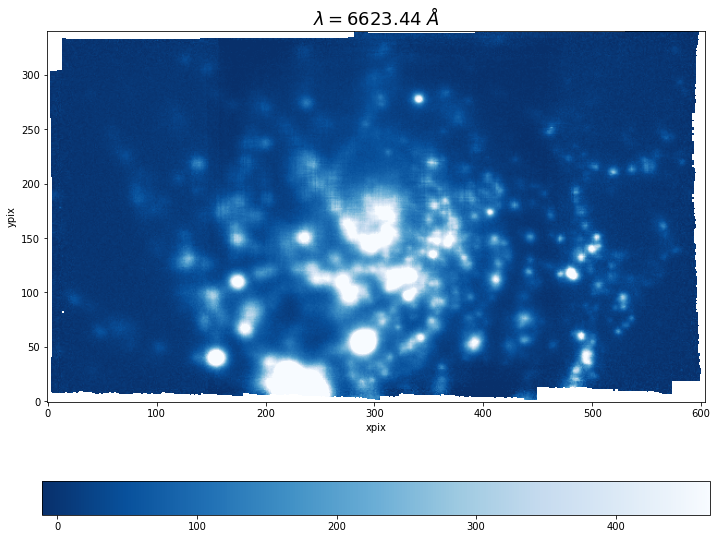

In [7]:
img_data=cube[index]

plot_image(img_data,wavelen, index, 'Blues_r')

In [8]:
print('Min:', np.nanmin(img_data))
print('Max:', np.nanmax(img_data))
print('Mean:', np.nanmean(img_data))
print('Stdev:', np.nanstd(img_data))

Min: -67.27145
Max: 6526.5054
Mean: 62.408295
Stdev: 175.11049


In [9]:
len(img_data.flatten())
y_len*x_len

205964

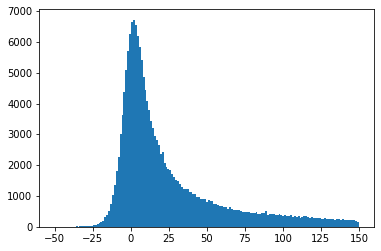

In [10]:
histogram = plt.hist(img_data.flatten(), bins='auto',range=[-50,150])

## Plotting cube at various wavelengths

In [11]:
W=5000
V=5510 #V (Visible/Green): ~551 nm
R=6580 #R (Red): ~658 nm

halpha=6563

xx=[W,V,R,halpha_obs]

selection=findWavelengths(wave, xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

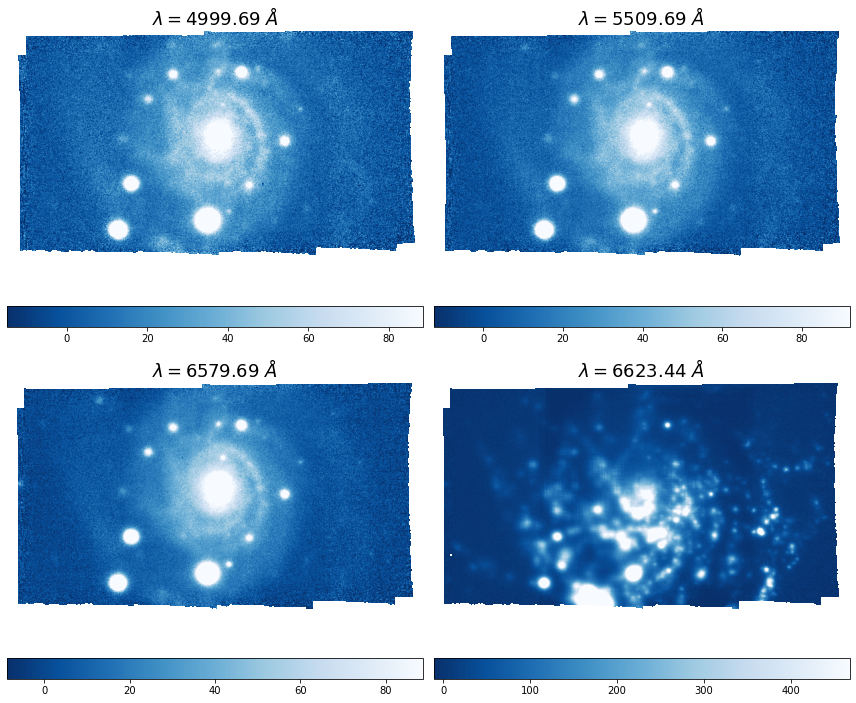

In [12]:
plot_image(cube[indices],wave[indices], indices, 'Blues_r')

## Making a gif around Halpha

In [13]:
xx=[halpha_obs-10,halpha_obs+10]

selection=findWavelengths(wave,xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

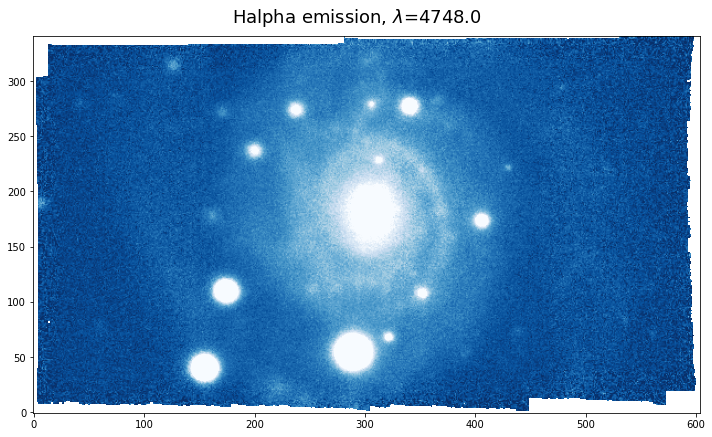

In [14]:


image_array = cube[indices[0]:indices[1]]



fig, ax = plt.subplots(figsize=(10, 8))


# Set the initial image
image=cube[indices[0]];
lo,up = np.nanpercentile(image,2),np.nanpercentile(image,98)

im = ax.imshow(image, animated=True,cmap="Blues_r",origin='lower',clim=(lo,up))
plt.tight_layout()
def update(i):
    im.set_array(image_array[i])
    fig.suptitle("Halpha emission, $\lambda$="+str(round(wave[i],0)),fontsize=18,y=0.85)
    
    return im,


# Create the animation object
animation_fig = animation.FuncAnimation(fig, update, frames=len(image_array), interval=400, blit=True,repeat_delay=15,)

# Show the animation
plt.tight_layout()
plt.show()

animation_fig.save("im.gif")

In [15]:
from PIL import Image

im = []
for n in range(20):
    arr = np.random.randint(low = 0, high = 255, size = (300, 300, 3))
    im.append(Image.fromarray(arr.astype('uint8')))

im[0].save('im.gif', save_all=True, append_images=im[1:], optimize=False, duration=200, loop=0)

## Plotting median within a certain waveband

0 1
[4748.44238281 4749.69238281]


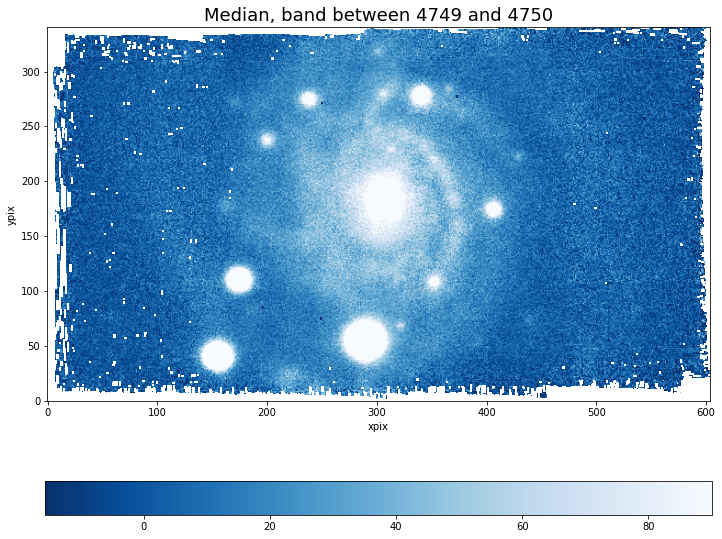

In [16]:
med=median(cube,wave,[4749,4750])


plot_image(med,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Median, band between 4749 and 4750')


#median(cube,wave,[np.max(wave),np.min(max)])


## Plotting average within a certain waveband

0 1
[4748.44238281 4749.69238281]


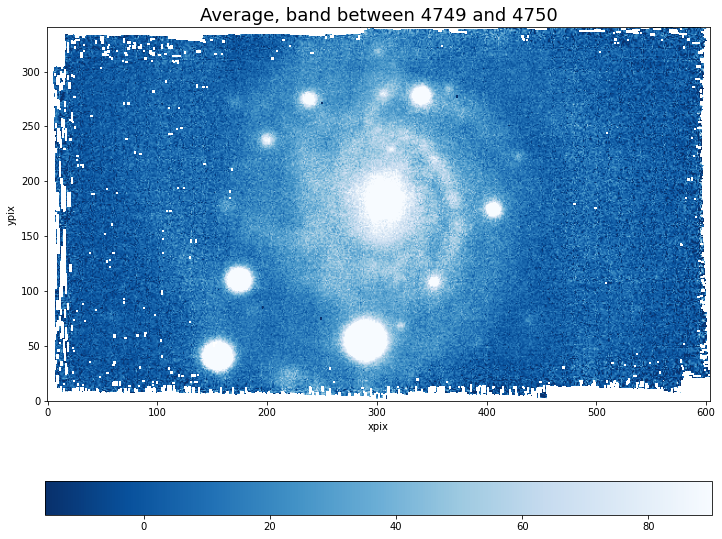

In [17]:
ave=average(cube,wave,[4749,4750])


plot_image(ave,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Average, band between 4749 and 4750')


#ave(cube,wave,[np.max(wave),np.min(max)])


# Binning

## Binning 2x2

In [18]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

img_data=cube[index]

print("dimensions before binning: ", len(img_data),len(img_data[0]))

binned_data=binning(img_data,4)

print("dimensions after binning: ", len(binned_data),len(binned_data[0]))


dimensions before binning:  341 604
dimensions after binning:  86 151


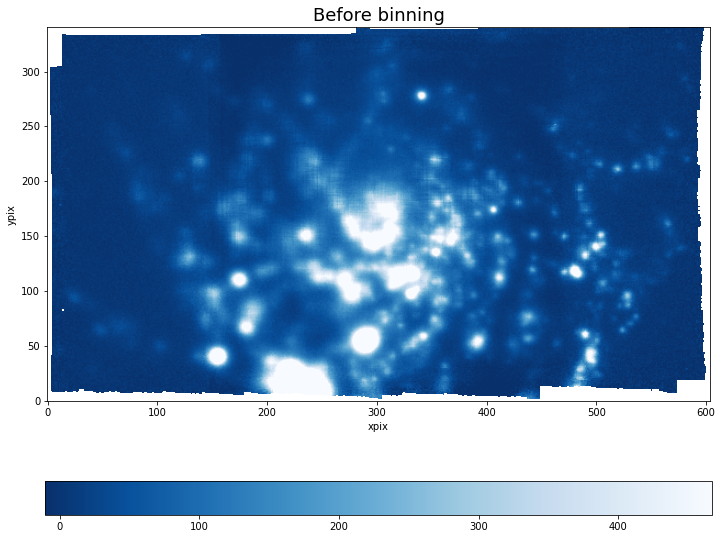

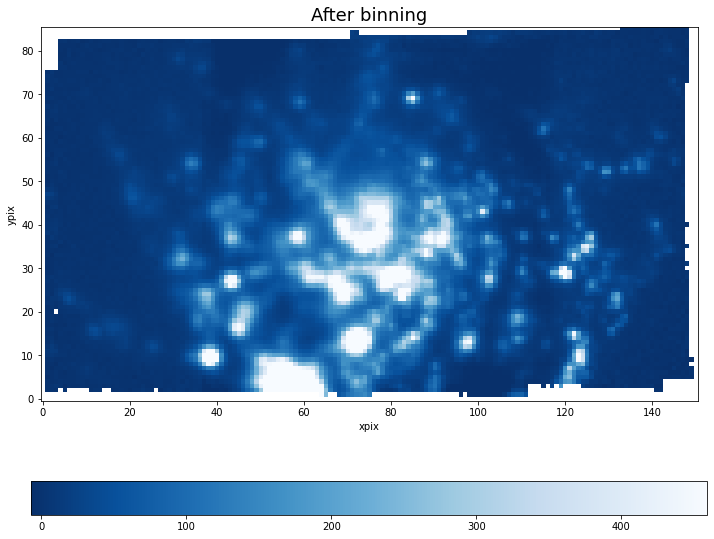

In [19]:
plot_image(img_data,wavelen, index, 'Blues_r', "Before binning")
plot_image(binned_data,wavelen, index, 'Blues_r',"After binning")

In [20]:
np.shape(cube)

(3681, 341, 604)

## Region w/ high SNR

Zoom in area of background signal

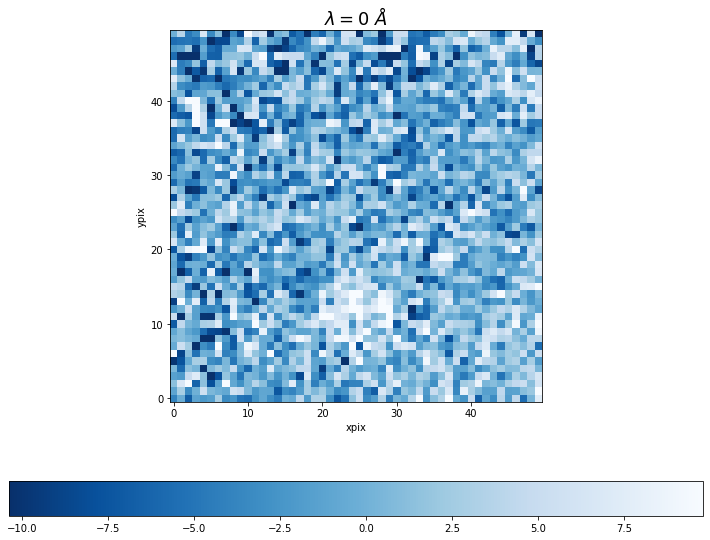

In [21]:
bg=img_data[270:320, 15:65]
plot_image(bg,0,0,'Blues_r')

In [22]:
# background noise
noise = np.nanstd(bg)

snr_map = img_data / noise
mean_snr = np.nanmean(snr_map)
threshold = 0.5 * mean_snr


square_size = 1000


#best square
best_square = None
best_snr = -np.inf  
best_coords = (0, 0)


h, w = image.shape
for y in range(0, h - square_size + 1, square_size):
    for x in range(0, w - square_size + 1, square_size):
        
        block = snr_map[y:y+square_size, x:x+square_size]

        block_mean_snr = np.mean(block)

        if block_mean_snr > best_snr:
            best_snr = block_mean_snr
            best_square = block
            best_coords = (y, x)

if best_square is not None:
    np.save("../best_snr_square.npy", best_square)
    print(f"Saved the best SNR square at {best_coords} with mean SNR {best_snr:.2f}")

best_square = np.load("../best_snr_square.npy")
print(best_square)

[[24.733227  23.659376  23.296698  ...  8.002031   6.8485003  6.3015223]
 [25.289423  24.369799  22.9598    ...  6.986258   6.1466255  7.6385193]
 [23.431923  22.804512  24.332674  ...  7.397483   7.678427   5.837128 ]
 ...
 [31.349007  31.20333   35.570824  ... 10.715965  10.636392  11.201308 ]
 [28.347382  27.447086  30.333021  ...  9.965655  11.025977  11.6718   ]
 [25.059385  26.852942  27.987513  ...  9.946177  11.049753  11.41961  ]]


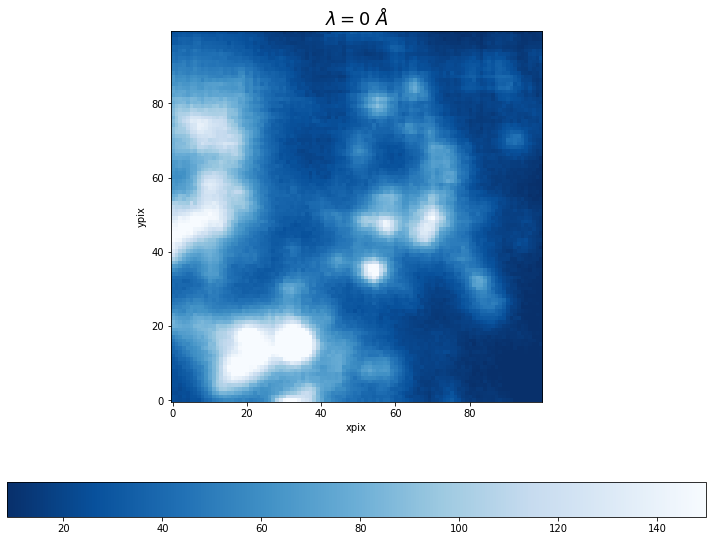

In [23]:
plot_image(best_square,0,0,'Blues_r')

## Binning of galaxy bulge

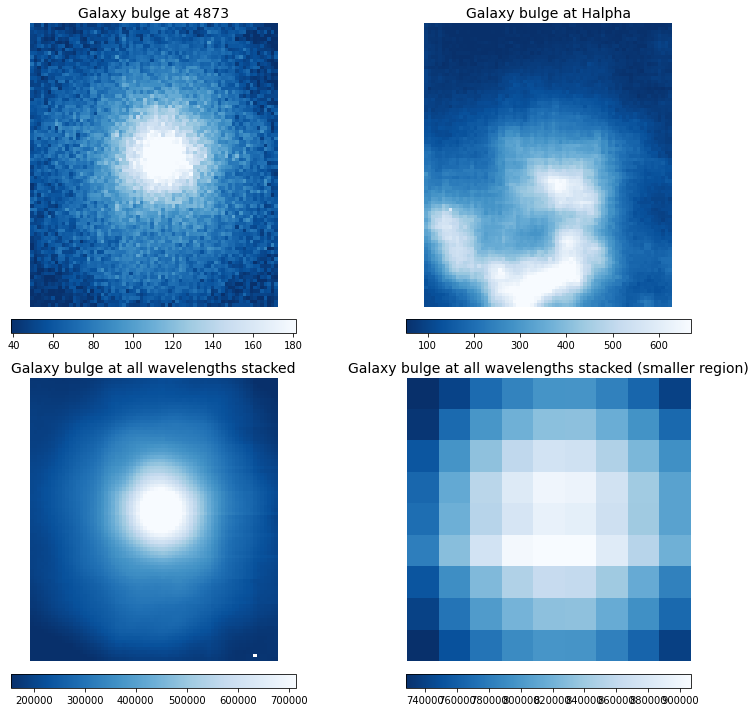

In [24]:
bulge=cube[:,140:220,270:340];
ebulge=ecube[:,140:220,270:340];

small_bulge=cube[:,178:187,302:311]
#small_bulge=cube[:,181:185,305:307]

images = [
    bulge[100],
    bulge[index], 
    stack_all(bulge),
    stack_all(small_bulge)
]

titles = [
    "Galaxy bulge at "+str(int(round(wave[100],0))),
    "Galaxy bulge at Halpha",
    "Galaxy bulge at all wavelengths stacked",
    "Galaxy bulge at all wavelengths stacked (smaller region)"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [25]:
stacked_bulge=stack(bulge,wave,number_images=10,central_wavelength=halpha_obs)
stacked_ebulge=stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs)

binned_bulge=binning(bulge[index],4)
ebinned_bulge=binning(ebulge[index],4)

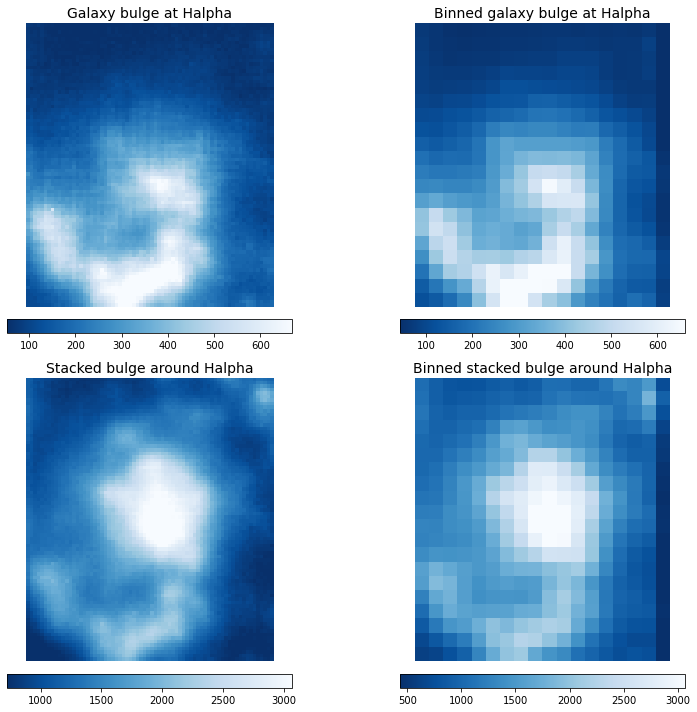

In [26]:
images = [
    bulge[index], 
    binned_bulge, 
    stacked_bulge, 
    binning(stacked_bulge, 4)
]

titles = [
    "Galaxy bulge at Halpha",
    "Binned galaxy bulge at Halpha",
    "Stacked bulge around Halpha",
    "Binned stacked bulge around Halpha"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [27]:
binned_stacked_bulge=binning(stack(bulge,wave,number_images=10,central_wavelength=halpha_obs),4)
binned_stacked_ebulge=binning(stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs),4)

print("Median SNR before binning = ",np.median(signaltonoise(stacked_bulge,stacked_ebulge)), "\nMedian SNR after stacking&binning = ",np.median(signaltonoise(binned_stacked_bulge,binned_stacked_ebulge)))
      

Median SNR before binning =  4.6879454 
Median SNR after stacking&binning =  4.642662903020382


so SNR is lower after binning?(*) could be because i am computing the same SNR for a bin for all the pixels that were collapsed

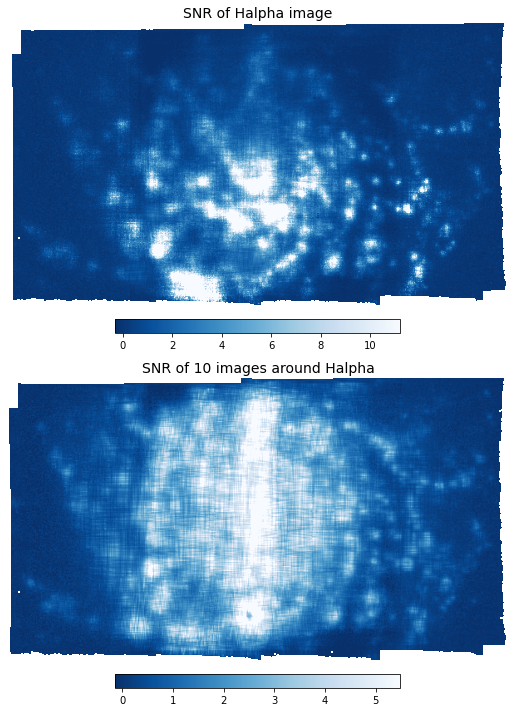

Average of SNR in the image is  1.5096688
Average of SNR in the image is  1.4523461
Median of SNR in the image is  0.4109841
Median of SNR in the image is  0.79283464

SNR gets worse on average, but not in median(**)


In [28]:
snr1=signaltonoise(cube[index],ecube[100])
#plot_image(snr,0,0,colormap='Blues_r',title="SNR of Halpha image")

stacked_galaxy=stack(cube,wave,number_images=10,central_wavelength=halpha_obs)
stacked_uncertainties=stack(ecube,wave,number_images=10,central_wavelength=halpha_obs)


snr2=signaltonoise(stacked_galaxy,stacked_uncertainties)

plot_images([snr1,snr2],wavelengths=[0, 0],colormap='Blues_r',titles=["SNR of Halpha image","SNR of 10 images around Halpha"])

print("Average of SNR in the image is ",np.nanmean(snr1))
print("Average of SNR in the image is ",np.nanmean(snr2))
print("Median of SNR in the image is ",np.nanmedian(snr1))
print("Median of SNR in the image is ",np.nanmedian(snr2))
print("\nSNR gets worse on average, but not in median(**)")

## Stacked galaxy bulge spetra

Text(0.5, 1.0, 'Median spectra of galaxy bulge')

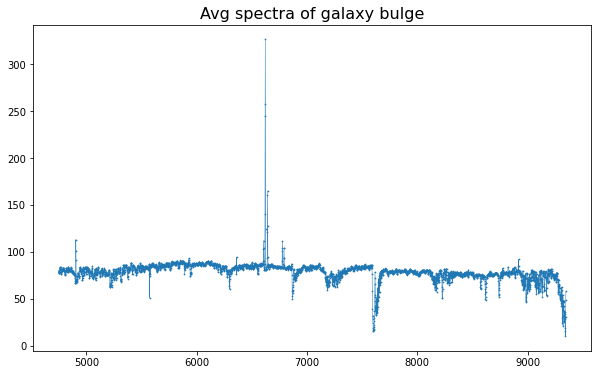

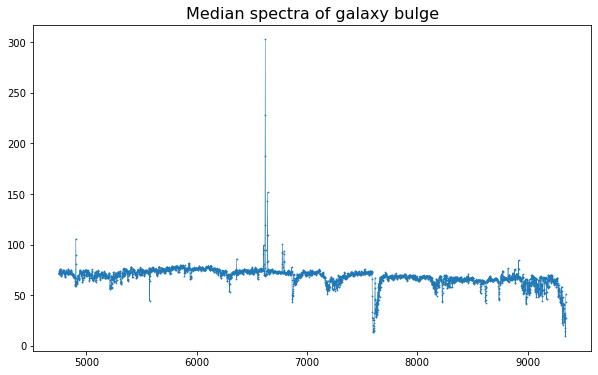

In [29]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(bulge),s=0.5)
plt.title("Avg spectra of galaxy bulge",fontsize=16)



plt.figure(figsize=(10,6))

median_bulge=median_spectra_of_region(bulge)
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)
plt.title("Median spectra of galaxy bulge",fontsize=16)




In [30]:
new_wave=wave/(1+z)
halpha_obs

6623.2630764

in x_obs we look for halpha_obs=6562.8*(1+z)

so in x_obs/(1+z) we look for 6562.8

Text(0.5, 1.0, 'Median spectra of smaller region of galaxy bulge')

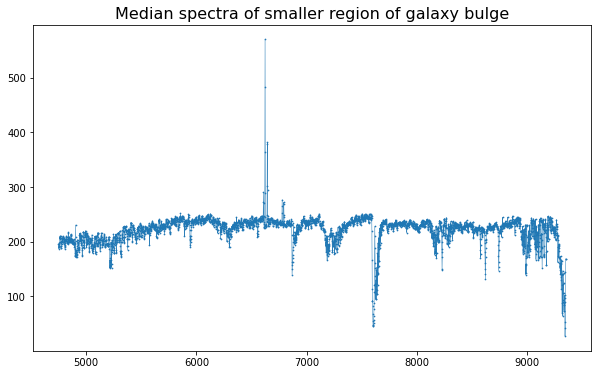

In [31]:
plt.figure(figsize=(10,6))



plt.plot(wave,median_spectra_of_region(small_bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_spectra_of_region(small_bulge),s=0.5)
plt.title("Median spectra of smaller region of galaxy bulge",fontsize=16)

#plt.xlim(halpha_obs-50,halpha_obs+50)

## Different galaxy regions

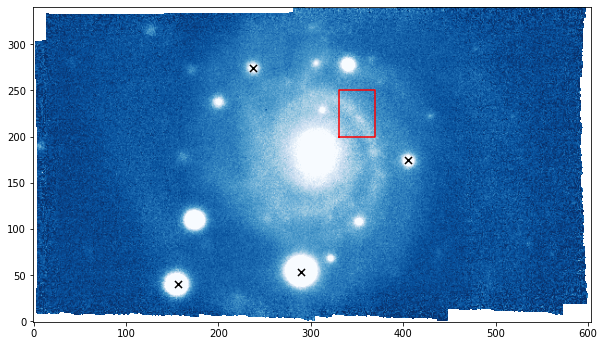

In [32]:
arm=cube[:,200:250,330:370]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [330, 330, 370, 370, 330]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline


star_x=[289,156,237,405]#175
star_y=[53,40,274,175]#110
plt.scatter(star_x,star_y,s=50,marker='x',c='black')


spectra at star (single pixel)

In [33]:
arr=np.transpose((star_x,star_y))
lbls = ["Star (single pixel spectra) at (x,y)= ({},{})".format(row[0], row[1]) for row in arr]

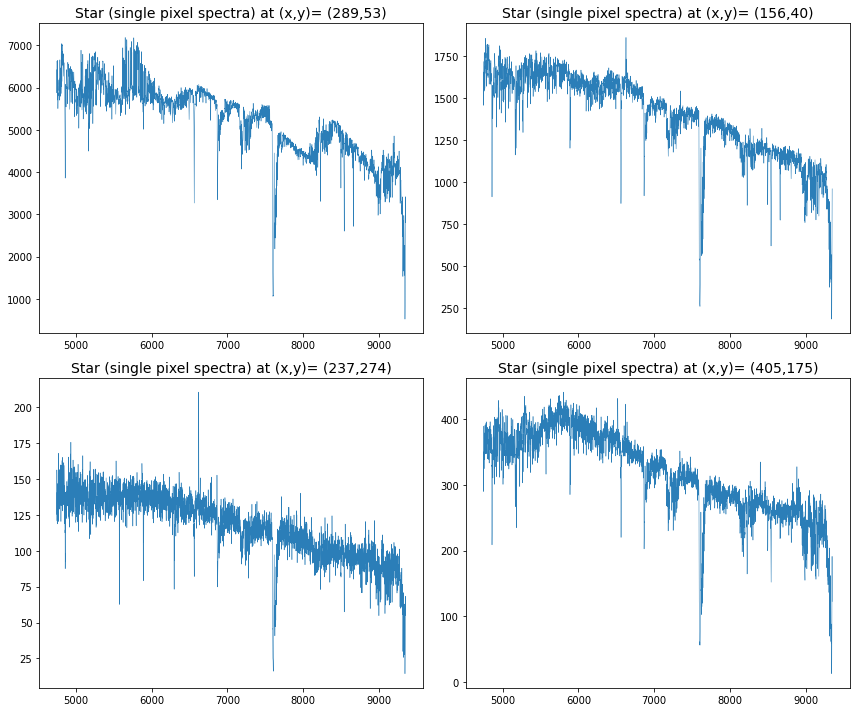

In [34]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = np.array(axes).reshape(-1)
    
for i in range(4):
    lo, up = np.nanpercentile(images[i], 2), np.nanpercentile(images[i], 98)
    im = axes[i].plot(wave,cube[:,star_y[i],star_x[i]],linewidth=0.5,alpha=0.95)
    axes[i].set_title(lbls[i], fontsize=14)
    
# Hide unused subplots if grid has extra slots
for j in range(4, len(axes)):
    axes[j].axis('off')
    
    

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Median spectra of galaxy arm')

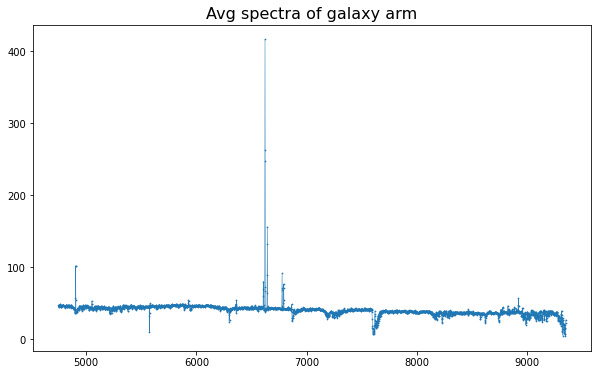

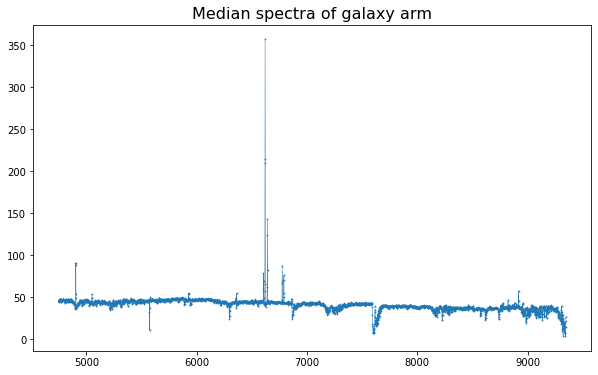

In [35]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(arm),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(arm),s=0.5)
plt.title("Avg spectra of galaxy arm",fontsize=16)



plt.figure(figsize=(10,6))

median_arm=median_spectra_of_region(arm)
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy arm",fontsize=16)

Text(0.5, 1.0, 'Median spectra of galaxy bg')

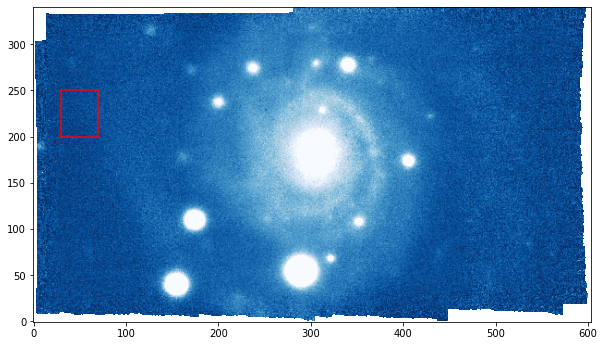

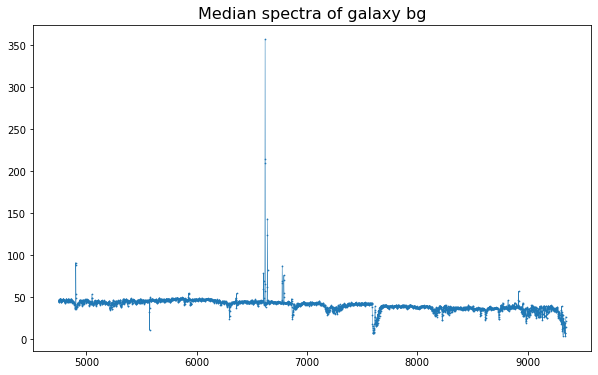

In [36]:
bg=cube[:,200:250,30:70]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [30, 30, 70, 70, 30]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline




plt.figure(figsize=(10,6))

plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy bg",fontsize=16)

## Plotting uncertainty of spectra

In [37]:
uncertainty=ecube[:,200:250,30:70]
y_err=np.sqrt(np.median(uncertainty, axis=(1, 2)));

np.median(uncertainty[2])

88.63081

In [38]:
median_bg=median_spectra_of_region(bg)

y_err2=mad(median_bg)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 0.21641612


In [39]:
np.sqrt(y_err[2])

3.0682886

In [40]:
median_bg=median_spectra_of_region(bg)

Text(0.5, 1.0, 'Background spectra')

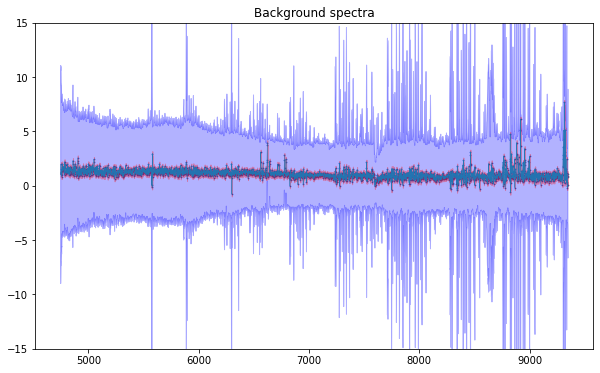

In [41]:
plt.figure(figsize=(10,6))

plt.plot(wave,median_bg,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bg,s=0.5)

plt.fill_between(wave,median_bg - y_err, median_bg + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bg - y_err2, median_bg + y_err2, color='red', alpha=0.3, label="Uncertainty")
plt.ylim(-15,15)

plt.title("Background spectra")

In [42]:
y_err2=mad(median_bulge)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 3.808239


Text(0.5, 1.0, 'Bulge spectra')

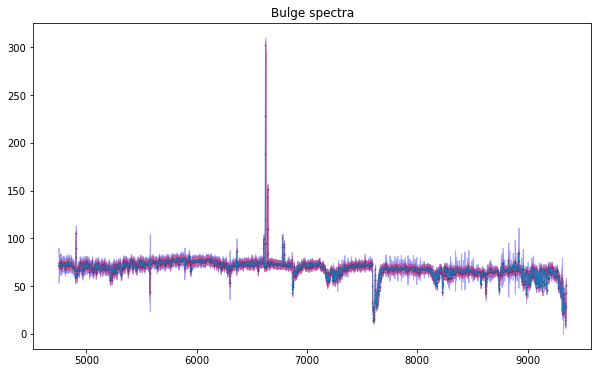

In [43]:
y_err=np.sqrt(np.median(ebulge, axis=(1, 2)));#median absolute deviaton=MAD

plt.figure(figsize=(10,6))

plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bulge - y_err2, median_bulge + y_err2, color='red', alpha=0.3, label="Uncertainty")
#plt.ylim(-15,15)
plt.title("Bulge spectra")

In [44]:
print("median snr of spectra is ",np.nanmedian(signaltonoise_spec(median_bulge,y_err)))

median snr of spectra is  13.528046


# EW

## EW - parametric

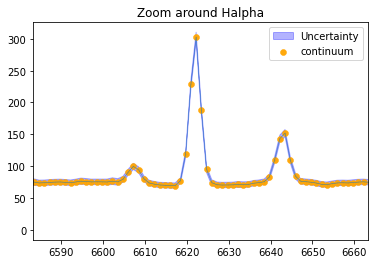

In [45]:
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")

x_min, x_max= plt.xlim(halpha_obs-40,halpha_obs+40)
plt.title("Zoom around Halpha")
x_chopped,y_chopped=chop_data(wave,median_bulge,x_min,x_max)

plt.scatter(x_chopped,y_chopped,linewidth=0.5,alpha=0.95,color="orange",label="continuum")

plt.legend()

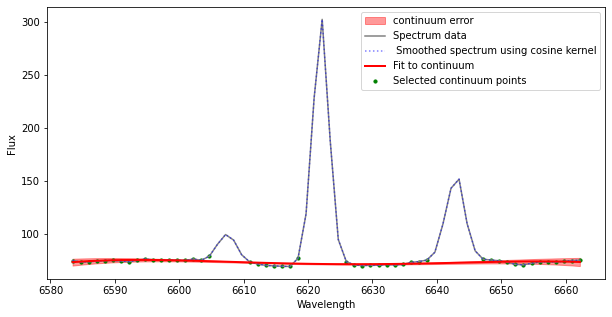

In [46]:
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

continuum_fit, x_continuum, y_continuum, continuum_err =continuum(x_chopped,y_smooth)

y_continuum_fit = continuum_fit(x_chopped)


cont_err=continuum_err(x_chopped)

plt.figure(figsize=(10, 5))
plt.fill_between(x_chopped,y_continuum_fit - cont_err, y_continuum_fit + cont_err, color='red', alpha=0.4, label="continuum error")
plt.plot(x_chopped, y_chopped, label="Spectrum data", color="gray")
plt.plot(x_chopped, y_smooth, label=" Smoothed spectrum using cosine kernel", color="blue", alpha=0.5,linestyle="dotted")
plt.plot(x_chopped, y_continuum_fit, label="Fit to continuum", color="red", linewidth=2)
plt.scatter(x_continuum, y_continuum, color="green", s=10, label="Selected continuum points")
plt.xlabel("Wavelength")
plt.ylabel("Flux")
plt.legend()
#plt.xlim(6400,6500)
plt.show()

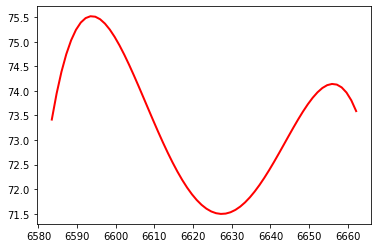

In [47]:
plt.plot(x_chopped, y_continuum_fit, color="red", linewidth=2)


Text(0.5, 1.0, 'Zoom around Halpha')

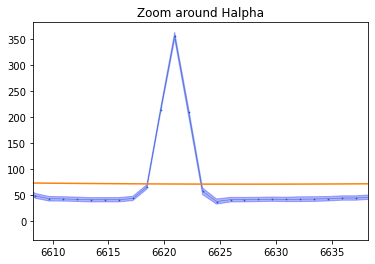

In [48]:
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)

plt.fill_between(wave,median_arm - y_err, median_arm + y_err, color='blue', alpha=0.3, label="Uncertainty")
#plt.ylim(-5,100)
plt.xlim(halpha_obs-15,halpha_obs+15)
plt.plot(x_chopped,y_continuum_fit)
plt.title("Zoom around Halpha")

Fitted Amplitude (A): 237.73196393550393
Fitted Mean (mu): 6622.030050876312
Fitted Standard Deviation (sigma): 2.2772364397374196
Integral using Trapezoidal's rule: 1220.6318


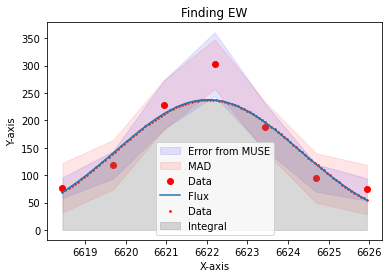

In [49]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6627)[1])

x = wave[bound1:bound2]
y = median_bulge[bound1:bound2]

y_err=np.nanmedian(ebulge[bound1:bound2], axis=(1, 2));
y_err2=np.full(len(y), mad(y))


initial_guess = initial_guess = [np.max(y), np.mean(x), np.std(x)]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess, sigma=y_err, absolute_sigma=True)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(np.min(x), np.max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])



# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")


##

xx = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

#integral
integral = trapz(y_fit, xx)

print(f"Integral using Trapezoidal's rule: {integral:.4f}")

plt.fill_between(x,y - y_err, y + y_err, color='blue', alpha=0.1, label="Error from MUSE")

plt.fill_between(x,y - y_err2, y + y_err2, color='red', alpha=0.1, label="MAD")

plt.scatter(x, y, label="Data", color="red")
plt.plot(xx, y_fit, label="Flux")
plt.scatter(xx, y_fit, label="Data", color="red",s=2.4)
#plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(xx, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


integrating smoothed spectra

In [50]:
A, mu, sigma = 1,2,3

#df_dA = np.exp(-((x - mu) ** 2) / (2 * sigma ** 2))
df_dA = lambda x:  np.exp(-((x - mu) ** 2) / (2 * sigma ** 2))
#df_dmu = A * np.exp(-((x - mu) ** 2) / (2 * sigma ** 2)) * (x - mu) / sigma**2
df_dmu = lambda x: A * np.exp(-((x - mu) ** 2) / (2 * sigma ** 2)) * (x - mu) / sigma**2
    
df_dsigma = lambda x: A * np.exp(-((x - mu) ** 2) / (2 * sigma ** 2)) * (x - mu)**2 / sigma**3
    
sigma_A = 1
sigma_mu = 1
sigma_sigma=1

err = lambda x: np.sqrt((df_dA(x) * sigma_A)**2 + (df_dmu(x) * sigma_mu)**2 + (df_dsigma(x) * sigma_sigma)**2)


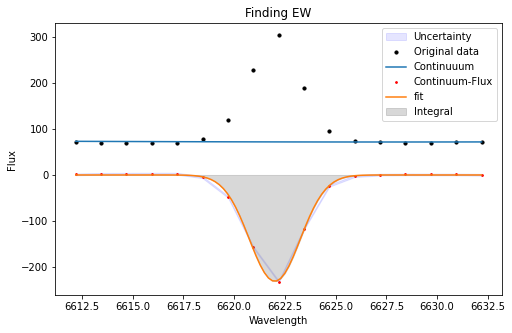

EW calculated through a parametric approach is ==  -10.077910414078875  +/-  0.6459865564910431


In [51]:
bound1=halpha_obs-40
bound2=halpha_obs+40

median_bulge_err=median_spectra_of_region(ebulge)

x,y,MUSEerr=chop_data(wave,median_bulge,bound1,bound2,median_bulge_err)

res=EW_parametric(x,y,MUSEerr,continuum_fit,continuum_err,method=0,plots=True)
print("EW calculated through a parametric approach is == ", res[0], " +/- ", res[1])

## fitting cont+peak together - parametric

In [197]:
halpha_obs

6623.2630764

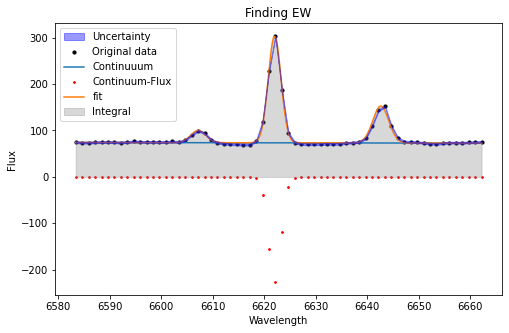

EW calculated through a parametric approach is ==  (-9.710578705381835, 0)


In [222]:
bound1=halpha_obs-40
bound2=halpha_obs+40

x,y=chop_data(wave,median_bulge,bound1,bound2)

    
print("EW calculated through a parametric approach is == ", EW_parametric(x,y,MUSEerr,continuum_fit,continuum_err,central_wavelength=halpha_obs,method=1,plots=True))

## picking region

In [53]:
x1=300
x2=420
y1=120
y2=200

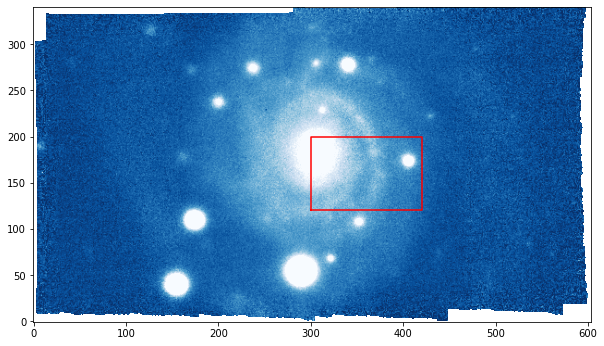

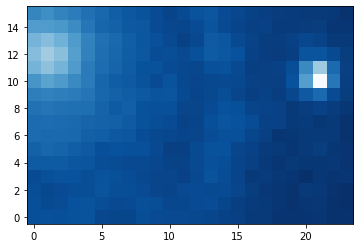

(8, 12)


In [54]:
region=cube[:,y1:y2,x1:x2]
region_err=ecube[:,y1:y2,x1:x2]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [x1, x1, x2, x2, x1]
y_coords = [y1, y2, y2, y1, y1] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline

plt.show()

plt.imshow(binning(region[10], 5),"Blues_r",origin='lower');

plt.show()

print(np.shape(binning(region[10], 10)))

In [55]:
binned_region=[]
binned_region_err=[]

for w in range(0,len(wave)):
    binned_region.append(binning(region[w], 5))
    binned_region_err.append(binning(region_err[w], 5))

In [56]:
binned_region=np.array(binned_region)
binned_region_err=np.array(binned_region_err)

MUSE_err=np.sqrt(np.median(binned_region_err, axis=(1, 2)))

## EW map - parametric

PLOTS  True


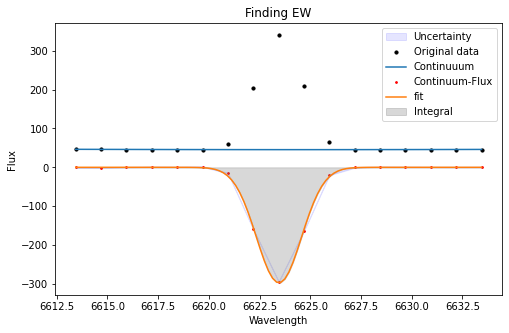

EW = -18.154  +/- 0.635  at (i,j)= 0 , 0
PLOTS  True


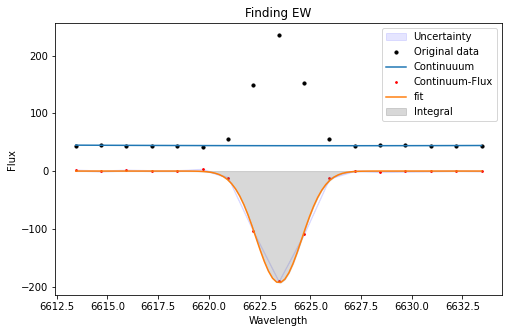

EW = -12.364  +/- 0.564  at (i,j)= 0 , 1
PLOTS  True


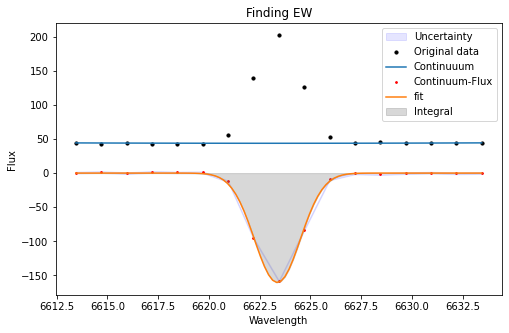

EW = -10.402  +/- 0.708  at (i,j)= 0 , 2
PLOTS  True


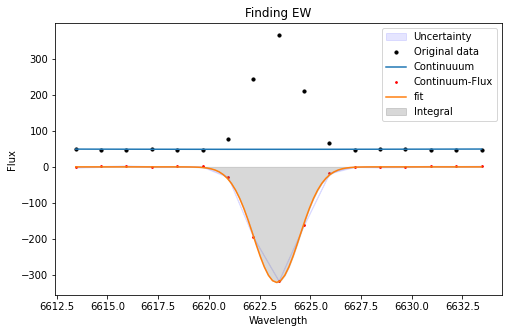

EW = -18.624  +/- 0.750  at (i,j)= 0 , 3
PLOTS  True


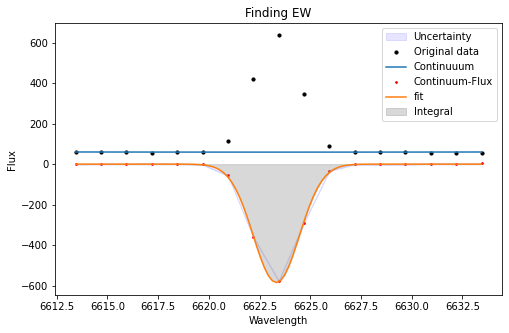

EW = -27.997  +/- 1.092  at (i,j)= 0 , 4
PLOTS  True


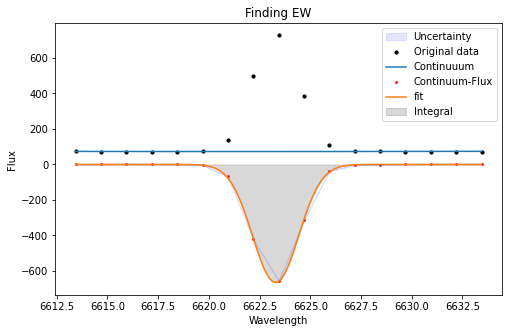

EW = -25.911  +/- 0.907  at (i,j)= 0 , 5
PLOTS  True


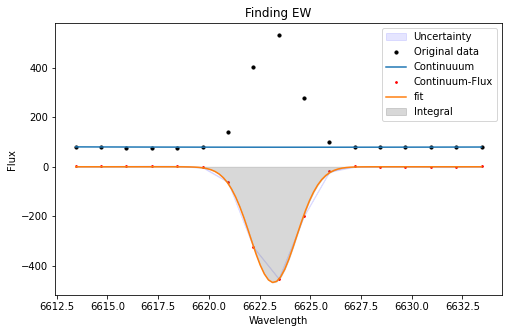

EW = -16.853  +/- 0.560  at (i,j)= 0 , 6
PLOTS  True


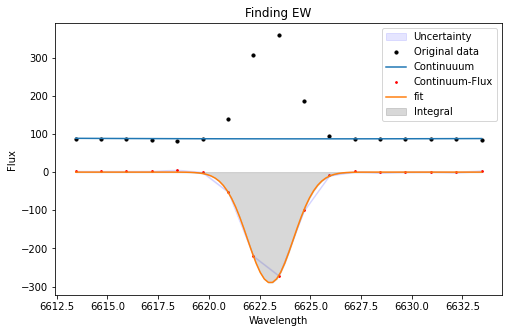

EW = -9.412  +/- 0.461  at (i,j)= 0 , 7
PLOTS  True


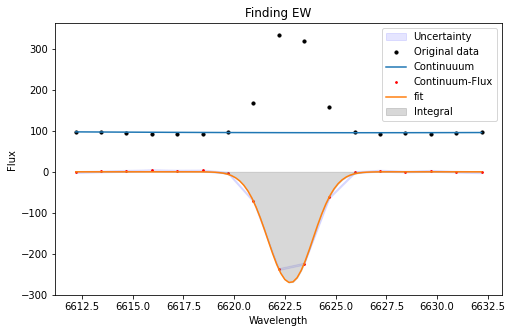

EW = -7.915  +/- 0.596  at (i,j)= 0 , 8
PLOTS  True


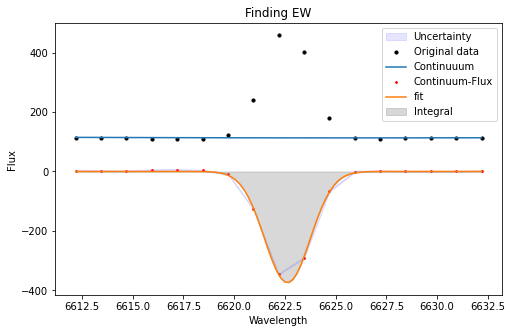

EW = -9.312  +/- 0.486  at (i,j)= 0 , 9
PLOTS  True


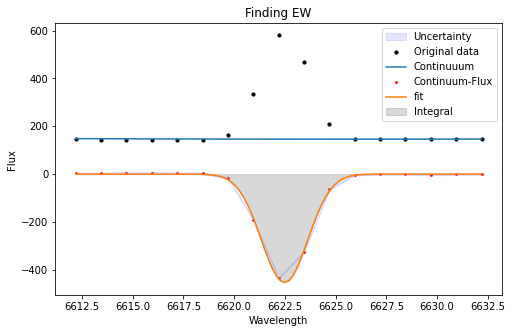

EW = -8.907  +/- 0.527  at (i,j)= 0 , 10
PLOTS  True


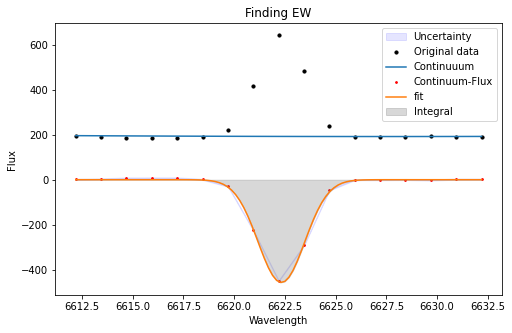

EW = -6.832  +/- 0.337  at (i,j)= 0 , 11
PLOTS  True


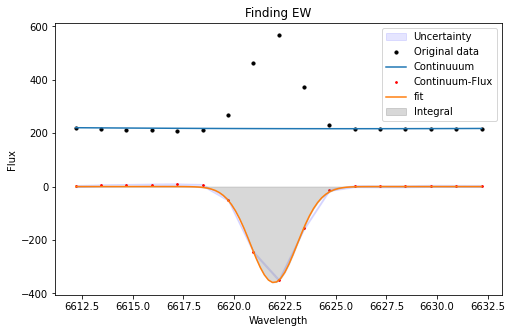

EW = -4.738  +/- 0.440  at (i,j)= 0 , 12
PLOTS  True


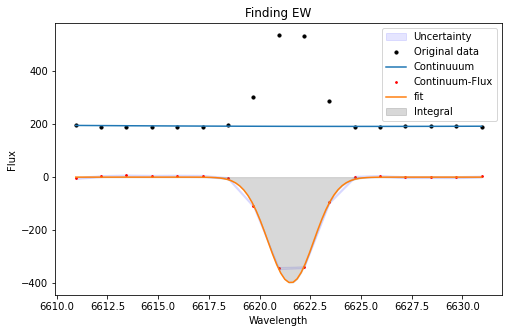

EW = -5.886  +/- 0.487  at (i,j)= 0 , 13
PLOTS  True


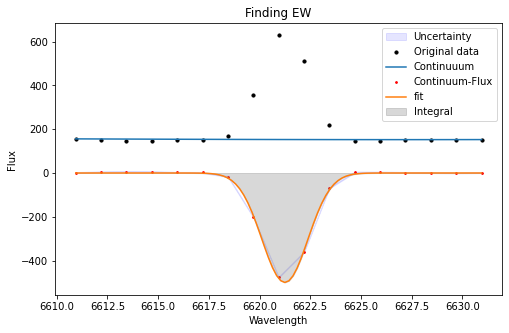

EW = -9.284  +/- 0.421  at (i,j)= 0 , 14
PLOTS  True


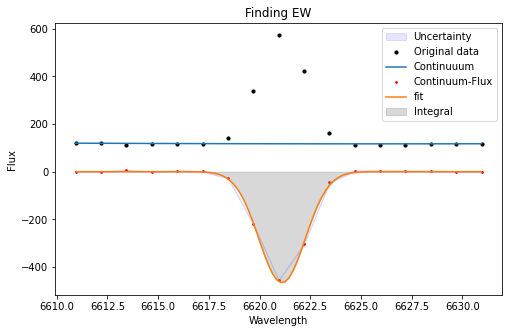

EW = -11.367  +/- 0.537  at (i,j)= 0 , 15
PLOTS  True


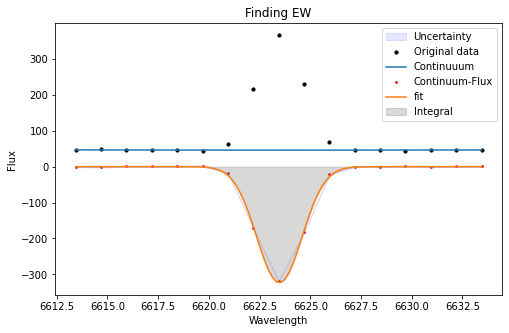

EW = -19.648  +/- 0.715  at (i,j)= 1 , 0
PLOTS  True


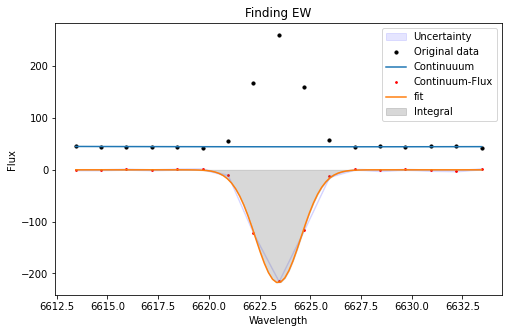

EW = -13.639  +/- 0.804  at (i,j)= 1 , 1
PLOTS  True


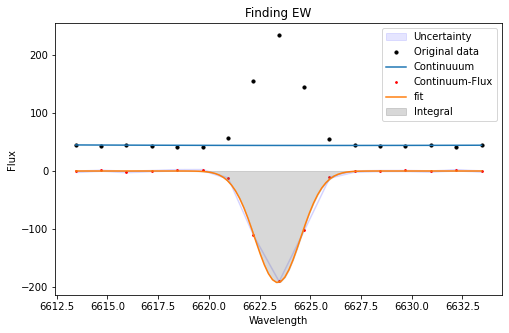

EW = -12.253  +/- 0.838  at (i,j)= 1 , 2
PLOTS  True


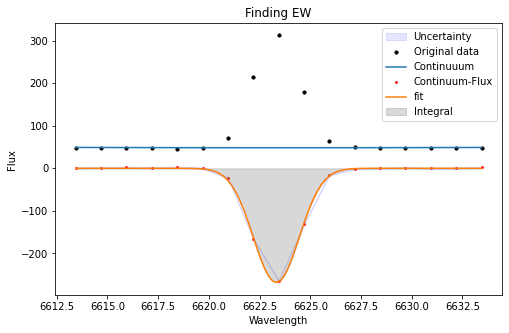

EW = -15.695  +/- 0.882  at (i,j)= 1 , 3
PLOTS  True


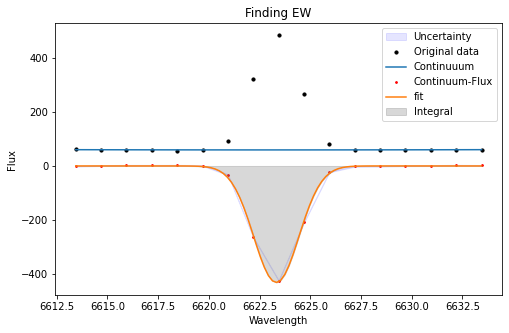

EW = -20.305  +/- 0.751  at (i,j)= 1 , 4
PLOTS  True


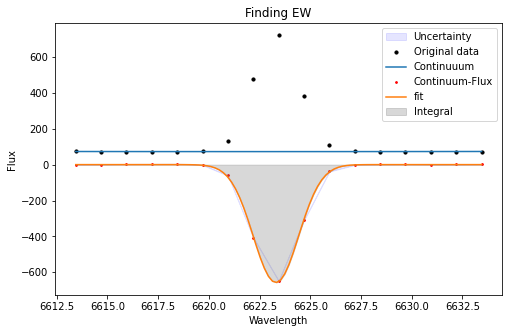

EW = -25.408  +/- 0.602  at (i,j)= 1 , 5
PLOTS  True


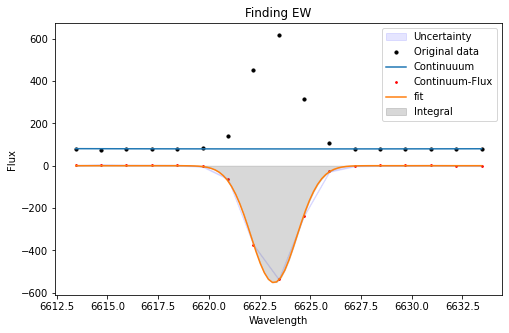

EW = -19.649  +/- 0.742  at (i,j)= 1 , 6
PLOTS  True


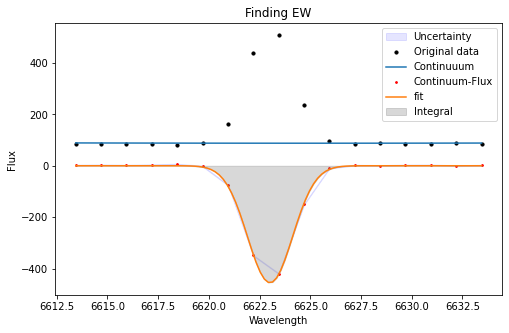

EW = -14.447  +/- 0.484  at (i,j)= 1 , 7
PLOTS  True


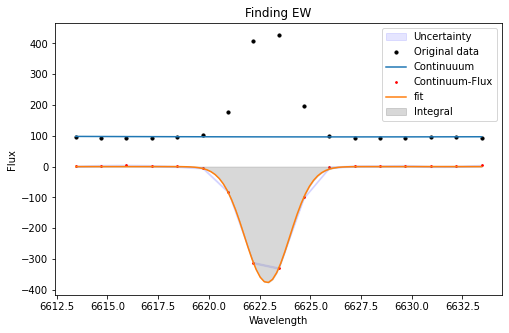

EW = -10.842  +/- 0.610  at (i,j)= 1 , 8
PLOTS  True


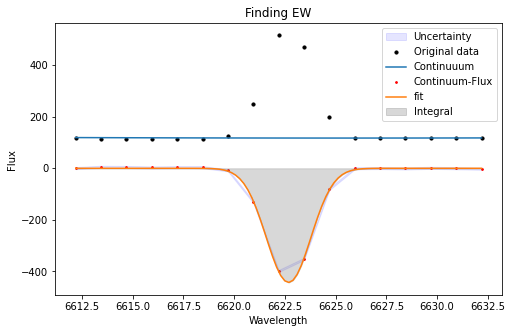

EW = -10.402  +/- 0.809  at (i,j)= 1 , 9
PLOTS  True


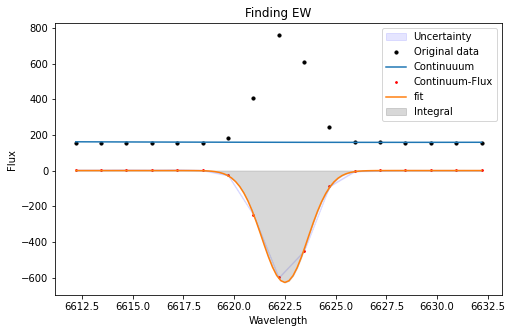

EW = -11.213  +/- 0.418  at (i,j)= 1 , 10
PLOTS  True


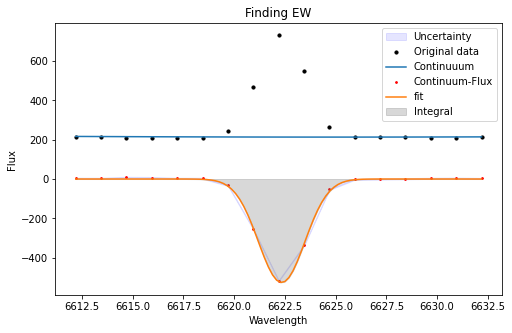

EW = -7.080  +/- 0.367  at (i,j)= 1 , 11
PLOTS  True


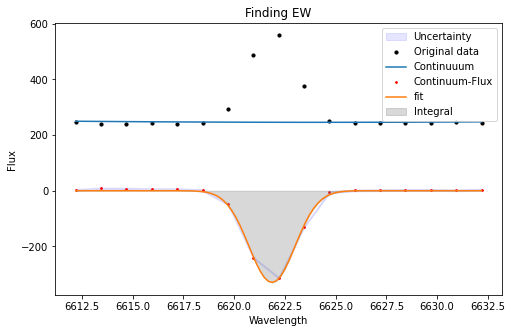

EW = -3.805  +/- 0.348  at (i,j)= 1 , 12
PLOTS  True


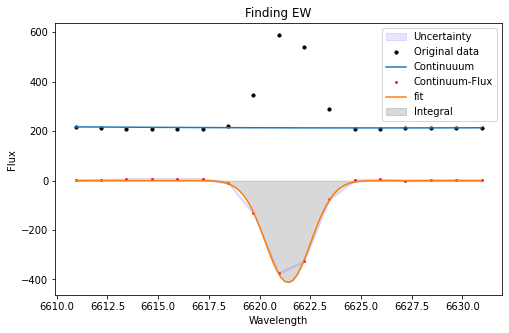

EW = -5.414  +/- 0.438  at (i,j)= 1 , 13
PLOTS  True


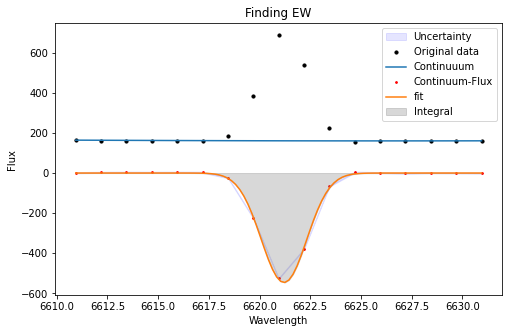

EW = -9.552  +/- 0.470  at (i,j)= 1 , 14
PLOTS  True


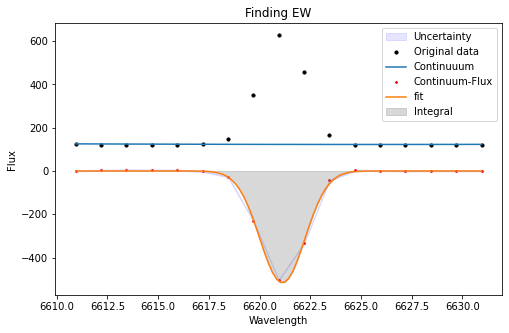

EW = -11.700  +/- 0.616  at (i,j)= 1 , 15
PLOTS  True


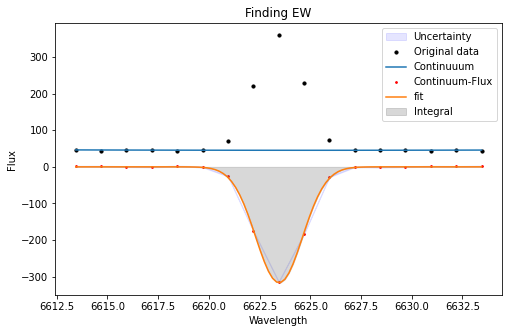

EW = -20.204  +/- 0.767  at (i,j)= 2 , 0
PLOTS  True


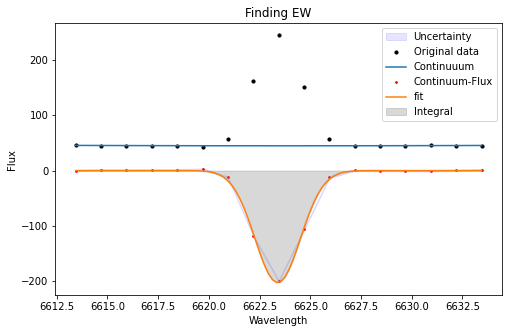

EW = -12.704  +/- 0.723  at (i,j)= 2 , 1
PLOTS  True


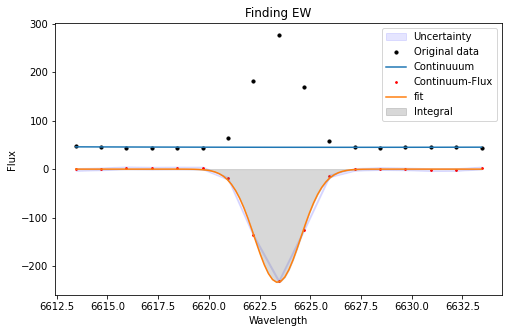

EW = -14.782  +/- 1.486  at (i,j)= 2 , 2
PLOTS  True


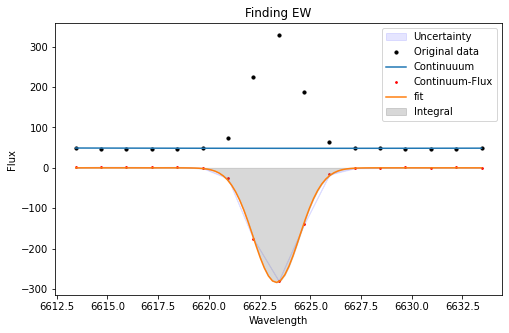

EW = -16.662  +/- 0.491  at (i,j)= 2 , 3
PLOTS  True


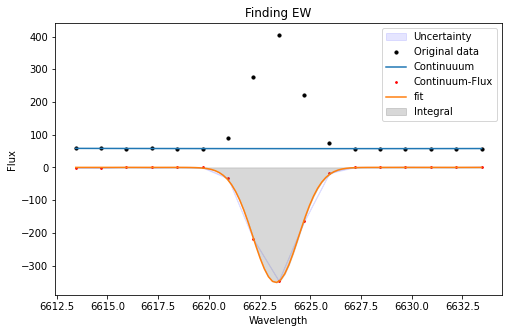

EW = -17.191  +/- 0.527  at (i,j)= 2 , 4
PLOTS  True


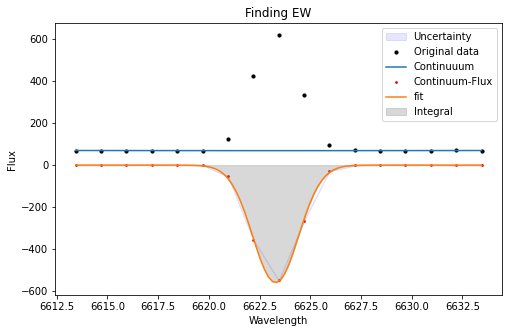

EW = -22.912  +/- 0.605  at (i,j)= 2 , 5
PLOTS  True


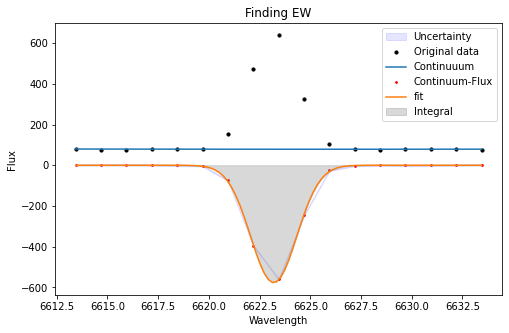

EW = -20.863  +/- 0.862  at (i,j)= 2 , 6
PLOTS  True


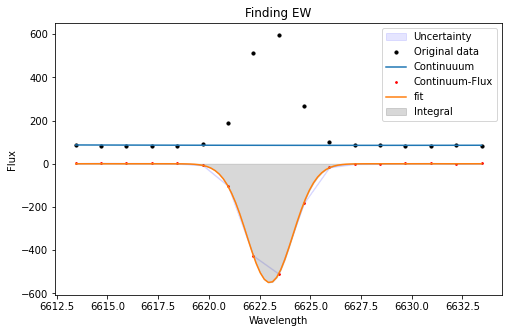

EW = -18.204  +/- 0.614  at (i,j)= 2 , 7
PLOTS  True


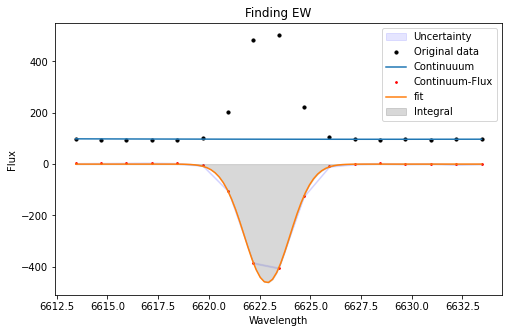

EW = -13.372  +/- 0.601  at (i,j)= 2 , 8
PLOTS  True


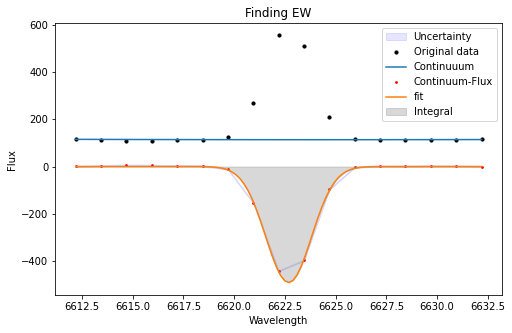

EW = -12.244  +/- 0.549  at (i,j)= 2 , 9
PLOTS  True


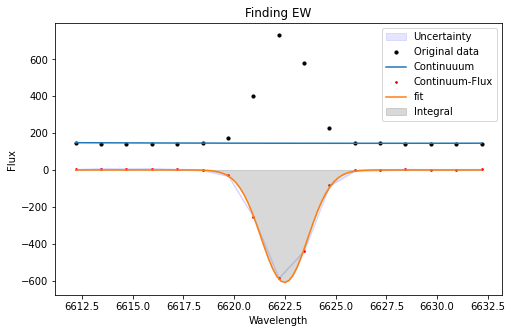

EW = -12.123  +/- 0.644  at (i,j)= 2 , 10
PLOTS  True


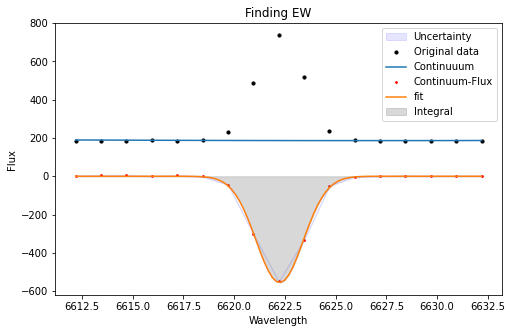

EW = -8.652  +/- 0.346  at (i,j)= 2 , 11
PLOTS  True


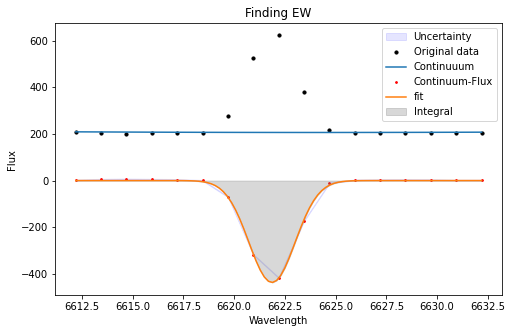

EW = -6.044  +/- 0.261  at (i,j)= 2 , 12
PLOTS  True


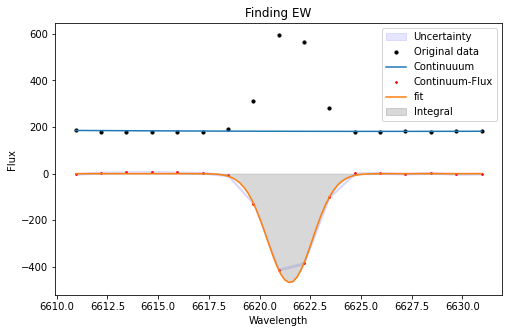

EW = -7.153  +/- 0.568  at (i,j)= 2 , 13
PLOTS  True


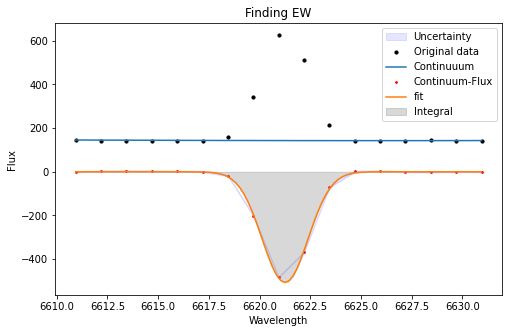

EW = -10.062  +/- 0.486  at (i,j)= 2 , 14
PLOTS  True


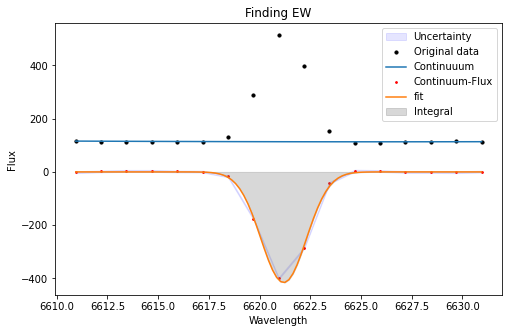

EW = -10.268  +/- 0.716  at (i,j)= 2 , 15
PLOTS  True


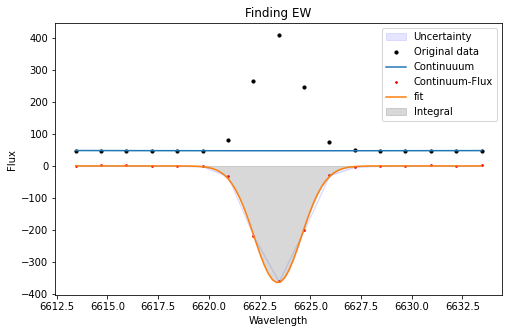

EW = -22.383  +/- 0.682  at (i,j)= 3 , 0
PLOTS  True


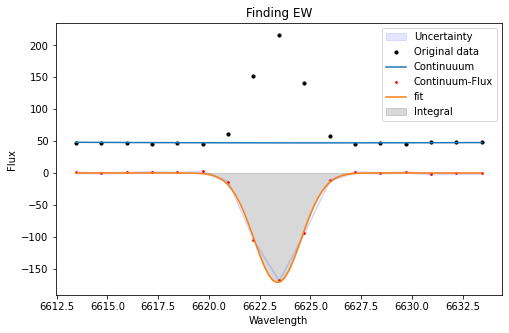

EW = -10.567  +/- 0.738  at (i,j)= 3 , 1
PLOTS  True


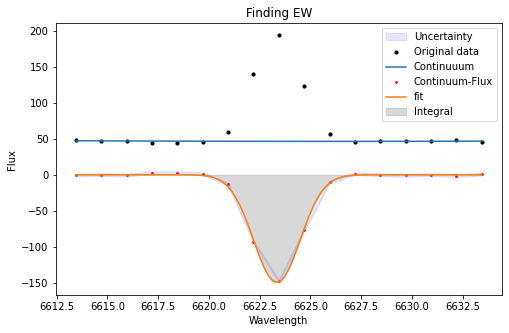

EW = -9.274  +/- 0.945  at (i,j)= 3 , 2
PLOTS  True


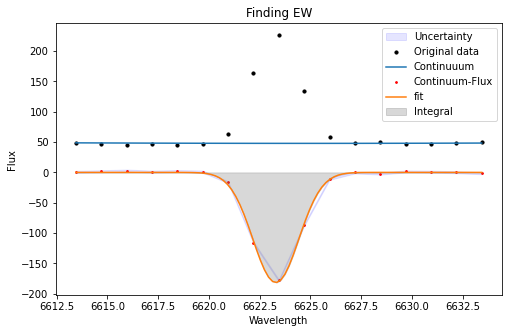

EW = -10.748  +/- 0.831  at (i,j)= 3 , 3
PLOTS  True


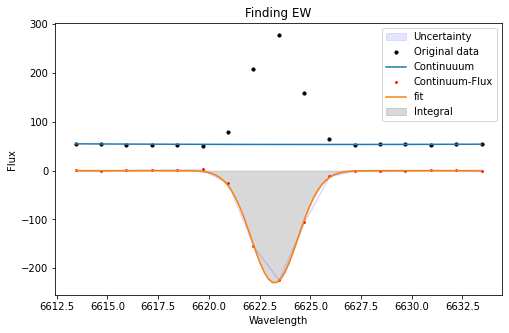

EW = -12.285  +/- 0.541  at (i,j)= 3 , 4
PLOTS  True


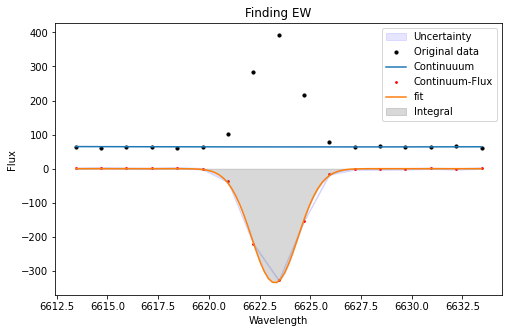

EW = -14.920  +/- 0.900  at (i,j)= 3 , 5
PLOTS  True


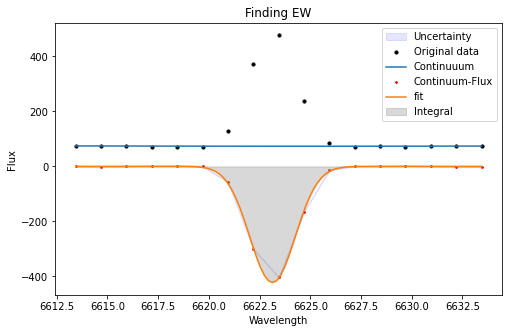

EW = -16.163  +/- 0.560  at (i,j)= 3 , 6
PLOTS  True


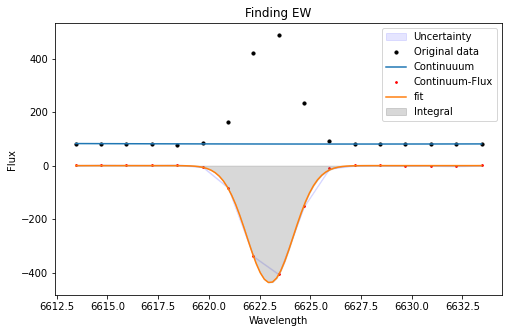

EW = -15.489  +/- 0.588  at (i,j)= 3 , 7
PLOTS  True


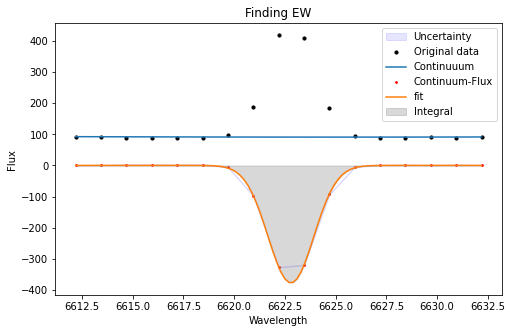

EW = -11.698  +/- 0.363  at (i,j)= 3 , 8
PLOTS  True


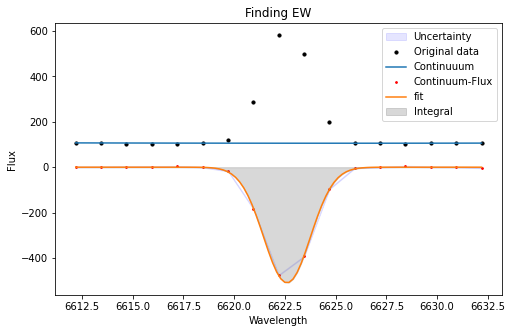

EW = -13.890  +/- 0.549  at (i,j)= 3 , 9
PLOTS  True


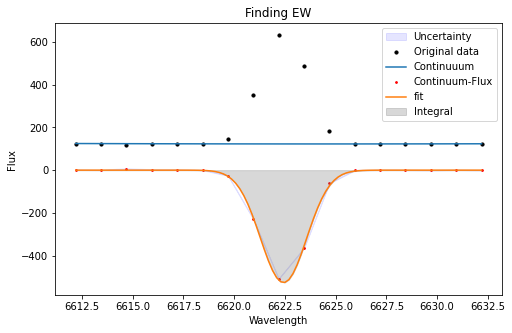

EW = -12.229  +/- 0.373  at (i,j)= 3 , 10
PLOTS  True


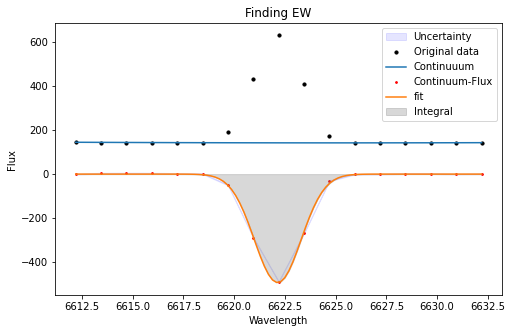

EW = -10.007  +/- 0.398  at (i,j)= 3 , 11
PLOTS  True


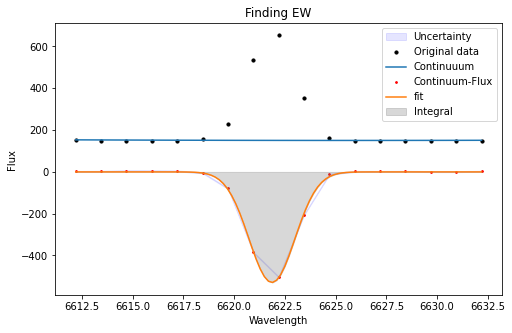

EW = -9.937  +/- 0.428  at (i,j)= 3 , 12
PLOTS  True


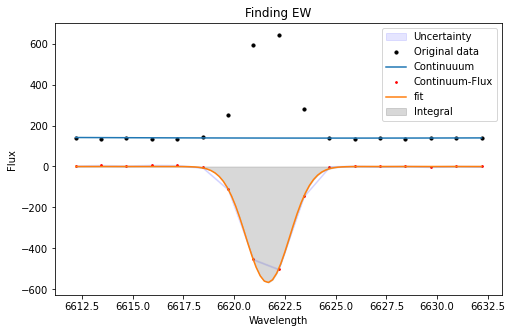

EW = -11.030  +/- 0.541  at (i,j)= 3 , 13
PLOTS  True


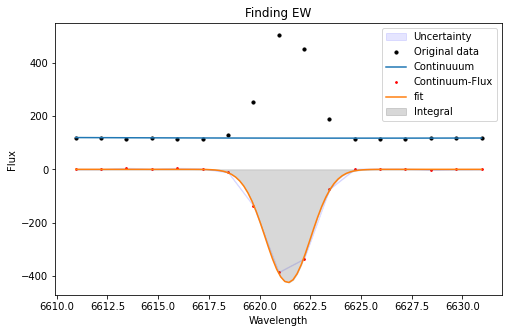

EW = -10.119  +/- 0.380  at (i,j)= 3 , 14
PLOTS  True


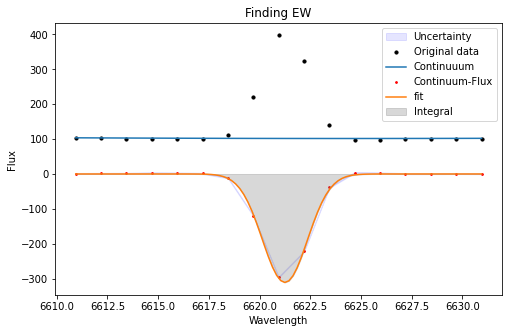

EW = -8.508  +/- 0.405  at (i,j)= 3 , 15
PLOTS  True


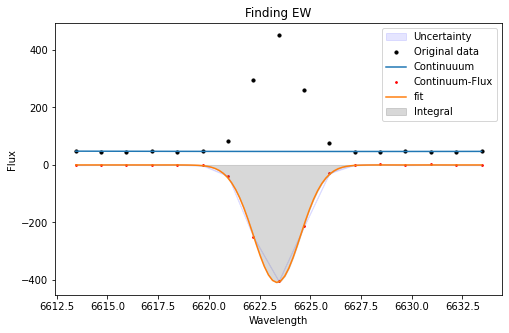

EW = -25.110  +/- 0.783  at (i,j)= 4 , 0
PLOTS  True


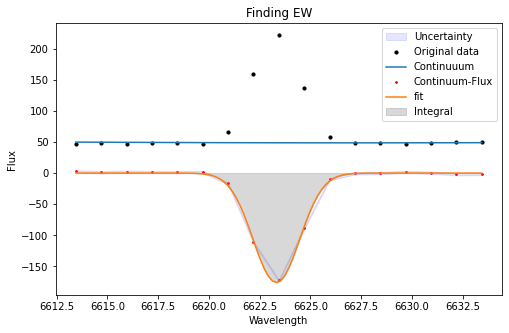

EW = -10.388  +/- 0.909  at (i,j)= 4 , 1
PLOTS  True


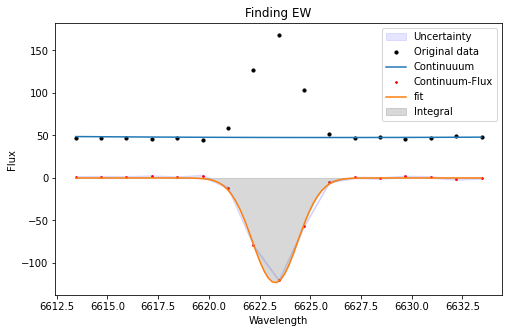

EW = -7.238  +/- 0.572  at (i,j)= 4 , 2
PLOTS  True


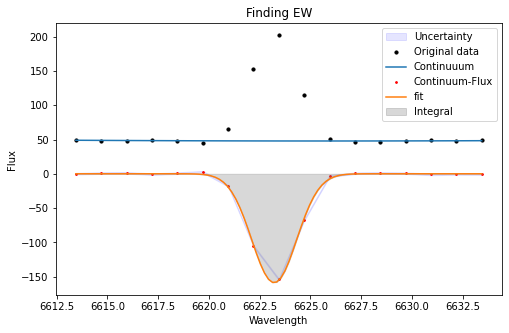

EW = -9.200  +/- 0.636  at (i,j)= 4 , 3
PLOTS  True


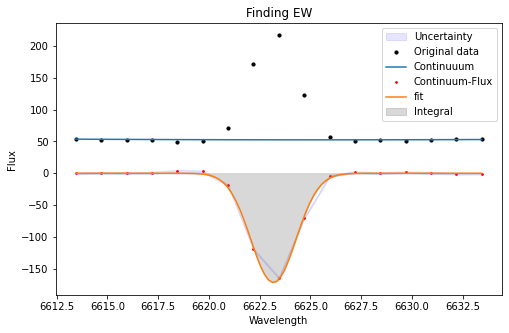

EW = -9.111  +/- 0.674  at (i,j)= 4 , 4
PLOTS  True


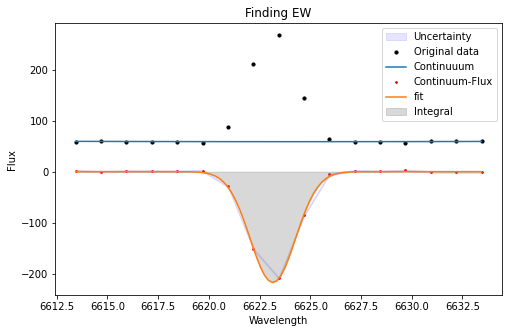

EW = -10.323  +/- 0.662  at (i,j)= 4 , 5
PLOTS  True


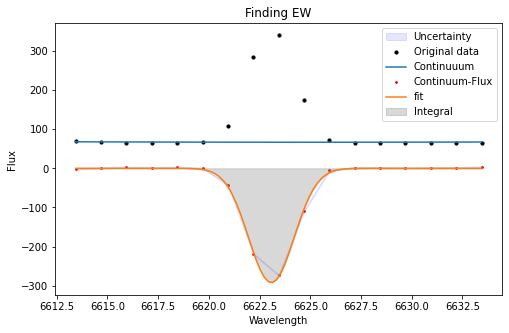

EW = -12.311  +/- 0.592  at (i,j)= 4 , 6
PLOTS  True


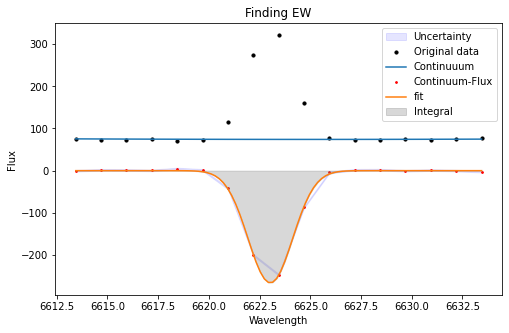

EW = -9.869  +/- 0.631  at (i,j)= 4 , 7
PLOTS  True


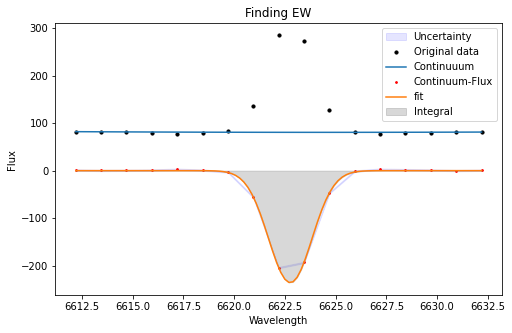

EW = -7.850  +/- 0.446  at (i,j)= 4 , 8
PLOTS  True


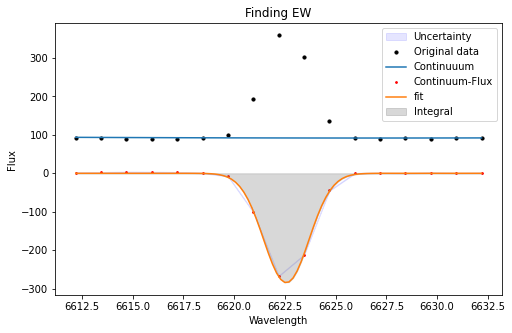

EW = -8.672  +/- 0.295  at (i,j)= 4 , 9
PLOTS  True


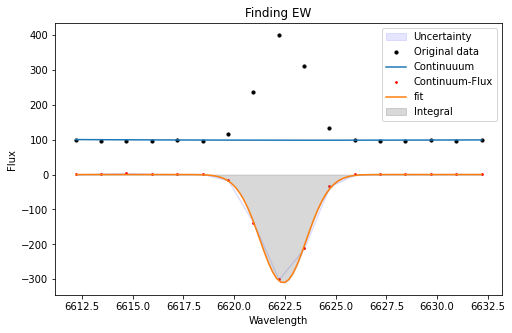

EW = -8.977  +/- 0.325  at (i,j)= 4 , 10
PLOTS  True


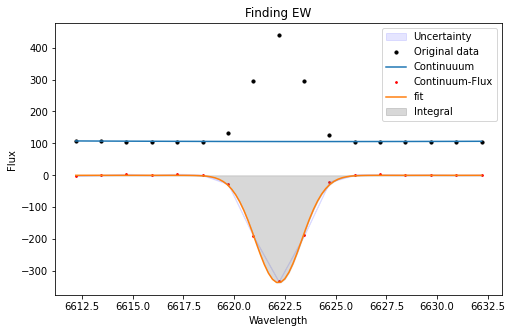

EW = -9.088  +/- 0.371  at (i,j)= 4 , 11
PLOTS  True


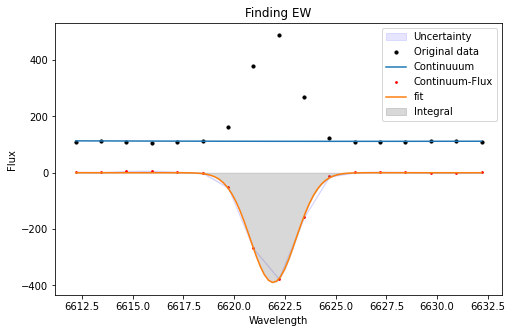

EW = -9.808  +/- 0.397  at (i,j)= 4 , 12
PLOTS  True


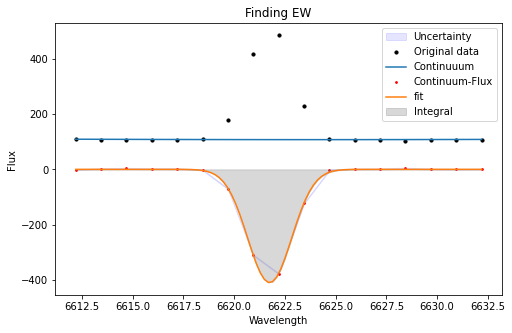

EW = -10.363  +/- 0.425  at (i,j)= 4 , 13
PLOTS  True


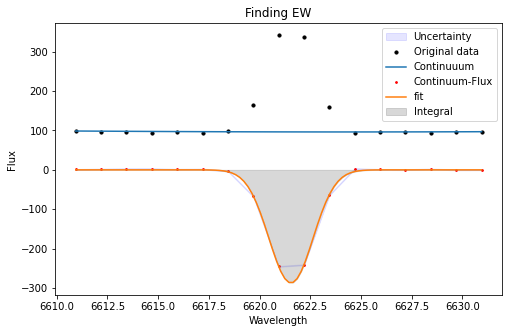

EW = -8.104  +/- 0.353  at (i,j)= 4 , 14
PLOTS  True


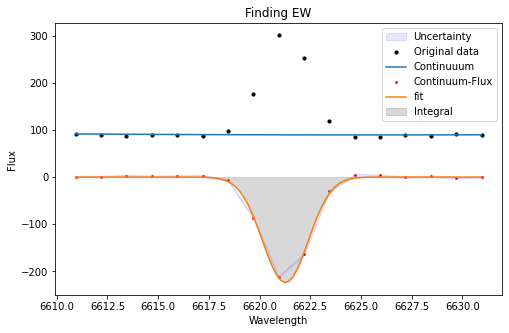

EW = -7.028  +/- 0.507  at (i,j)= 4 , 15
PLOTS  True


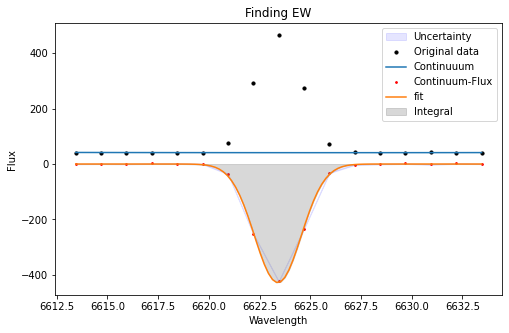

EW = -30.110  +/- 1.020  at (i,j)= 5 , 0
PLOTS  True


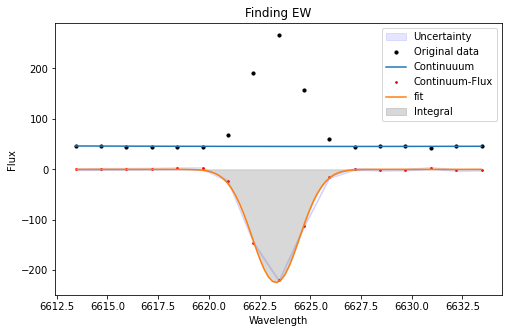

EW = -14.368  +/- 1.081  at (i,j)= 5 , 1
PLOTS  True


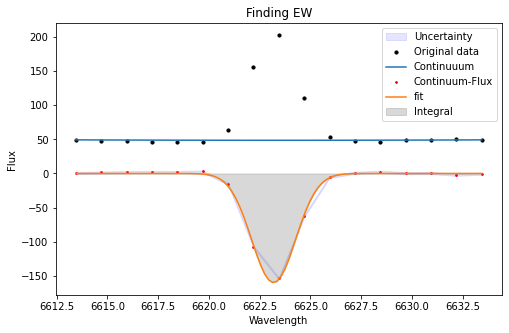

EW = -8.936  +/- 0.762  at (i,j)= 5 , 2
PLOTS  True


KeyboardInterrupt: 

In [255]:
map=EW_map_parametric(binned_region,wave,MUSE_err,halpha_obs,plots=True)

In [58]:
wavelen,index=findWavelengths(wave, halpha_obs)

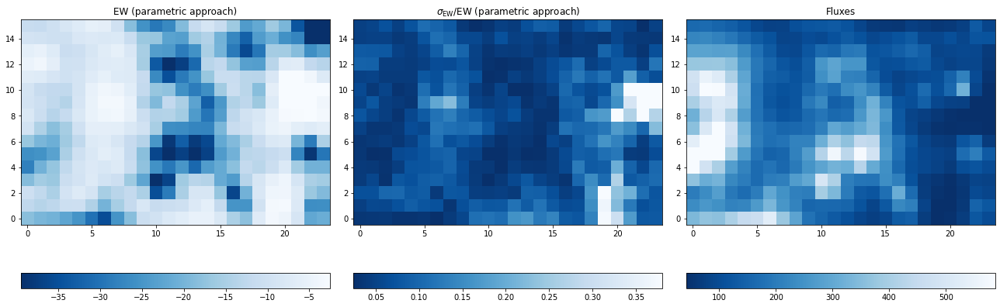

In [59]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

data = np.transpose(map[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("EW (parametric approach)")

#####

data = np.transpose(abs(map[1] / map[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im2 = ax[1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title(r"$\sigma_{\mathrm{EW}}/\mathrm{EW}$ (parametric approach)")

#####

data = binned_region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im3 = ax[2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im3, ax=ax[2], orientation="horizontal")
ax[2].set_title("Fluxes")

plt.tight_layout()
plt.show()

In [262]:
map2=EW_map_parametric(binned_region,wave,MUSE_err,halpha_obs,method=1,plots=False)

EW = -17.352  +/- 0.000  at (i,j)= 0 , 0
EW = -11.739  +/- 0.000  at (i,j)= 0 , 1
EW = -9.913  +/- 0.000  at (i,j)= 0 , 2
EW = -16.335  +/- 0.000  at (i,j)= 0 , 3
EW = -23.959  +/- 0.000  at (i,j)= 0 , 4
EW = -24.905  +/- 0.000  at (i,j)= 0 , 5
EW = -16.201  +/- 0.000  at (i,j)= 0 , 6
EW = -8.999  +/- 0.000  at (i,j)= 0 , 7
EW = -7.530  +/- 0.000  at (i,j)= 0 , 8
EW = -9.008  +/- 0.000  at (i,j)= 0 , 9
EW = -8.575  +/- 0.000  at (i,j)= 0 , 10
EW = -6.518  +/- 0.000  at (i,j)= 0 , 11
EW = -4.497  +/- 0.000  at (i,j)= 0 , 12
EW = -5.571  +/- 0.000  at (i,j)= 0 , 13
EW = -8.990  +/- 0.000  at (i,j)= 0 , 14
EW = -10.818  +/- 0.000  at (i,j)= 0 , 15
EW = -18.987  +/- 0.000  at (i,j)= 1 , 0
EW = -13.184  +/- 0.000  at (i,j)= 1 , 1
EW = -11.725  +/- 0.000  at (i,j)= 1 , 2
EW = -14.921  +/- 0.000  at (i,j)= 1 , 3
EW = -19.688  +/- 0.000  at (i,j)= 1 , 4
EW = -24.923  +/- 0.000  at (i,j)= 1 , 5
EW = -19.051  +/- 0.000  at (i,j)= 1 , 6
EW = -14.126  +/- 0.000  at (i,j)= 1 , 7
EW = -10.407  +/- 0

EW = -23.168  +/- 0.000  at (i,j)= 13 , 8
EW = -22.043  +/- 0.000  at (i,j)= 13 , 9
EW = -27.646  +/- 0.000  at (i,j)= 13 , 10
EW = -24.757  +/- 0.000  at (i,j)= 13 , 11
EW = -30.958  +/- 0.000  at (i,j)= 13 , 12
EW = -25.186  +/- 0.000  at (i,j)= 13 , 13
EW = -15.429  +/- 0.000  at (i,j)= 13 , 14
EW = -10.992  +/- 0.000  at (i,j)= 13 , 15
EW = -4.657  +/- 0.000  at (i,j)= 14 , 0
EW = -5.534  +/- 0.000  at (i,j)= 14 , 1
EW = -8.118  +/- 0.000  at (i,j)= 14 , 2
EW = -13.399  +/- 0.000  at (i,j)= 14 , 3
EW = -23.495  +/- 0.000  at (i,j)= 14 , 4
EW = -36.014  +/- 0.000  at (i,j)= 14 , 5
EW = -33.064  +/- 0.000  at (i,j)= 14 , 6
EW = -26.499  +/- 0.000  at (i,j)= 14 , 7
EW = -28.783  +/- 0.000  at (i,j)= 14 , 8
EW = -31.854  +/- 0.000  at (i,j)= 14 , 9
EW = -25.098  +/- 0.000  at (i,j)= 14 , 10
EW = -16.243  +/- 0.000  at (i,j)= 14 , 11
EW = -12.914  +/- 0.000  at (i,j)= 14 , 12
EW = -14.250  +/- 0.000  at (i,j)= 14 , 13
EW = -13.187  +/- 0.000  at (i,j)= 14 , 14
EW = -8.283  +/- 0.000  at

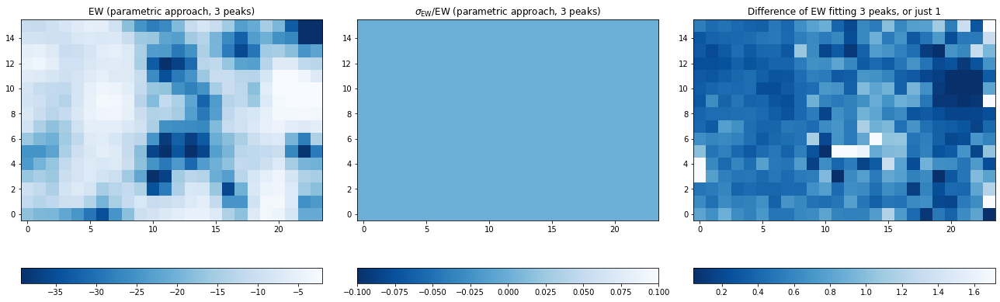

In [264]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

data = np.transpose(map2[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("EW (parametric approach, 3 peaks)")

#####

data = np.transpose(abs(map2[1] / map2[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im2 = ax[1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title(r"$\sigma_{\mathrm{EW}}/\mathrm{EW}$ (parametric approach, 3 peaks)")

#####

#data = binned_region[index]
data = np.transpose(abs(map2[0] - map[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im3 = ax[2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im3, ax=ax[2], orientation="horizontal")
ax[2].set_title("Difference of EW fitting 3 peaks, or just 1")

plt.tight_layout()
plt.show()

## EW - non parametric approach

In [60]:
x_chopped,y_chopped=chop_data(wave,binned_region[:,10,10],halpha_obs-50,halpha_obs+50)

# smooth data
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

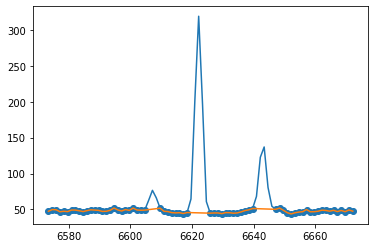

In [61]:
plt.plot(x_chopped,y_smooth)
x,y=filterout_peaks(x_chopped,y_smooth)
plt.scatter(x,y)

kernel = cosine_kernel(3)
cont = convolve(y, kernel, mode='same')

plt.plot(x,cont)

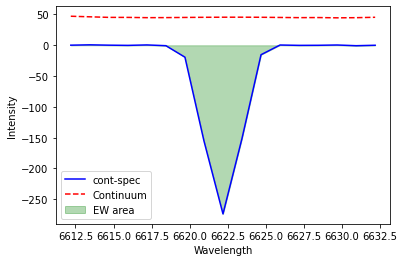

Integral of area over continuum divided by continuum: -16.86


In [62]:
max=np.argmax(y_smooth)
bound1=x_chopped[max]-10
bound2=x_chopped[max]+10
x,y=chop_data(x_chopped,y_smooth,bound1,bound2)


# continuum
x_cont,y_cont=filterout_peaks(x_chopped,y_smooth)

kernel = cosine_kernel(4)
cont = convolve(y_cont, kernel, mode='same')
interp=interp1d(x_cont, cont, kind='cubic')



cont = interp(x)



# Compute the excess intensity above the continuum
excess_intensity = (cont-y)/cont

# Integrate the excess intensity (area over the continuum)
area_over_continuum = trapz(excess_intensity, x)
#continuum_summed = simps(continuum_fit(x), x)


plt.plot(x, cont-y, label="cont-spec", color="blue")
plt.plot(x, cont, label="Continuum", linestyle="dashed", color="red")
plt.fill_between(x, cont-y, 0, alpha=0.3, color="green", label="EW area")
plt.xlabel("Wavelength")
plt.ylabel("Intensity")
plt.legend()
plt.show()

print(f"Integral of area over continuum divided by continuum: {area_over_continuum:.2f}")


## EW map - non parametric approach

In [63]:
map_NP=EW_map_non_parametric(binned_region,wave,halpha_obs,kernel_size=3,plots=False)

Integral of area over continuum divided by continuum: -18.818 +/- 0.053 at (i,j)= 0 ,  0
Integral of area over continuum divided by continuum: -14.152 +/- 0.063 at (i,j)= 0 ,  1
Integral of area over continuum divided by continuum: -10.804 +/- 0.049 at (i,j)= 0 ,  2
Integral of area over continuum divided by continuum: -19.425 +/- 0.056 at (i,j)= 0 ,  3
Integral of area over continuum divided by continuum: -26.446 +/- 0.109 at (i,j)= 0 ,  4
Integral of area over continuum divided by continuum: -24.069 +/- 0.133 at (i,j)= 0 ,  5
Integral of area over continuum divided by continuum: -15.774 +/- 0.038 at (i,j)= 0 ,  6
Integral of area over continuum divided by continuum: -8.819 +/- 0.027 at (i,j)= 0 ,  7
Integral of area over continuum divided by continuum: -7.284 +/- 0.046 at (i,j)= 0 ,  8
Integral of area over continuum divided by continuum: -7.917 +/- 0.026 at (i,j)= 0 ,  9
Integral of area over continuum divided by continuum: -9.146 +/- 0.030 at (i,j)= 0 ,  10
Integral of area over co

Integral of area over continuum divided by continuum: -8.103 +/- 0.054 at (i,j)= 7 ,  4
Integral of area over continuum divided by continuum: -6.805 +/- 0.037 at (i,j)= 7 ,  5
Integral of area over continuum divided by continuum: -8.959 +/- 0.037 at (i,j)= 7 ,  6
Integral of area over continuum divided by continuum: -6.488 +/- 0.040 at (i,j)= 7 ,  7
Integral of area over continuum divided by continuum: -3.433 +/- 0.041 at (i,j)= 7 ,  8
Integral of area over continuum divided by continuum: -3.100 +/- 0.040 at (i,j)= 7 ,  9
Integral of area over continuum divided by continuum: -3.794 +/- 0.034 at (i,j)= 7 ,  10
Integral of area over continuum divided by continuum: -7.509 +/- 0.054 at (i,j)= 7 ,  11
Integral of area over continuum divided by continuum: -7.356 +/- 0.032 at (i,j)= 7 ,  12
Integral of area over continuum divided by continuum: -5.874 +/- 0.041 at (i,j)= 7 ,  13
Integral of area over continuum divided by continuum: -7.208 +/- 0.071 at (i,j)= 7 ,  14
Integral of area over conti

Integral of area over continuum divided by continuum: -12.638 +/- 0.067 at (i,j)= 14 ,  14
Integral of area over continuum divided by continuum: -8.876 +/- 0.060 at (i,j)= 14 ,  15
Integral of area over continuum divided by continuum: -7.281 +/- 0.073 at (i,j)= 15 ,  0
Integral of area over continuum divided by continuum: -11.851 +/- 0.049 at (i,j)= 15 ,  1
Integral of area over continuum divided by continuum: -17.395 +/- 0.052 at (i,j)= 15 ,  2
Integral of area over continuum divided by continuum: -19.694 +/- 0.110 at (i,j)= 15 ,  3
Integral of area over continuum divided by continuum: -19.010 +/- 0.105 at (i,j)= 15 ,  4
Integral of area over continuum divided by continuum: -25.294 +/- 0.118 at (i,j)= 15 ,  5
Integral of area over continuum divided by continuum: -19.497 +/- 0.128 at (i,j)= 15 ,  6
Integral of area over continuum divided by continuum: -20.356 +/- 0.063 at (i,j)= 15 ,  7
Integral of area over continuum divided by continuum: -22.618 +/- 0.064 at (i,j)= 15 ,  8
Integral o

Integral of area over continuum divided by continuum: -47.288 +/- 0.198 at (i,j)= 22 ,  14
Integral of area over continuum divided by continuum: -73.913 +/- 0.496 at (i,j)= 22 ,  15
Integral of area over continuum divided by continuum: -21.823 +/- 0.153 at (i,j)= 23 ,  0
Integral of area over continuum divided by continuum: -22.869 +/- 0.252 at (i,j)= 23 ,  1
Integral of area over continuum divided by continuum: -18.822 +/- 0.100 at (i,j)= 23 ,  2
Integral of area over continuum divided by continuum: -13.645 +/- 0.150 at (i,j)= 23 ,  3
Integral of area over continuum divided by continuum: -17.914 +/- 0.181 at (i,j)= 23 ,  4
Integral of area over continuum divided by continuum: -24.022 +/- 0.220 at (i,j)= 23 ,  5
Integral of area over continuum divided by continuum: -13.154 +/- 0.082 at (i,j)= 23 ,  6
Integral of area over continuum divided by continuum: -5.557 +/- 0.096 at (i,j)= 23 ,  7
Integral of area over continuum divided by continuum: -2.719 +/- 0.054 at (i,j)= 23 ,  8
Integral o

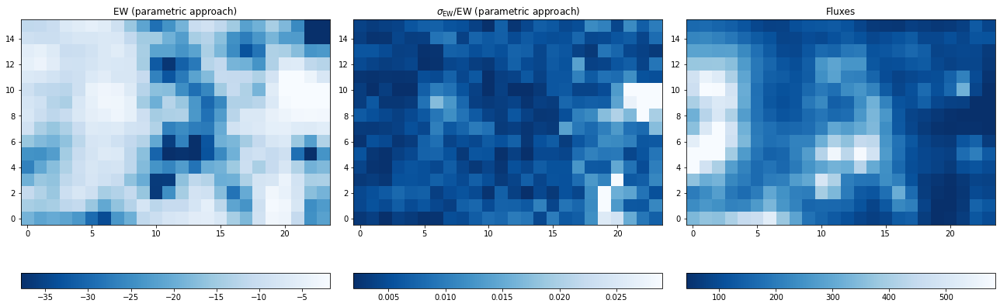

In [64]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

data = np.transpose(map_NP[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("EW (parametric approach)")

#####

data= np.transpose(abs(map_NP[1]/map_NP[0]))
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im2 = ax[1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title(r"$\sigma_{\mathrm{EW}}/\mathrm{EW}$ (parametric approach)")

#####

data = binned_region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
im3 = ax[2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im3, ax=ax[2], orientation="horizontal")
ax[2].set_title("Fluxes")

plt.tight_layout()
plt.show()

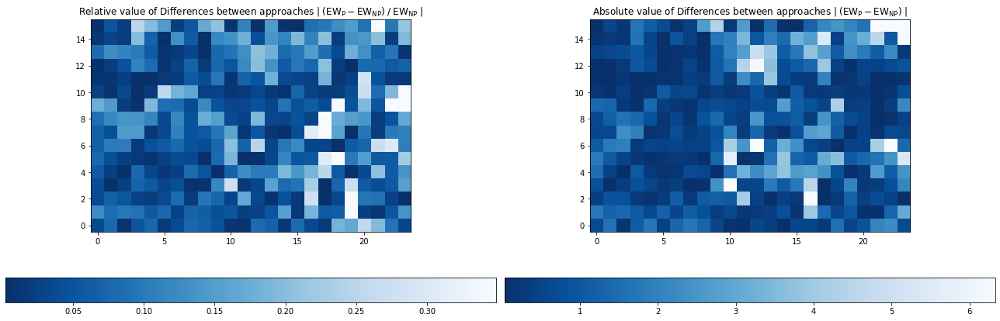

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

map_diff=abs((map_NP[0]-map[0])/map_NP[0])

data= np.transpose(map_diff)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()

im1=ax[0].imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("Relative value of Differences between approaches $|\; (\mathrm{EW_{P}}-\mathrm{EW_{NP}}) \; / \; \mathrm{EW_{NP}}\; |$")


###
map_diff=abs((map_NP[0]-map[0]))

data= np.transpose(map_diff)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()


im2=ax[1].imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title("Absolute value of Differences between approaches $|\; (\mathrm{EW_{P}}-\mathrm{EW_{NP}}) \;|$")

plt.tight_layout()
plt.show()

In [66]:
map_nonbinned_NP=EW_map_non_parametric(region,wave,halpha_obs,kernel_size=3,plots=False)

Integral of area over continuum divided by continuum: -24.935 +/- 0.231 at (i,j)= 0 ,  0
Integral of area over continuum divided by continuum: -17.694 +/- 0.206 at (i,j)= 0 ,  1
Integral of area over continuum divided by continuum: -16.214 +/- 0.235 at (i,j)= 0 ,  2
Integral of area over continuum divided by continuum: -13.013 +/- 0.161 at (i,j)= 0 ,  3
Integral of area over continuum divided by continuum: -10.802 +/- 0.174 at (i,j)= 0 ,  4
Integral of area over continuum divided by continuum: -10.750 +/- 0.215 at (i,j)= 0 ,  5
Integral of area over continuum divided by continuum: -11.587 +/- 0.153 at (i,j)= 0 ,  6
Integral of area over continuum divided by continuum: -10.415 +/- 0.182 at (i,j)= 0 ,  7
Integral of area over continuum divided by continuum: -8.898 +/- 0.082 at (i,j)= 0 ,  8
Integral of area over continuum divided by continuum: -8.790 +/- 0.136 at (i,j)= 0 ,  9
Integral of area over continuum divided by continuum: -6.781 +/- 0.163 at (i,j)= 0 ,  10
Integral of area over c

Integral of area over continuum divided by continuum: -7.951 +/- 0.078 at (i,j)= 1 ,  37
Integral of area over continuum divided by continuum: -7.087 +/- 0.049 at (i,j)= 1 ,  38
Integral of area over continuum divided by continuum: -7.467 +/- 0.103 at (i,j)= 1 ,  39
Integral of area over continuum divided by continuum: -5.752 +/- 0.072 at (i,j)= 1 ,  40
Integral of area over continuum divided by continuum: -7.442 +/- 0.057 at (i,j)= 1 ,  41
Integral of area over continuum divided by continuum: -8.145 +/- 0.078 at (i,j)= 1 ,  42
Integral of area over continuum divided by continuum: -6.415 +/- 0.090 at (i,j)= 1 ,  43
Integral of area over continuum divided by continuum: -6.844 +/- 0.080 at (i,j)= 1 ,  44
Integral of area over continuum divided by continuum: -7.383 +/- 0.058 at (i,j)= 1 ,  45
Integral of area over continuum divided by continuum: -7.802 +/- 0.081 at (i,j)= 1 ,  46
Integral of area over continuum divided by continuum: -8.408 +/- 0.077 at (i,j)= 1 ,  47
Integral of area over

Integral of area over continuum divided by continuum: -6.836 +/- 0.192 at (i,j)= 3 ,  10
Integral of area over continuum divided by continuum: -5.966 +/- 0.152 at (i,j)= 3 ,  11
Integral of area over continuum divided by continuum: -5.232 +/- 0.150 at (i,j)= 3 ,  12
Integral of area over continuum divided by continuum: -10.050 +/- 0.097 at (i,j)= 3 ,  13
Integral of area over continuum divided by continuum: -7.737 +/- 0.118 at (i,j)= 3 ,  14
Integral of area over continuum divided by continuum: -11.270 +/- 0.115 at (i,j)= 3 ,  15
Integral of area over continuum divided by continuum: -12.448 +/- 0.170 at (i,j)= 3 ,  16
Integral of area over continuum divided by continuum: -14.463 +/- 0.129 at (i,j)= 3 ,  17
Integral of area over continuum divided by continuum: -19.105 +/- 0.159 at (i,j)= 3 ,  18
Integral of area over continuum divided by continuum: -22.537 +/- 0.230 at (i,j)= 3 ,  19
Integral of area over continuum divided by continuum: -21.187 +/- 0.181 at (i,j)= 3 ,  20
Integral of ar

Integral of area over continuum divided by continuum: -5.716 +/- 0.055 at (i,j)= 4 ,  69
Integral of area over continuum divided by continuum: -5.777 +/- 0.063 at (i,j)= 4 ,  70
Integral of area over continuum divided by continuum: -6.472 +/- 0.045 at (i,j)= 4 ,  71
Integral of area over continuum divided by continuum: -7.690 +/- 0.073 at (i,j)= 4 ,  72
Integral of area over continuum divided by continuum: -8.273 +/- 0.067 at (i,j)= 4 ,  73
Integral of area over continuum divided by continuum: -11.045 +/- 0.089 at (i,j)= 4 ,  74
Integral of area over continuum divided by continuum: -13.374 +/- 0.034 at (i,j)= 4 ,  75
Integral of area over continuum divided by continuum: -12.347 +/- 0.075 at (i,j)= 4 ,  76
Integral of area over continuum divided by continuum: -11.363 +/- 0.109 at (i,j)= 4 ,  77
Integral of area over continuum divided by continuum: -13.168 +/- 0.112 at (i,j)= 4 ,  78
Integral of area over continuum divided by continuum: -11.186 +/- 0.074 at (i,j)= 4 ,  79
Integral of are

Integral of area over continuum divided by continuum: -9.913 +/- 0.142 at (i,j)= 6 ,  10
Integral of area over continuum divided by continuum: -6.348 +/- 0.165 at (i,j)= 6 ,  11
Integral of area over continuum divided by continuum: -10.581 +/- 0.149 at (i,j)= 6 ,  12
Integral of area over continuum divided by continuum: -8.466 +/- 0.156 at (i,j)= 6 ,  13
Integral of area over continuum divided by continuum: -8.888 +/- 0.173 at (i,j)= 6 ,  14
Integral of area over continuum divided by continuum: -14.499 +/- 0.214 at (i,j)= 6 ,  15
Integral of area over continuum divided by continuum: -15.022 +/- 0.217 at (i,j)= 6 ,  16
Integral of area over continuum divided by continuum: -11.892 +/- 0.104 at (i,j)= 6 ,  17
Integral of area over continuum divided by continuum: -12.423 +/- 0.204 at (i,j)= 6 ,  18
Integral of area over continuum divided by continuum: -15.127 +/- 0.129 at (i,j)= 6 ,  19
Integral of area over continuum divided by continuum: -10.586 +/- 0.183 at (i,j)= 6 ,  20
Integral of ar

Integral of area over continuum divided by continuum: -20.074 +/- 0.176 at (i,j)= 7 ,  30
Integral of area over continuum divided by continuum: -19.815 +/- 0.119 at (i,j)= 7 ,  31
Integral of area over continuum divided by continuum: -19.841 +/- 0.129 at (i,j)= 7 ,  32
Integral of area over continuum divided by continuum: -15.298 +/- 0.168 at (i,j)= 7 ,  33
Integral of area over continuum divided by continuum: -14.499 +/- 0.108 at (i,j)= 7 ,  34
Integral of area over continuum divided by continuum: -14.486 +/- 0.107 at (i,j)= 7 ,  35
Integral of area over continuum divided by continuum: -13.920 +/- 0.102 at (i,j)= 7 ,  36
Integral of area over continuum divided by continuum: -12.976 +/- 0.107 at (i,j)= 7 ,  37
Integral of area over continuum divided by continuum: -15.215 +/- 0.108 at (i,j)= 7 ,  38
Integral of area over continuum divided by continuum: -12.411 +/- 0.091 at (i,j)= 7 ,  39
Integral of area over continuum divided by continuum: -11.562 +/- 0.087 at (i,j)= 7 ,  40
Integral o

Integral of area over continuum divided by continuum: -12.269 +/- 0.052 at (i,j)= 8 ,  54
Integral of area over continuum divided by continuum: -9.266 +/- 0.065 at (i,j)= 8 ,  55
Integral of area over continuum divided by continuum: -6.028 +/- 0.057 at (i,j)= 8 ,  56
Integral of area over continuum divided by continuum: -7.670 +/- 0.047 at (i,j)= 8 ,  57
Integral of area over continuum divided by continuum: -6.352 +/- 0.060 at (i,j)= 8 ,  58
Integral of area over continuum divided by continuum: -4.165 +/- 0.047 at (i,j)= 8 ,  59
Integral of area over continuum divided by continuum: -4.060 +/- 0.058 at (i,j)= 8 ,  60
Integral of area over continuum divided by continuum: -4.244 +/- 0.061 at (i,j)= 8 ,  61
Integral of area over continuum divided by continuum: -4.086 +/- 0.050 at (i,j)= 8 ,  62
Integral of area over continuum divided by continuum: -3.833 +/- 0.045 at (i,j)= 8 ,  63
Integral of area over continuum divided by continuum: -3.991 +/- 0.033 at (i,j)= 8 ,  64
Integral of area ove

Integral of area over continuum divided by continuum: -6.224 +/- 0.057 at (i,j)= 9 ,  69
Integral of area over continuum divided by continuum: -6.217 +/- 0.046 at (i,j)= 9 ,  70
Integral of area over continuum divided by continuum: -6.810 +/- 0.050 at (i,j)= 9 ,  71
Integral of area over continuum divided by continuum: -8.155 +/- 0.070 at (i,j)= 9 ,  72
Integral of area over continuum divided by continuum: -8.014 +/- 0.070 at (i,j)= 9 ,  73
Integral of area over continuum divided by continuum: -12.776 +/- 0.106 at (i,j)= 9 ,  74
Integral of area over continuum divided by continuum: -9.119 +/- 0.086 at (i,j)= 9 ,  75
Integral of area over continuum divided by continuum: -9.346 +/- 0.118 at (i,j)= 9 ,  76
Integral of area over continuum divided by continuum: -8.126 +/- 0.112 at (i,j)= 9 ,  77
Integral of area over continuum divided by continuum: -10.337 +/- 0.057 at (i,j)= 9 ,  78
Integral of area over continuum divided by continuum: -6.663 +/- 0.120 at (i,j)= 9 ,  79
Integral of area ov

Integral of area over continuum divided by continuum: -16.775 +/- 0.197 at (i,j)= 11 ,  4
Integral of area over continuum divided by continuum: -14.101 +/- 0.105 at (i,j)= 11 ,  5
Integral of area over continuum divided by continuum: -12.859 +/- 0.128 at (i,j)= 11 ,  6
Integral of area over continuum divided by continuum: -12.061 +/- 0.218 at (i,j)= 11 ,  7
Integral of area over continuum divided by continuum: -10.012 +/- 0.208 at (i,j)= 11 ,  8
Integral of area over continuum divided by continuum: -10.855 +/- 0.124 at (i,j)= 11 ,  9
Integral of area over continuum divided by continuum: -11.548 +/- 0.131 at (i,j)= 11 ,  10
Integral of area over continuum divided by continuum: -9.381 +/- 0.134 at (i,j)= 11 ,  11
Integral of area over continuum divided by continuum: -17.467 +/- 0.264 at (i,j)= 11 ,  12
Integral of area over continuum divided by continuum: -25.616 +/- 0.503 at (i,j)= 11 ,  13
Integral of area over continuum divided by continuum: -20.981 +/- 0.279 at (i,j)= 11 ,  14
Integr

Integral of area over continuum divided by continuum: -14.889 +/- 0.143 at (i,j)= 12 ,  22
Integral of area over continuum divided by continuum: -17.915 +/- 0.105 at (i,j)= 12 ,  23
Integral of area over continuum divided by continuum: -18.905 +/- 0.115 at (i,j)= 12 ,  24
Integral of area over continuum divided by continuum: -23.581 +/- 0.369 at (i,j)= 12 ,  25
Integral of area over continuum divided by continuum: -20.959 +/- 0.175 at (i,j)= 12 ,  26
Integral of area over continuum divided by continuum: -23.644 +/- 0.149 at (i,j)= 12 ,  27
Integral of area over continuum divided by continuum: -22.076 +/- 0.217 at (i,j)= 12 ,  28
Integral of area over continuum divided by continuum: -20.415 +/- 0.157 at (i,j)= 12 ,  29
Integral of area over continuum divided by continuum: -20.936 +/- 0.157 at (i,j)= 12 ,  30
Integral of area over continuum divided by continuum: -21.229 +/- 0.137 at (i,j)= 12 ,  31
Integral of area over continuum divided by continuum: -16.048 +/- 0.235 at (i,j)= 12 ,  32

Integral of area over continuum divided by continuum: -10.481 +/- 0.157 at (i,j)= 13 ,  44
Integral of area over continuum divided by continuum: -11.808 +/- 0.109 at (i,j)= 13 ,  45
Integral of area over continuum divided by continuum: -10.060 +/- 0.118 at (i,j)= 13 ,  46
Integral of area over continuum divided by continuum: -10.453 +/- 0.091 at (i,j)= 13 ,  47
Integral of area over continuum divided by continuum: -10.712 +/- 0.142 at (i,j)= 13 ,  48
Integral of area over continuum divided by continuum: -10.627 +/- 0.115 at (i,j)= 13 ,  49
Integral of area over continuum divided by continuum: -10.176 +/- 0.111 at (i,j)= 13 ,  50
Integral of area over continuum divided by continuum: -11.033 +/- 0.127 at (i,j)= 13 ,  51
Integral of area over continuum divided by continuum: -13.081 +/- 0.102 at (i,j)= 13 ,  52
Integral of area over continuum divided by continuum: -11.334 +/- 0.052 at (i,j)= 13 ,  53
Integral of area over continuum divided by continuum: -11.020 +/- 0.079 at (i,j)= 13 ,  54

Integral of area over continuum divided by continuum: -7.511 +/- 0.073 at (i,j)= 14 ,  60
Integral of area over continuum divided by continuum: -8.066 +/- 0.061 at (i,j)= 14 ,  61
Integral of area over continuum divided by continuum: -7.711 +/- 0.057 at (i,j)= 14 ,  62
Integral of area over continuum divided by continuum: -6.650 +/- 0.055 at (i,j)= 14 ,  63
Integral of area over continuum divided by continuum: -6.665 +/- 0.050 at (i,j)= 14 ,  64
Integral of area over continuum divided by continuum: -8.101 +/- 0.049 at (i,j)= 14 ,  65
Integral of area over continuum divided by continuum: -8.837 +/- 0.068 at (i,j)= 14 ,  66
Integral of area over continuum divided by continuum: -7.821 +/- 0.050 at (i,j)= 14 ,  67
Integral of area over continuum divided by continuum: -7.893 +/- 0.066 at (i,j)= 14 ,  68
Integral of area over continuum divided by continuum: -7.810 +/- 0.111 at (i,j)= 14 ,  69
Integral of area over continuum divided by continuum: -8.595 +/- 0.099 at (i,j)= 14 ,  70
Integral o

Integral of area over continuum divided by continuum: -8.435 +/- 0.092 at (i,j)= 15 ,  74
Integral of area over continuum divided by continuum: -8.486 +/- 0.078 at (i,j)= 15 ,  75
Integral of area over continuum divided by continuum: -6.770 +/- 0.179 at (i,j)= 15 ,  76
Integral of area over continuum divided by continuum: -7.947 +/- 0.114 at (i,j)= 15 ,  77
Integral of area over continuum divided by continuum: -6.130 +/- 0.145 at (i,j)= 15 ,  78
Integral of area over continuum divided by continuum: -6.024 +/- 0.091 at (i,j)= 15 ,  79
Integral of area over continuum divided by continuum: -25.357 +/- 0.185 at (i,j)= 16 ,  0
Integral of area over continuum divided by continuum: -20.362 +/- 0.223 at (i,j)= 16 ,  1
Integral of area over continuum divided by continuum: -18.552 +/- 0.134 at (i,j)= 16 ,  2
Integral of area over continuum divided by continuum: -13.892 +/- 0.194 at (i,j)= 16 ,  3
Integral of area over continuum divided by continuum: -14.778 +/- 0.203 at (i,j)= 16 ,  4
Integral o

Integral of area over continuum divided by continuum: -6.918 +/- 0.160 at (i,j)= 17 ,  5
Integral of area over continuum divided by continuum: -10.997 +/- 0.146 at (i,j)= 17 ,  6
Integral of area over continuum divided by continuum: -6.702 +/- 0.141 at (i,j)= 17 ,  7
Integral of area over continuum divided by continuum: -7.507 +/- 0.167 at (i,j)= 17 ,  8
Integral of area over continuum divided by continuum: -21.631 +/- 0.683 at (i,j)= 17 ,  9
Integral of area over continuum divided by continuum: -6.124 +/- 0.161 at (i,j)= 17 ,  10
Integral of area over continuum divided by continuum: -7.012 +/- 0.153 at (i,j)= 17 ,  11
Integral of area over continuum divided by continuum: -5.941 +/- 0.189 at (i,j)= 17 ,  12
Integral of area over continuum divided by continuum: -6.128 +/- 0.142 at (i,j)= 17 ,  13
Integral of area over continuum divided by continuum: -5.244 +/- 0.152 at (i,j)= 17 ,  14
Integral of area over continuum divided by continuum: -6.297 +/- 0.140 at (i,j)= 17 ,  15
Integral of a

Integral of area over continuum divided by continuum: -11.397 +/- 0.077 at (i,j)= 18 ,  23
Integral of area over continuum divided by continuum: -12.283 +/- 0.161 at (i,j)= 18 ,  24
Integral of area over continuum divided by continuum: -11.097 +/- 0.083 at (i,j)= 18 ,  25
Integral of area over continuum divided by continuum: -12.361 +/- 0.117 at (i,j)= 18 ,  26
Integral of area over continuum divided by continuum: -12.780 +/- 0.149 at (i,j)= 18 ,  27
Integral of area over continuum divided by continuum: -12.461 +/- 0.173 at (i,j)= 18 ,  28
Integral of area over continuum divided by continuum: -12.915 +/- 0.102 at (i,j)= 18 ,  29
Integral of area over continuum divided by continuum: -13.982 +/- 0.156 at (i,j)= 18 ,  30
Integral of area over continuum divided by continuum: -14.133 +/- 0.123 at (i,j)= 18 ,  31
Integral of area over continuum divided by continuum: -13.335 +/- 0.114 at (i,j)= 18 ,  32
Integral of area over continuum divided by continuum: -13.759 +/- 0.158 at (i,j)= 18 ,  33

Integral of area over continuum divided by continuum: -8.799 +/- 0.132 at (i,j)= 19 ,  45
Integral of area over continuum divided by continuum: -10.135 +/- 0.086 at (i,j)= 19 ,  46
Integral of area over continuum divided by continuum: -10.367 +/- 0.097 at (i,j)= 19 ,  47
Integral of area over continuum divided by continuum: -10.113 +/- 0.136 at (i,j)= 19 ,  48
Integral of area over continuum divided by continuum: -12.539 +/- 0.072 at (i,j)= 19 ,  49
Integral of area over continuum divided by continuum: -10.636 +/- 0.133 at (i,j)= 19 ,  50
Integral of area over continuum divided by continuum: -10.870 +/- 0.138 at (i,j)= 19 ,  51
Integral of area over continuum divided by continuum: -9.435 +/- 0.093 at (i,j)= 19 ,  52
Integral of area over continuum divided by continuum: -8.178 +/- 0.053 at (i,j)= 19 ,  53
Integral of area over continuum divided by continuum: -8.710 +/- 0.093 at (i,j)= 19 ,  54
Integral of area over continuum divided by continuum: -8.274 +/- 0.124 at (i,j)= 19 ,  55
Inte

Integral of area over continuum divided by continuum: -10.822 +/- 0.059 at (i,j)= 20 ,  68
Integral of area over continuum divided by continuum: -10.000 +/- 0.086 at (i,j)= 20 ,  69
Integral of area over continuum divided by continuum: -8.620 +/- 0.069 at (i,j)= 20 ,  70
Integral of area over continuum divided by continuum: -8.376 +/- 0.097 at (i,j)= 20 ,  71
Integral of area over continuum divided by continuum: -7.540 +/- 0.077 at (i,j)= 20 ,  72
Integral of area over continuum divided by continuum: -7.698 +/- 0.106 at (i,j)= 20 ,  73
Integral of area over continuum divided by continuum: -7.536 +/- 0.116 at (i,j)= 20 ,  74
Integral of area over continuum divided by continuum: -6.783 +/- 0.095 at (i,j)= 20 ,  75
Integral of area over continuum divided by continuum: -5.464 +/- 0.095 at (i,j)= 20 ,  76
Integral of area over continuum divided by continuum: -5.671 +/- 0.086 at (i,j)= 20 ,  77
Integral of area over continuum divided by continuum: -7.535 +/- 0.116 at (i,j)= 20 ,  78
Integral

Integral of area over continuum divided by continuum: -4.984 +/- 0.124 at (i,j)= 22 ,  14
Integral of area over continuum divided by continuum: -5.292 +/- 0.184 at (i,j)= 22 ,  15
Integral of area over continuum divided by continuum: -8.141 +/- 0.114 at (i,j)= 22 ,  16
Integral of area over continuum divided by continuum: -11.017 +/- 0.123 at (i,j)= 22 ,  17
Integral of area over continuum divided by continuum: -7.008 +/- 0.122 at (i,j)= 22 ,  18
Integral of area over continuum divided by continuum: -11.741 +/- 0.179 at (i,j)= 22 ,  19
Integral of area over continuum divided by continuum: -11.393 +/- 0.174 at (i,j)= 22 ,  20
Integral of area over continuum divided by continuum: -8.134 +/- 0.063 at (i,j)= 22 ,  21
Integral of area over continuum divided by continuum: -9.077 +/- 0.124 at (i,j)= 22 ,  22
Integral of area over continuum divided by continuum: -5.261 +/- 0.122 at (i,j)= 22 ,  23
Integral of area over continuum divided by continuum: -9.456 +/- 0.155 at (i,j)= 22 ,  24
Integra

Integral of area over continuum divided by continuum: -10.346 +/- 0.221 at (i,j)= 23 ,  26
Integral of area over continuum divided by continuum: -10.929 +/- 0.213 at (i,j)= 23 ,  27
Integral of area over continuum divided by continuum: -10.286 +/- 0.129 at (i,j)= 23 ,  28
Integral of area over continuum divided by continuum: -9.590 +/- 0.054 at (i,j)= 23 ,  29
Integral of area over continuum divided by continuum: -10.471 +/- 0.078 at (i,j)= 23 ,  30
Integral of area over continuum divided by continuum: -11.785 +/- 0.194 at (i,j)= 23 ,  31
Integral of area over continuum divided by continuum: -9.375 +/- 0.123 at (i,j)= 23 ,  32
Integral of area over continuum divided by continuum: -12.202 +/- 0.147 at (i,j)= 23 ,  33
Integral of area over continuum divided by continuum: -11.774 +/- 0.180 at (i,j)= 23 ,  34
Integral of area over continuum divided by continuum: -8.390 +/- 0.151 at (i,j)= 23 ,  35
Integral of area over continuum divided by continuum: -9.951 +/- 0.152 at (i,j)= 23 ,  36
Int

Integral of area over continuum divided by continuum: -7.946 +/- 0.099 at (i,j)= 24 ,  42
Integral of area over continuum divided by continuum: -7.022 +/- 0.085 at (i,j)= 24 ,  43
Integral of area over continuum divided by continuum: -6.155 +/- 0.097 at (i,j)= 24 ,  44
Integral of area over continuum divided by continuum: -7.680 +/- 0.071 at (i,j)= 24 ,  45
Integral of area over continuum divided by continuum: -6.015 +/- 0.086 at (i,j)= 24 ,  46
Integral of area over continuum divided by continuum: -6.774 +/- 0.043 at (i,j)= 24 ,  47
Integral of area over continuum divided by continuum: -6.675 +/- 0.051 at (i,j)= 24 ,  48
Integral of area over continuum divided by continuum: -6.297 +/- 0.064 at (i,j)= 24 ,  49
Integral of area over continuum divided by continuum: -8.128 +/- 0.093 at (i,j)= 24 ,  50
Integral of area over continuum divided by continuum: -7.616 +/- 0.075 at (i,j)= 24 ,  51
Integral of area over continuum divided by continuum: -4.862 +/- 0.162 at (i,j)= 24 ,  52
Integral o

Integral of area over continuum divided by continuum: -5.726 +/- 0.123 at (i,j)= 25 ,  56
Integral of area over continuum divided by continuum: -7.080 +/- 0.088 at (i,j)= 25 ,  57
Integral of area over continuum divided by continuum: -4.784 +/- 0.094 at (i,j)= 25 ,  58
Integral of area over continuum divided by continuum: -7.462 +/- 0.093 at (i,j)= 25 ,  59
Integral of area over continuum divided by continuum: -7.954 +/- 0.109 at (i,j)= 25 ,  60
Integral of area over continuum divided by continuum: -6.489 +/- 0.086 at (i,j)= 25 ,  61
Integral of area over continuum divided by continuum: -8.229 +/- 0.110 at (i,j)= 25 ,  62
Integral of area over continuum divided by continuum: -7.638 +/- 0.066 at (i,j)= 25 ,  63
Integral of area over continuum divided by continuum: -9.096 +/- 0.108 at (i,j)= 25 ,  64
Integral of area over continuum divided by continuum: -9.582 +/- 0.071 at (i,j)= 25 ,  65
Integral of area over continuum divided by continuum: -10.963 +/- 0.115 at (i,j)= 25 ,  66
Integral 

Integral of area over continuum divided by continuum: -7.313 +/- 0.063 at (i,j)= 26 ,  70
Integral of area over continuum divided by continuum: -6.959 +/- 0.153 at (i,j)= 26 ,  71
Integral of area over continuum divided by continuum: -9.233 +/- 0.210 at (i,j)= 26 ,  72
Integral of area over continuum divided by continuum: -6.421 +/- 0.131 at (i,j)= 26 ,  73
Integral of area over continuum divided by continuum: -5.729 +/- 0.124 at (i,j)= 26 ,  74
Integral of area over continuum divided by continuum: -5.683 +/- 0.102 at (i,j)= 26 ,  75
Integral of area over continuum divided by continuum: -5.155 +/- 0.100 at (i,j)= 26 ,  76
Integral of area over continuum divided by continuum: -4.844 +/- 0.114 at (i,j)= 26 ,  77
Integral of area over continuum divided by continuum: -4.588 +/- 0.090 at (i,j)= 26 ,  78
Integral of area over continuum divided by continuum: -4.350 +/- 0.096 at (i,j)= 26 ,  79
Integral of area over continuum divided by continuum: -35.471 +/- 0.379 at (i,j)= 27 ,  0
Integral o

Integral of area over continuum divided by continuum: -10.493 +/- 0.156 at (i,j)= 28 ,  12
Integral of area over continuum divided by continuum: -7.907 +/- 0.122 at (i,j)= 28 ,  13
Integral of area over continuum divided by continuum: -4.725 +/- 0.185 at (i,j)= 28 ,  14
Integral of area over continuum divided by continuum: -6.332 +/- 0.113 at (i,j)= 28 ,  15
Integral of area over continuum divided by continuum: -5.873 +/- 0.186 at (i,j)= 28 ,  16
Integral of area over continuum divided by continuum: -7.951 +/- 0.174 at (i,j)= 28 ,  17
Integral of area over continuum divided by continuum: -4.270 +/- 0.177 at (i,j)= 28 ,  18
Integral of area over continuum divided by continuum: -7.622 +/- 0.251 at (i,j)= 28 ,  19
Integral of area over continuum divided by continuum: -5.963 +/- 0.089 at (i,j)= 28 ,  20
Integral of area over continuum divided by continuum: -6.938 +/- 0.113 at (i,j)= 28 ,  21
Integral of area over continuum divided by continuum: -6.450 +/- 0.205 at (i,j)= 28 ,  22
Integral 

Integral of area over continuum divided by continuum: -6.271 +/- 0.236 at (i,j)= 29 ,  24
Integral of area over continuum divided by continuum: -7.687 +/- 0.256 at (i,j)= 29 ,  25
Integral of area over continuum divided by continuum: -6.602 +/- 0.114 at (i,j)= 29 ,  26
Integral of area over continuum divided by continuum: -6.189 +/- 0.087 at (i,j)= 29 ,  27
Integral of area over continuum divided by continuum: -4.498 +/- 0.154 at (i,j)= 29 ,  28
Integral of area over continuum divided by continuum: -7.333 +/- 0.210 at (i,j)= 29 ,  29
Integral of area over continuum divided by continuum: -7.060 +/- 0.251 at (i,j)= 29 ,  30
Integral of area over continuum divided by continuum: -8.150 +/- 0.160 at (i,j)= 29 ,  31
Integral of area over continuum divided by continuum: -6.635 +/- 0.125 at (i,j)= 29 ,  32
Integral of area over continuum divided by continuum: -7.230 +/- 0.139 at (i,j)= 29 ,  33
Integral of area over continuum divided by continuum: -7.354 +/- 0.118 at (i,j)= 29 ,  34
Integral o

Integral of area over continuum divided by continuum: -7.215 +/- 0.155 at (i,j)= 30 ,  36
Integral of area over continuum divided by continuum: -6.373 +/- 0.165 at (i,j)= 30 ,  37
Integral of area over continuum divided by continuum: -6.248 +/- 0.144 at (i,j)= 30 ,  38
Integral of area over continuum divided by continuum: -5.286 +/- 0.172 at (i,j)= 30 ,  39
Integral of area over continuum divided by continuum: -4.427 +/- 0.125 at (i,j)= 30 ,  40
Integral of area over continuum divided by continuum: -4.900 +/- 0.107 at (i,j)= 30 ,  41
Integral of area over continuum divided by continuum: -3.255 +/- 0.111 at (i,j)= 30 ,  42
Integral of area over continuum divided by continuum: -4.380 +/- 0.148 at (i,j)= 30 ,  43
Integral of area over continuum divided by continuum: -3.451 +/- 0.126 at (i,j)= 30 ,  44
Integral of area over continuum divided by continuum: -2.089 +/- 0.142 at (i,j)= 30 ,  45
Integral of area over continuum divided by continuum: -3.859 +/- 0.076 at (i,j)= 30 ,  46
Integral o

Integral of area over continuum divided by continuum: -4.853 +/- 0.116 at (i,j)= 31 ,  74
Integral of area over continuum divided by continuum: -6.578 +/- 0.098 at (i,j)= 31 ,  75
Integral of area over continuum divided by continuum: -5.126 +/- 0.070 at (i,j)= 31 ,  76
Integral of area over continuum divided by continuum: -5.449 +/- 0.119 at (i,j)= 31 ,  77
Integral of area over continuum divided by continuum: -3.589 +/- 0.090 at (i,j)= 31 ,  78
Integral of area over continuum divided by continuum: -3.812 +/- 0.145 at (i,j)= 31 ,  79
Integral of area over continuum divided by continuum: -56.124 +/- 0.391 at (i,j)= 32 ,  0
Integral of area over continuum divided by continuum: -44.917 +/- 0.330 at (i,j)= 32 ,  1
Integral of area over continuum divided by continuum: -32.377 +/- 0.293 at (i,j)= 32 ,  2
Integral of area over continuum divided by continuum: -37.179 +/- 0.824 at (i,j)= 32 ,  3
Integral of area over continuum divided by continuum: -23.529 +/- 0.211 at (i,j)= 32 ,  4
Integral o

Integral of area over continuum divided by continuum: -3.632 +/- 0.087 at (i,j)= 33 ,  43
Integral of area over continuum divided by continuum: -1.642 +/- 0.113 at (i,j)= 33 ,  44
Integral of area over continuum divided by continuum: -4.845 +/- 0.127 at (i,j)= 33 ,  45
Integral of area over continuum divided by continuum: -2.893 +/- 0.047 at (i,j)= 33 ,  46
Integral of area over continuum divided by continuum: -3.168 +/- 0.140 at (i,j)= 33 ,  47
Integral of area over continuum divided by continuum: -2.687 +/- 0.059 at (i,j)= 33 ,  48
Integral of area over continuum divided by continuum: -3.479 +/- 0.155 at (i,j)= 33 ,  49
Integral of area over continuum divided by continuum: -3.219 +/- 0.061 at (i,j)= 33 ,  50
Integral of area over continuum divided by continuum: -3.079 +/- 0.059 at (i,j)= 33 ,  51
Integral of area over continuum divided by continuum: -3.115 +/- 0.059 at (i,j)= 33 ,  52
Integral of area over continuum divided by continuum: -3.067 +/- 0.067 at (i,j)= 33 ,  53
Integral o

Integral of area over continuum divided by continuum: -38.663 +/- 0.312 at (i,j)= 35 ,  0
Integral of area over continuum divided by continuum: -28.273 +/- 0.407 at (i,j)= 35 ,  1
Integral of area over continuum divided by continuum: -23.473 +/- 0.363 at (i,j)= 35 ,  2
Integral of area over continuum divided by continuum: -26.927 +/- 0.377 at (i,j)= 35 ,  3
Integral of area over continuum divided by continuum: -15.682 +/- 0.271 at (i,j)= 35 ,  4
Integral of area over continuum divided by continuum: -24.201 +/- 0.411 at (i,j)= 35 ,  5
Integral of area over continuum divided by continuum: -20.487 +/- 0.375 at (i,j)= 35 ,  6
Integral of area over continuum divided by continuum: -26.665 +/- 0.835 at (i,j)= 35 ,  7
Integral of area over continuum divided by continuum: -11.840 +/- 0.181 at (i,j)= 35 ,  8
Integral of area over continuum divided by continuum: -14.782 +/- 0.243 at (i,j)= 35 ,  9
Integral of area over continuum divided by continuum: -17.047 +/- 0.219 at (i,j)= 35 ,  10
Integral 

Integral of area over continuum divided by continuum: -2.770 +/- 0.097 at (i,j)= 36 ,  47
Integral of area over continuum divided by continuum: -3.290 +/- 0.132 at (i,j)= 36 ,  48
Integral of area over continuum divided by continuum: -4.015 +/- 0.081 at (i,j)= 36 ,  49
Integral of area over continuum divided by continuum: -3.372 +/- 0.082 at (i,j)= 36 ,  50
Integral of area over continuum divided by continuum: -3.048 +/- 0.065 at (i,j)= 36 ,  51
Integral of area over continuum divided by continuum: -3.054 +/- 0.069 at (i,j)= 36 ,  52
Integral of area over continuum divided by continuum: -4.105 +/- 0.065 at (i,j)= 36 ,  53
Integral of area over continuum divided by continuum: -4.373 +/- 0.109 at (i,j)= 36 ,  54
Integral of area over continuum divided by continuum: -3.966 +/- 0.078 at (i,j)= 36 ,  55
Integral of area over continuum divided by continuum: -4.089 +/- 0.067 at (i,j)= 36 ,  56
Integral of area over continuum divided by continuum: -4.914 +/- 0.150 at (i,j)= 36 ,  57
Integral o

Integral of area over continuum divided by continuum: -10.180 +/- 0.227 at (i,j)= 38 ,  9
Integral of area over continuum divided by continuum: -11.426 +/- 0.133 at (i,j)= 38 ,  10
Integral of area over continuum divided by continuum: -10.435 +/- 0.193 at (i,j)= 38 ,  11
Integral of area over continuum divided by continuum: -14.242 +/- 0.153 at (i,j)= 38 ,  12
Integral of area over continuum divided by continuum: -8.535 +/- 0.196 at (i,j)= 38 ,  13
Integral of area over continuum divided by continuum: -6.800 +/- 0.204 at (i,j)= 38 ,  14
Integral of area over continuum divided by continuum: -9.899 +/- 0.194 at (i,j)= 38 ,  15
Integral of area over continuum divided by continuum: -11.305 +/- 0.102 at (i,j)= 38 ,  16
Integral of area over continuum divided by continuum: -13.344 +/- 0.223 at (i,j)= 38 ,  17
Integral of area over continuum divided by continuum: -10.579 +/- 0.241 at (i,j)= 38 ,  18
Integral of area over continuum divided by continuum: -11.381 +/- 0.151 at (i,j)= 38 ,  19
Int

Integral of area over continuum divided by continuum: -5.765 +/- 0.131 at (i,j)= 39 ,  37
Integral of area over continuum divided by continuum: -6.417 +/- 0.139 at (i,j)= 39 ,  38
Integral of area over continuum divided by continuum: -4.721 +/- 0.134 at (i,j)= 39 ,  39
Integral of area over continuum divided by continuum: -4.865 +/- 0.210 at (i,j)= 39 ,  40
Integral of area over continuum divided by continuum: -2.813 +/- 0.164 at (i,j)= 39 ,  41
Integral of area over continuum divided by continuum: -3.814 +/- 0.111 at (i,j)= 39 ,  42
Integral of area over continuum divided by continuum: -2.081 +/- 0.130 at (i,j)= 39 ,  43
Integral of area over continuum divided by continuum: -3.017 +/- 0.071 at (i,j)= 39 ,  44
Integral of area over continuum divided by continuum: -3.315 +/- 0.132 at (i,j)= 39 ,  45
Integral of area over continuum divided by continuum: -4.410 +/- 0.175 at (i,j)= 39 ,  46
Integral of area over continuum divided by continuum: -3.693 +/- 0.137 at (i,j)= 39 ,  47
Integral o

Integral of area over continuum divided by continuum: -5.519 +/- 0.116 at (i,j)= 40 ,  53
Integral of area over continuum divided by continuum: -6.757 +/- 0.141 at (i,j)= 40 ,  54
Integral of area over continuum divided by continuum: -5.410 +/- 0.178 at (i,j)= 40 ,  55
Integral of area over continuum divided by continuum: -6.431 +/- 0.111 at (i,j)= 40 ,  56
Integral of area over continuum divided by continuum: -8.370 +/- 0.131 at (i,j)= 40 ,  57
Integral of area over continuum divided by continuum: -6.855 +/- 0.140 at (i,j)= 40 ,  58
Integral of area over continuum divided by continuum: -6.051 +/- 0.146 at (i,j)= 40 ,  59
Integral of area over continuum divided by continuum: -5.151 +/- 0.121 at (i,j)= 40 ,  60
Integral of area over continuum divided by continuum: -5.942 +/- 0.127 at (i,j)= 40 ,  61
Integral of area over continuum divided by continuum: -8.086 +/- 0.142 at (i,j)= 40 ,  62
Integral of area over continuum divided by continuum: -3.767 +/- 0.151 at (i,j)= 40 ,  63
Integral o

Integral of area over continuum divided by continuum: -7.977 +/- 0.240 at (i,j)= 41 ,  71
Integral of area over continuum divided by continuum: -9.652 +/- 0.120 at (i,j)= 41 ,  72
Integral of area over continuum divided by continuum: -12.891 +/- 0.138 at (i,j)= 41 ,  73
Integral of area over continuum divided by continuum: -10.346 +/- 0.121 at (i,j)= 41 ,  74
Integral of area over continuum divided by continuum: -11.685 +/- 0.126 at (i,j)= 41 ,  75
Integral of area over continuum divided by continuum: -14.359 +/- 0.149 at (i,j)= 41 ,  76
Integral of area over continuum divided by continuum: -14.139 +/- 0.153 at (i,j)= 41 ,  77
Integral of area over continuum divided by continuum: -21.960 +/- 0.247 at (i,j)= 41 ,  78
Integral of area over continuum divided by continuum: -16.634 +/- 0.276 at (i,j)= 41 ,  79
Integral of area over continuum divided by continuum: -17.438 +/- 0.283 at (i,j)= 42 ,  0
Integral of area over continuum divided by continuum: -16.410 +/- 0.235 at (i,j)= 42 ,  1
Int

Integral of area over continuum divided by continuum: -5.243 +/- 0.085 at (i,j)= 43 ,  50
Integral of area over continuum divided by continuum: -5.231 +/- 0.159 at (i,j)= 43 ,  51
Integral of area over continuum divided by continuum: -5.996 +/- 0.155 at (i,j)= 43 ,  52
Integral of area over continuum divided by continuum: -5.718 +/- 0.119 at (i,j)= 43 ,  53
Integral of area over continuum divided by continuum: -7.328 +/- 0.178 at (i,j)= 43 ,  54
Integral of area over continuum divided by continuum: -6.325 +/- 0.256 at (i,j)= 43 ,  55
Integral of area over continuum divided by continuum: -6.962 +/- 0.115 at (i,j)= 43 ,  56
Integral of area over continuum divided by continuum: -4.552 +/- 0.246 at (i,j)= 43 ,  57
Integral of area over continuum divided by continuum: -5.992 +/- 0.144 at (i,j)= 43 ,  58
Integral of area over continuum divided by continuum: -5.573 +/- 0.117 at (i,j)= 43 ,  59
Integral of area over continuum divided by continuum: -5.402 +/- 0.040 at (i,j)= 43 ,  60
Integral o

Integral of area over continuum divided by continuum: -13.257 +/- 0.236 at (i,j)= 44 ,  69
Integral of area over continuum divided by continuum: -10.965 +/- 0.175 at (i,j)= 44 ,  70
Integral of area over continuum divided by continuum: -11.694 +/- 0.189 at (i,j)= 44 ,  71
Integral of area over continuum divided by continuum: -10.067 +/- 0.212 at (i,j)= 44 ,  72
Integral of area over continuum divided by continuum: -14.246 +/- 0.118 at (i,j)= 44 ,  73
Integral of area over continuum divided by continuum: -13.763 +/- 0.202 at (i,j)= 44 ,  74
Integral of area over continuum divided by continuum: -12.873 +/- 0.165 at (i,j)= 44 ,  75
Integral of area over continuum divided by continuum: -15.621 +/- 0.183 at (i,j)= 44 ,  76
Integral of area over continuum divided by continuum: -15.435 +/- 0.207 at (i,j)= 44 ,  77
Integral of area over continuum divided by continuum: -18.569 +/- 0.210 at (i,j)= 44 ,  78
Integral of area over continuum divided by continuum: -21.175 +/- 0.445 at (i,j)= 44 ,  79

Integral of area over continuum divided by continuum: -8.162 +/- 0.165 at (i,j)= 46 ,  41
Integral of area over continuum divided by continuum: -9.866 +/- 0.194 at (i,j)= 46 ,  42
Integral of area over continuum divided by continuum: -8.792 +/- 0.153 at (i,j)= 46 ,  43
Integral of area over continuum divided by continuum: -9.579 +/- 0.137 at (i,j)= 46 ,  44
Integral of area over continuum divided by continuum: -8.262 +/- 0.143 at (i,j)= 46 ,  45
Integral of area over continuum divided by continuum: -12.222 +/- 0.204 at (i,j)= 46 ,  46
Integral of area over continuum divided by continuum: -10.224 +/- 0.145 at (i,j)= 46 ,  47
Integral of area over continuum divided by continuum: -10.510 +/- 0.129 at (i,j)= 46 ,  48
Integral of area over continuum divided by continuum: -8.274 +/- 0.155 at (i,j)= 46 ,  49
Integral of area over continuum divided by continuum: -7.982 +/- 0.114 at (i,j)= 46 ,  50
Integral of area over continuum divided by continuum: -7.225 +/- 0.110 at (i,j)= 46 ,  51
Integra

Integral of area over continuum divided by continuum: -10.055 +/- 0.146 at (i,j)= 47 ,  52
Integral of area over continuum divided by continuum: -6.410 +/- 0.227 at (i,j)= 47 ,  53
Integral of area over continuum divided by continuum: -7.192 +/- 0.149 at (i,j)= 47 ,  54
Integral of area over continuum divided by continuum: -9.381 +/- 0.101 at (i,j)= 47 ,  55
Integral of area over continuum divided by continuum: -5.947 +/- 0.175 at (i,j)= 47 ,  56
Integral of area over continuum divided by continuum: -9.044 +/- 0.211 at (i,j)= 47 ,  57
Integral of area over continuum divided by continuum: -7.250 +/- 0.175 at (i,j)= 47 ,  58
Integral of area over continuum divided by continuum: -18.460 +/- 0.418 at (i,j)= 47 ,  59
Integral of area over continuum divided by continuum: -13.565 +/- 0.142 at (i,j)= 47 ,  60
Integral of area over continuum divided by continuum: -11.358 +/- 0.284 at (i,j)= 47 ,  61
Integral of area over continuum divided by continuum: -14.236 +/- 0.202 at (i,j)= 47 ,  62
Integ

Integral of area over continuum divided by continuum: -19.810 +/- 0.219 at (i,j)= 48 ,  64
Integral of area over continuum divided by continuum: -16.278 +/- 0.190 at (i,j)= 48 ,  65
Integral of area over continuum divided by continuum: -19.725 +/- 0.182 at (i,j)= 48 ,  66
Integral of area over continuum divided by continuum: -15.650 +/- 0.187 at (i,j)= 48 ,  67
Integral of area over continuum divided by continuum: -11.912 +/- 0.208 at (i,j)= 48 ,  68
Integral of area over continuum divided by continuum: -14.820 +/- 0.161 at (i,j)= 48 ,  69
Integral of area over continuum divided by continuum: -19.255 +/- 0.202 at (i,j)= 48 ,  70
Integral of area over continuum divided by continuum: -11.244 +/- 0.226 at (i,j)= 48 ,  71
Integral of area over continuum divided by continuum: -14.971 +/- 0.155 at (i,j)= 48 ,  72
Integral of area over continuum divided by continuum: -19.050 +/- 0.262 at (i,j)= 48 ,  73
Integral of area over continuum divided by continuum: -17.390 +/- 0.202 at (i,j)= 48 ,  74

Integral of area over continuum divided by continuum: -15.742 +/- 0.230 at (i,j)= 50 ,  33
Integral of area over continuum divided by continuum: -12.963 +/- 0.209 at (i,j)= 50 ,  34
Integral of area over continuum divided by continuum: -14.718 +/- 0.159 at (i,j)= 50 ,  35
Integral of area over continuum divided by continuum: -14.068 +/- 0.231 at (i,j)= 50 ,  36
Integral of area over continuum divided by continuum: -9.722 +/- 0.195 at (i,j)= 50 ,  37
Integral of area over continuum divided by continuum: -12.174 +/- 0.136 at (i,j)= 50 ,  38
Integral of area over continuum divided by continuum: -7.585 +/- 0.193 at (i,j)= 50 ,  39
Integral of area over continuum divided by continuum: -7.890 +/- 0.203 at (i,j)= 50 ,  40
Integral of area over continuum divided by continuum: -9.468 +/- 0.212 at (i,j)= 50 ,  41
Integral of area over continuum divided by continuum: -12.222 +/- 0.113 at (i,j)= 50 ,  42
Integral of area over continuum divided by continuum: -10.742 +/- 0.080 at (i,j)= 50 ,  43
Int

Integral of area over continuum divided by continuum: -17.119 +/- 0.268 at (i,j)= 51 ,  72
Integral of area over continuum divided by continuum: -13.586 +/- 0.155 at (i,j)= 51 ,  73
Integral of area over continuum divided by continuum: -13.129 +/- 0.148 at (i,j)= 51 ,  74
Integral of area over continuum divided by continuum: -17.733 +/- 0.260 at (i,j)= 51 ,  75
Integral of area over continuum divided by continuum: -16.014 +/- 0.242 at (i,j)= 51 ,  76
Integral of area over continuum divided by continuum: -24.822 +/- 0.175 at (i,j)= 51 ,  77
Integral of area over continuum divided by continuum: -29.110 +/- 0.326 at (i,j)= 51 ,  78
Integral of area over continuum divided by continuum: -32.655 +/- 0.259 at (i,j)= 51 ,  79
Integral of area over continuum divided by continuum: -8.227 +/- 0.188 at (i,j)= 52 ,  0
Integral of area over continuum divided by continuum: -6.678 +/- 0.268 at (i,j)= 52 ,  1
Integral of area over continuum divided by continuum: -8.679 +/- 0.109 at (i,j)= 52 ,  2
Integ

Integral of area over continuum divided by continuum: -9.111 +/- 0.120 at (i,j)= 53 ,  6
Integral of area over continuum divided by continuum: -14.475 +/- 0.230 at (i,j)= 53 ,  7
Integral of area over continuum divided by continuum: -12.269 +/- 0.241 at (i,j)= 53 ,  8
Integral of area over continuum divided by continuum: -14.554 +/- 0.242 at (i,j)= 53 ,  9
Integral of area over continuum divided by continuum: -19.495 +/- 0.229 at (i,j)= 53 ,  10
Integral of area over continuum divided by continuum: -22.469 +/- 0.320 at (i,j)= 53 ,  11
Integral of area over continuum divided by continuum: -34.373 +/- 0.298 at (i,j)= 53 ,  12
Integral of area over continuum divided by continuum: -60.175 +/- 0.485 at (i,j)= 53 ,  13
Integral of area over continuum divided by continuum: -60.247 +/- 0.622 at (i,j)= 53 ,  14
Integral of area over continuum divided by continuum: -49.693 +/- 0.591 at (i,j)= 53 ,  15
Integral of area over continuum divided by continuum: -56.428 +/- 0.653 at (i,j)= 53 ,  16
Inte

Integral of area over continuum divided by continuum: -39.836 +/- 0.399 at (i,j)= 54 ,  61
Integral of area over continuum divided by continuum: -33.485 +/- 0.430 at (i,j)= 54 ,  62
Integral of area over continuum divided by continuum: -29.625 +/- 0.492 at (i,j)= 54 ,  63
Integral of area over continuum divided by continuum: -33.117 +/- 0.366 at (i,j)= 54 ,  64
Integral of area over continuum divided by continuum: -31.095 +/- 0.388 at (i,j)= 54 ,  65
Integral of area over continuum divided by continuum: -22.961 +/- 0.331 at (i,j)= 54 ,  66
Integral of area over continuum divided by continuum: -22.899 +/- 0.318 at (i,j)= 54 ,  67
Integral of area over continuum divided by continuum: -24.353 +/- 0.191 at (i,j)= 54 ,  68
Integral of area over continuum divided by continuum: -19.031 +/- 0.262 at (i,j)= 54 ,  69
Integral of area over continuum divided by continuum: -19.283 +/- 0.227 at (i,j)= 54 ,  70
Integral of area over continuum divided by continuum: -17.180 +/- 0.107 at (i,j)= 54 ,  71

Integral of area over continuum divided by continuum: -20.350 +/- 0.322 at (i,j)= 55 ,  77
Integral of area over continuum divided by continuum: -28.233 +/- 0.177 at (i,j)= 55 ,  78
Integral of area over continuum divided by continuum: -21.662 +/- 0.231 at (i,j)= 55 ,  79
Integral of area over continuum divided by continuum: -7.876 +/- 0.189 at (i,j)= 56 ,  0
Integral of area over continuum divided by continuum: -6.170 +/- 0.144 at (i,j)= 56 ,  1
Integral of area over continuum divided by continuum: -8.507 +/- 0.158 at (i,j)= 56 ,  2
Integral of area over continuum divided by continuum: -8.720 +/- 0.178 at (i,j)= 56 ,  3
Integral of area over continuum divided by continuum: -8.141 +/- 0.137 at (i,j)= 56 ,  4
Integral of area over continuum divided by continuum: -7.109 +/- 0.137 at (i,j)= 56 ,  5
Integral of area over continuum divided by continuum: -10.710 +/- 0.267 at (i,j)= 56 ,  6
Integral of area over continuum divided by continuum: -8.664 +/- 0.216 at (i,j)= 56 ,  7
Integral of ar

Integral of area over continuum divided by continuum: -13.724 +/- 0.295 at (i,j)= 57 ,  9
Integral of area over continuum divided by continuum: -15.198 +/- 0.171 at (i,j)= 57 ,  10
Integral of area over continuum divided by continuum: -28.954 +/- 0.635 at (i,j)= 57 ,  11
Integral of area over continuum divided by continuum: -25.358 +/- 0.307 at (i,j)= 57 ,  12
Integral of area over continuum divided by continuum: -28.673 +/- 0.385 at (i,j)= 57 ,  13
Integral of area over continuum divided by continuum: -25.561 +/- 0.465 at (i,j)= 57 ,  14
Integral of area over continuum divided by continuum: -30.577 +/- 0.522 at (i,j)= 57 ,  15
Integral of area over continuum divided by continuum: -36.984 +/- 0.365 at (i,j)= 57 ,  16
Integral of area over continuum divided by continuum: -24.885 +/- 0.549 at (i,j)= 57 ,  17
Integral of area over continuum divided by continuum: -18.454 +/- 0.299 at (i,j)= 57 ,  18
Integral of area over continuum divided by continuum: -18.795 +/- 0.356 at (i,j)= 57 ,  19


Integral of area over continuum divided by continuum: -32.651 +/- 0.309 at (i,j)= 58 ,  24
Integral of area over continuum divided by continuum: -39.790 +/- 0.516 at (i,j)= 58 ,  25
Integral of area over continuum divided by continuum: -45.542 +/- 0.708 at (i,j)= 58 ,  26
Integral of area over continuum divided by continuum: -41.822 +/- 0.787 at (i,j)= 58 ,  27
Integral of area over continuum divided by continuum: -53.079 +/- 0.835 at (i,j)= 58 ,  28
Integral of area over continuum divided by continuum: -36.801 +/- 0.478 at (i,j)= 58 ,  29
Integral of area over continuum divided by continuum: -33.084 +/- 0.611 at (i,j)= 58 ,  30
Integral of area over continuum divided by continuum: -27.023 +/- 0.483 at (i,j)= 58 ,  31
Integral of area over continuum divided by continuum: -29.980 +/- 0.361 at (i,j)= 58 ,  32
Integral of area over continuum divided by continuum: -32.704 +/- 0.324 at (i,j)= 58 ,  33
Integral of area over continuum divided by continuum: -29.177 +/- 0.324 at (i,j)= 58 ,  34

Integral of area over continuum divided by continuum: -9.329 +/- 0.132 at (i,j)= 59 ,  44
Integral of area over continuum divided by continuum: -9.229 +/- 0.198 at (i,j)= 59 ,  45
Integral of area over continuum divided by continuum: -7.984 +/- 0.163 at (i,j)= 59 ,  46
Integral of area over continuum divided by continuum: -9.136 +/- 0.243 at (i,j)= 59 ,  47
Integral of area over continuum divided by continuum: -11.053 +/- 0.153 at (i,j)= 59 ,  48
Integral of area over continuum divided by continuum: -10.465 +/- 0.261 at (i,j)= 59 ,  49
Integral of area over continuum divided by continuum: -12.166 +/- 0.211 at (i,j)= 59 ,  50
Integral of area over continuum divided by continuum: -12.935 +/- 0.253 at (i,j)= 59 ,  51
Integral of area over continuum divided by continuum: -24.844 +/- 0.634 at (i,j)= 59 ,  52
Integral of area over continuum divided by continuum: -20.568 +/- 0.176 at (i,j)= 59 ,  53
Integral of area over continuum divided by continuum: -23.416 +/- 0.185 at (i,j)= 59 ,  54
Int

Integral of area over continuum divided by continuum: -19.854 +/- 0.311 at (i,j)= 60 ,  65
Integral of area over continuum divided by continuum: -24.347 +/- 0.255 at (i,j)= 60 ,  66
Integral of area over continuum divided by continuum: -18.763 +/- 0.228 at (i,j)= 60 ,  67
Integral of area over continuum divided by continuum: -19.363 +/- 0.305 at (i,j)= 60 ,  68
Integral of area over continuum divided by continuum: -17.981 +/- 0.238 at (i,j)= 60 ,  69
Integral of area over continuum divided by continuum: -19.713 +/- 0.301 at (i,j)= 60 ,  70
Integral of area over continuum divided by continuum: -21.679 +/- 0.180 at (i,j)= 60 ,  71
Integral of area over continuum divided by continuum: -24.364 +/- 0.168 at (i,j)= 60 ,  72
Integral of area over continuum divided by continuum: -22.914 +/- 0.324 at (i,j)= 60 ,  73
Integral of area over continuum divided by continuum: -31.208 +/- 0.237 at (i,j)= 60 ,  74
Integral of area over continuum divided by continuum: -24.011 +/- 0.374 at (i,j)= 60 ,  75

Integral of area over continuum divided by continuum: -7.810 +/- 0.263 at (i,j)= 62 ,  4
Integral of area over continuum divided by continuum: -5.639 +/- 0.114 at (i,j)= 62 ,  5
Integral of area over continuum divided by continuum: -12.775 +/- 0.347 at (i,j)= 62 ,  6
Integral of area over continuum divided by continuum: -11.170 +/- 0.196 at (i,j)= 62 ,  7
Integral of area over continuum divided by continuum: -12.252 +/- 0.259 at (i,j)= 62 ,  8
Integral of area over continuum divided by continuum: -9.411 +/- 0.246 at (i,j)= 62 ,  9
Integral of area over continuum divided by continuum: -14.355 +/- 0.090 at (i,j)= 62 ,  10
Integral of area over continuum divided by continuum: -12.364 +/- 0.123 at (i,j)= 62 ,  11
Integral of area over continuum divided by continuum: -14.593 +/- 0.141 at (i,j)= 62 ,  12
Integral of area over continuum divided by continuum: -13.423 +/- 0.150 at (i,j)= 62 ,  13
Integral of area over continuum divided by continuum: -13.039 +/- 0.172 at (i,j)= 62 ,  14
Integral

Integral of area over continuum divided by continuum: -21.248 +/- 0.142 at (i,j)= 63 ,  21
Integral of area over continuum divided by continuum: -20.540 +/- 0.256 at (i,j)= 63 ,  22
Integral of area over continuum divided by continuum: -20.509 +/- 0.299 at (i,j)= 63 ,  23
Integral of area over continuum divided by continuum: -27.755 +/- 0.294 at (i,j)= 63 ,  24
Integral of area over continuum divided by continuum: -27.858 +/- 0.333 at (i,j)= 63 ,  25
Integral of area over continuum divided by continuum: -22.943 +/- 0.640 at (i,j)= 63 ,  26
Integral of area over continuum divided by continuum: -27.786 +/- 0.350 at (i,j)= 63 ,  27
Integral of area over continuum divided by continuum: -32.144 +/- 0.215 at (i,j)= 63 ,  28
Integral of area over continuum divided by continuum: -29.383 +/- 0.202 at (i,j)= 63 ,  29
Integral of area over continuum divided by continuum: -30.417 +/- 0.272 at (i,j)= 63 ,  30
Integral of area over continuum divided by continuum: -22.455 +/- 0.380 at (i,j)= 63 ,  31

Integral of area over continuum divided by continuum: -24.953 +/- 0.271 at (i,j)= 64 ,  35
Integral of area over continuum divided by continuum: -25.525 +/- 0.228 at (i,j)= 64 ,  36
Integral of area over continuum divided by continuum: -19.099 +/- 0.267 at (i,j)= 64 ,  37
Integral of area over continuum divided by continuum: -23.743 +/- 0.271 at (i,j)= 64 ,  38
Integral of area over continuum divided by continuum: -18.611 +/- 0.274 at (i,j)= 64 ,  39
Integral of area over continuum divided by continuum: -21.601 +/- 0.206 at (i,j)= 64 ,  40
Integral of area over continuum divided by continuum: -18.746 +/- 0.168 at (i,j)= 64 ,  41
Integral of area over continuum divided by continuum: -15.875 +/- 0.161 at (i,j)= 64 ,  42
Integral of area over continuum divided by continuum: -14.359 +/- 0.256 at (i,j)= 64 ,  43
Integral of area over continuum divided by continuum: -11.846 +/- 0.215 at (i,j)= 64 ,  44
Integral of area over continuum divided by continuum: -9.475 +/- 0.313 at (i,j)= 64 ,  45


Integral of area over continuum divided by continuum: -11.315 +/- 0.187 at (i,j)= 65 ,  46
Integral of area over continuum divided by continuum: -12.525 +/- 0.243 at (i,j)= 65 ,  47
Integral of area over continuum divided by continuum: -11.073 +/- 0.141 at (i,j)= 65 ,  48
Integral of area over continuum divided by continuum: -23.856 +/- 0.276 at (i,j)= 65 ,  49
Integral of area over continuum divided by continuum: -13.549 +/- 0.272 at (i,j)= 65 ,  50
Integral of area over continuum divided by continuum: -28.418 +/- 0.365 at (i,j)= 65 ,  51
Integral of area over continuum divided by continuum: -38.267 +/- 0.739 at (i,j)= 65 ,  52
Integral of area over continuum divided by continuum: -28.527 +/- 0.223 at (i,j)= 65 ,  53
Integral of area over continuum divided by continuum: -25.494 +/- 0.306 at (i,j)= 65 ,  54
Integral of area over continuum divided by continuum: -25.816 +/- 0.275 at (i,j)= 65 ,  55
Integral of area over continuum divided by continuum: -19.022 +/- 0.222 at (i,j)= 65 ,  56

Integral of area over continuum divided by continuum: -25.488 +/- 0.351 at (i,j)= 66 ,  66
Integral of area over continuum divided by continuum: -23.846 +/- 0.232 at (i,j)= 66 ,  67
Integral of area over continuum divided by continuum: -16.254 +/- 0.262 at (i,j)= 66 ,  68
Integral of area over continuum divided by continuum: -18.145 +/- 0.249 at (i,j)= 66 ,  69
Integral of area over continuum divided by continuum: -16.341 +/- 0.206 at (i,j)= 66 ,  70
Integral of area over continuum divided by continuum: -11.483 +/- 0.133 at (i,j)= 66 ,  71
Integral of area over continuum divided by continuum: -14.520 +/- 0.130 at (i,j)= 66 ,  72
Integral of area over continuum divided by continuum: -14.820 +/- 0.167 at (i,j)= 66 ,  73
Integral of area over continuum divided by continuum: -12.428 +/- 0.218 at (i,j)= 66 ,  74
Integral of area over continuum divided by continuum: -15.892 +/- 0.222 at (i,j)= 66 ,  75
Integral of area over continuum divided by continuum: -10.165 +/- 0.157 at (i,j)= 66 ,  76

Integral of area over continuum divided by continuum: -2.587 +/- 0.247 at (i,j)= 68 ,  4
Integral of area over continuum divided by continuum: -6.445 +/- 0.245 at (i,j)= 68 ,  5
Integral of area over continuum divided by continuum: -3.599 +/- 0.189 at (i,j)= 68 ,  6
Integral of area over continuum divided by continuum: -3.322 +/- 0.201 at (i,j)= 68 ,  7
Integral of area over continuum divided by continuum: -3.549 +/- 0.222 at (i,j)= 68 ,  8
Integral of area over continuum divided by continuum: -5.082 +/- 0.214 at (i,j)= 68 ,  9
Integral of area over continuum divided by continuum: -6.806 +/- 0.200 at (i,j)= 68 ,  10
Integral of area over continuum divided by continuum: -7.184 +/- 0.247 at (i,j)= 68 ,  11
Integral of area over continuum divided by continuum: -8.704 +/- 0.164 at (i,j)= 68 ,  12
Integral of area over continuum divided by continuum: -5.113 +/- 0.137 at (i,j)= 68 ,  13
Integral of area over continuum divided by continuum: -9.243 +/- 0.203 at (i,j)= 68 ,  14
Integral of area

Integral of area over continuum divided by continuum: -13.422 +/- 0.200 at (i,j)= 69 ,  20
Integral of area over continuum divided by continuum: -33.970 +/- 0.605 at (i,j)= 69 ,  21
Integral of area over continuum divided by continuum: -34.633 +/- 0.361 at (i,j)= 69 ,  22
Integral of area over continuum divided by continuum: -44.808 +/- 0.800 at (i,j)= 69 ,  23
Integral of area over continuum divided by continuum: -35.488 +/- 0.539 at (i,j)= 69 ,  24
Integral of area over continuum divided by continuum: -29.790 +/- 0.306 at (i,j)= 69 ,  25
Integral of area over continuum divided by continuum: -29.496 +/- 0.342 at (i,j)= 69 ,  26
Integral of area over continuum divided by continuum: -33.531 +/- 0.470 at (i,j)= 69 ,  27
Integral of area over continuum divided by continuum: -31.055 +/- 0.788 at (i,j)= 69 ,  28
Integral of area over continuum divided by continuum: -38.137 +/- 0.435 at (i,j)= 69 ,  29
Integral of area over continuum divided by continuum: -31.668 +/- 0.596 at (i,j)= 69 ,  30

Integral of area over continuum divided by continuum: -24.324 +/- 0.198 at (i,j)= 70 ,  36
Integral of area over continuum divided by continuum: -22.072 +/- 0.213 at (i,j)= 70 ,  37
Integral of area over continuum divided by continuum: -25.306 +/- 0.141 at (i,j)= 70 ,  38
Integral of area over continuum divided by continuum: -16.261 +/- 0.264 at (i,j)= 70 ,  39
Integral of area over continuum divided by continuum: -18.297 +/- 0.300 at (i,j)= 70 ,  40
Integral of area over continuum divided by continuum: -16.562 +/- 0.342 at (i,j)= 70 ,  41
Integral of area over continuum divided by continuum: -19.438 +/- 0.221 at (i,j)= 70 ,  42
Integral of area over continuum divided by continuum: -34.431 +/- 0.404 at (i,j)= 70 ,  43
Integral of area over continuum divided by continuum: -25.976 +/- 0.270 at (i,j)= 70 ,  44
Integral of area over continuum divided by continuum: -33.091 +/- 0.286 at (i,j)= 70 ,  45
Integral of area over continuum divided by continuum: -24.810 +/- 0.279 at (i,j)= 70 ,  46

Integral of area over continuum divided by continuum: -18.395 +/- 0.227 at (i,j)= 71 ,  55
Integral of area over continuum divided by continuum: -17.445 +/- 0.251 at (i,j)= 71 ,  56
Integral of area over continuum divided by continuum: -21.151 +/- 0.312 at (i,j)= 71 ,  57
Integral of area over continuum divided by continuum: -17.878 +/- 0.341 at (i,j)= 71 ,  58
Integral of area over continuum divided by continuum: -14.285 +/- 0.139 at (i,j)= 71 ,  59
Integral of area over continuum divided by continuum: -19.798 +/- 0.333 at (i,j)= 71 ,  60
Integral of area over continuum divided by continuum: -17.051 +/- 0.169 at (i,j)= 71 ,  61
Integral of area over continuum divided by continuum: -11.952 +/- 0.163 at (i,j)= 71 ,  62
Integral of area over continuum divided by continuum: -13.803 +/- 0.165 at (i,j)= 71 ,  63
Integral of area over continuum divided by continuum: -10.704 +/- 0.142 at (i,j)= 71 ,  64
Integral of area over continuum divided by continuum: -13.911 +/- 0.180 at (i,j)= 71 ,  65

Integral of area over continuum divided by continuum: -11.270 +/- 0.210 at (i,j)= 72 ,  72
Integral of area over continuum divided by continuum: -11.119 +/- 0.116 at (i,j)= 72 ,  73
Integral of area over continuum divided by continuum: -10.317 +/- 0.099 at (i,j)= 72 ,  74
Integral of area over continuum divided by continuum: -9.200 +/- 0.154 at (i,j)= 72 ,  75
Integral of area over continuum divided by continuum: -9.136 +/- 0.165 at (i,j)= 72 ,  76
Integral of area over continuum divided by continuum: -7.216 +/- 0.140 at (i,j)= 72 ,  77
Integral of area over continuum divided by continuum: -10.138 +/- 0.258 at (i,j)= 72 ,  78
Integral of area over continuum divided by continuum: -5.601 +/- 0.165 at (i,j)= 72 ,  79
Integral of area over continuum divided by continuum: -2.951 +/- 0.174 at (i,j)= 73 ,  0
Integral of area over continuum divided by continuum: -2.030 +/- 0.281 at (i,j)= 73 ,  1
Integral of area over continuum divided by continuum: -3.239 +/- 0.216 at (i,j)= 73 ,  2
Integral 

Integral of area over continuum divided by continuum: -8.282 +/- 0.174 at (i,j)= 74 ,  4
Integral of area over continuum divided by continuum: -10.563 +/- 0.489 at (i,j)= 74 ,  5
Integral of area over continuum divided by continuum: -3.997 +/- 0.156 at (i,j)= 74 ,  6
Integral of area over continuum divided by continuum: -3.397 +/- 0.288 at (i,j)= 74 ,  7
Integral of area over continuum divided by continuum: -5.287 +/- 0.261 at (i,j)= 74 ,  8
Integral of area over continuum divided by continuum: -5.277 +/- 0.142 at (i,j)= 74 ,  9
Integral of area over continuum divided by continuum: -6.457 +/- 0.300 at (i,j)= 74 ,  10
Integral of area over continuum divided by continuum: -7.133 +/- 0.226 at (i,j)= 74 ,  11
Integral of area over continuum divided by continuum: -6.245 +/- 0.327 at (i,j)= 74 ,  12
Integral of area over continuum divided by continuum: -8.311 +/- 0.129 at (i,j)= 74 ,  13
Integral of area over continuum divided by continuum: -11.372 +/- 0.189 at (i,j)= 74 ,  14
Integral of ar

Integral of area over continuum divided by continuum: -7.296 +/- 0.180 at (i,j)= 75 ,  56
Integral of area over continuum divided by continuum: -9.943 +/- 0.146 at (i,j)= 75 ,  57
Integral of area over continuum divided by continuum: -12.011 +/- 0.169 at (i,j)= 75 ,  58
Integral of area over continuum divided by continuum: -10.187 +/- 0.145 at (i,j)= 75 ,  59
Integral of area over continuum divided by continuum: -8.168 +/- 0.222 at (i,j)= 75 ,  60
Integral of area over continuum divided by continuum: -10.311 +/- 0.152 at (i,j)= 75 ,  61
Integral of area over continuum divided by continuum: -13.075 +/- 0.205 at (i,j)= 75 ,  62
Integral of area over continuum divided by continuum: -10.261 +/- 0.213 at (i,j)= 75 ,  63
Integral of area over continuum divided by continuum: -8.059 +/- 0.185 at (i,j)= 75 ,  64
Integral of area over continuum divided by continuum: -11.540 +/- 0.160 at (i,j)= 75 ,  65
Integral of area over continuum divided by continuum: -13.286 +/- 0.155 at (i,j)= 75 ,  66
Int

Integral of area over continuum divided by continuum: -20.908 +/- 0.692 at (i,j)= 76 ,  75
Integral of area over continuum divided by continuum: -14.283 +/- 0.271 at (i,j)= 76 ,  76
Integral of area over continuum divided by continuum: -9.705 +/- 0.185 at (i,j)= 76 ,  77
Integral of area over continuum divided by continuum: -10.243 +/- 0.179 at (i,j)= 76 ,  78
Integral of area over continuum divided by continuum: -10.432 +/- 0.267 at (i,j)= 76 ,  79
Integral of area over continuum divided by continuum: -3.511 +/- 0.119 at (i,j)= 77 ,  0
Integral of area over continuum divided by continuum: -10.205 +/- 0.214 at (i,j)= 77 ,  1
Integral of area over continuum divided by continuum: -5.557 +/- 0.129 at (i,j)= 77 ,  2
Integral of area over continuum divided by continuum: -2.740 +/- 0.240 at (i,j)= 77 ,  3
Integral of area over continuum divided by continuum: -4.379 +/- 0.126 at (i,j)= 77 ,  4
Integral of area over continuum divided by continuum: -7.316 +/- 0.176 at (i,j)= 77 ,  5
Integral of

Integral of area over continuum divided by continuum: -17.556 +/- 0.140 at (i,j)= 78 ,  13
Integral of area over continuum divided by continuum: -17.372 +/- 0.316 at (i,j)= 78 ,  14
Integral of area over continuum divided by continuum: -24.454 +/- 0.311 at (i,j)= 78 ,  15
Integral of area over continuum divided by continuum: -18.977 +/- 0.390 at (i,j)= 78 ,  16
Integral of area over continuum divided by continuum: -26.229 +/- 0.201 at (i,j)= 78 ,  17
Integral of area over continuum divided by continuum: -27.299 +/- 0.407 at (i,j)= 78 ,  18
Integral of area over continuum divided by continuum: -29.647 +/- 0.607 at (i,j)= 78 ,  19
Integral of area over continuum divided by continuum: -23.740 +/- 0.240 at (i,j)= 78 ,  20
Integral of area over continuum divided by continuum: -18.345 +/- 0.356 at (i,j)= 78 ,  21
Integral of area over continuum divided by continuum: -17.848 +/- 0.298 at (i,j)= 78 ,  22
Integral of area over continuum divided by continuum: -21.939 +/- 0.289 at (i,j)= 78 ,  23

Integral of area over continuum divided by continuum: -12.771 +/- 0.314 at (i,j)= 79 ,  32
Integral of area over continuum divided by continuum: -19.401 +/- 0.315 at (i,j)= 79 ,  33
Integral of area over continuum divided by continuum: -11.292 +/- 0.312 at (i,j)= 79 ,  34
Integral of area over continuum divided by continuum: -10.476 +/- 0.258 at (i,j)= 79 ,  35
Integral of area over continuum divided by continuum: -10.209 +/- 0.098 at (i,j)= 79 ,  36
Integral of area over continuum divided by continuum: -10.132 +/- 0.238 at (i,j)= 79 ,  37
Integral of area over continuum divided by continuum: -9.436 +/- 0.212 at (i,j)= 79 ,  38
Integral of area over continuum divided by continuum: -11.845 +/- 0.250 at (i,j)= 79 ,  39
Integral of area over continuum divided by continuum: -11.982 +/- 0.246 at (i,j)= 79 ,  40
Integral of area over continuum divided by continuum: -8.992 +/- 0.292 at (i,j)= 79 ,  41
Integral of area over continuum divided by continuum: -15.137 +/- 0.179 at (i,j)= 79 ,  42
I

Integral of area over continuum divided by continuum: -17.235 +/- 0.214 at (i,j)= 80 ,  74
Integral of area over continuum divided by continuum: -21.392 +/- 0.393 at (i,j)= 80 ,  75
Integral of area over continuum divided by continuum: -15.792 +/- 0.227 at (i,j)= 80 ,  76
Integral of area over continuum divided by continuum: -11.858 +/- 0.193 at (i,j)= 80 ,  77
Integral of area over continuum divided by continuum: -11.642 +/- 0.149 at (i,j)= 80 ,  78
Integral of area over continuum divided by continuum: -10.584 +/- 0.149 at (i,j)= 80 ,  79
Integral of area over continuum divided by continuum: -5.256 +/- 0.198 at (i,j)= 81 ,  0
Integral of area over continuum divided by continuum: -10.800 +/- 0.342 at (i,j)= 81 ,  1
Integral of area over continuum divided by continuum: -17.626 +/- 0.204 at (i,j)= 81 ,  2
Integral of area over continuum divided by continuum: -14.506 +/- 0.314 at (i,j)= 81 ,  3
Integral of area over continuum divided by continuum: -26.651 +/- 0.502 at (i,j)= 81 ,  4
Integ

Integral of area over continuum divided by continuum: -25.529 +/- 0.243 at (i,j)= 82 ,  6
Integral of area over continuum divided by continuum: -21.343 +/- 0.278 at (i,j)= 82 ,  7
Integral of area over continuum divided by continuum: -20.333 +/- 0.521 at (i,j)= 82 ,  8
Integral of area over continuum divided by continuum: -27.591 +/- 0.437 at (i,j)= 82 ,  9
Integral of area over continuum divided by continuum: -31.482 +/- 0.202 at (i,j)= 82 ,  10
Integral of area over continuum divided by continuum: -36.638 +/- 0.462 at (i,j)= 82 ,  11
Integral of area over continuum divided by continuum: -21.930 +/- 0.499 at (i,j)= 82 ,  12
Integral of area over continuum divided by continuum: -39.091 +/- 0.733 at (i,j)= 82 ,  13
Integral of area over continuum divided by continuum: -25.254 +/- 0.615 at (i,j)= 82 ,  14
Integral of area over continuum divided by continuum: -25.852 +/- 0.420 at (i,j)= 82 ,  15
Integral of area over continuum divided by continuum: -22.107 +/- 0.298 at (i,j)= 82 ,  16
Int

Integral of area over continuum divided by continuum: -18.996 +/- 0.265 at (i,j)= 83 ,  63
Integral of area over continuum divided by continuum: -12.434 +/- 0.340 at (i,j)= 83 ,  64
Integral of area over continuum divided by continuum: -29.050 +/- 0.653 at (i,j)= 83 ,  65
Integral of area over continuum divided by continuum: -21.402 +/- 0.336 at (i,j)= 83 ,  66
Integral of area over continuum divided by continuum: -27.997 +/- 0.420 at (i,j)= 83 ,  67
Integral of area over continuum divided by continuum: -22.375 +/- 0.295 at (i,j)= 83 ,  68
Integral of area over continuum divided by continuum: -22.091 +/- 0.451 at (i,j)= 83 ,  69
Integral of area over continuum divided by continuum: -25.312 +/- 0.384 at (i,j)= 83 ,  70
Integral of area over continuum divided by continuum: -25.186 +/- 0.304 at (i,j)= 83 ,  71
Integral of area over continuum divided by continuum: -27.203 +/- 0.234 at (i,j)= 83 ,  72
Integral of area over continuum divided by continuum: -21.134 +/- 0.319 at (i,j)= 83 ,  73

Integral of area over continuum divided by continuum: -17.529 +/- 0.346 at (i,j)= 84 ,  75
Integral of area over continuum divided by continuum: -17.106 +/- 0.285 at (i,j)= 84 ,  76
Integral of area over continuum divided by continuum: -13.064 +/- 0.319 at (i,j)= 84 ,  77
Integral of area over continuum divided by continuum: -11.945 +/- 0.267 at (i,j)= 84 ,  78
Integral of area over continuum divided by continuum: -13.709 +/- 0.364 at (i,j)= 84 ,  79
Integral of area over continuum divided by continuum: -18.893 +/- 0.921 at (i,j)= 85 ,  0
Integral of area over continuum divided by continuum: -14.456 +/- 0.454 at (i,j)= 85 ,  1
Integral of area over continuum divided by continuum: -18.108 +/- 0.378 at (i,j)= 85 ,  2
Integral of area over continuum divided by continuum: -23.253 +/- 0.547 at (i,j)= 85 ,  3
Integral of area over continuum divided by continuum: -13.085 +/- 0.443 at (i,j)= 85 ,  4
Integral of area over continuum divided by continuum: -40.680 +/- 1.163 at (i,j)= 85 ,  5
Integ

Integral of area over continuum divided by continuum: -46.226 +/- 2.467 at (i,j)= 86 ,  11
Integral of area over continuum divided by continuum: -48.739 +/- 3.025 at (i,j)= 86 ,  12
Integral of area over continuum divided by continuum: -21.118 +/- 0.176 at (i,j)= 86 ,  13
Integral of area over continuum divided by continuum: -26.590 +/- 0.614 at (i,j)= 86 ,  14
Integral of area over continuum divided by continuum: -21.095 +/- 0.478 at (i,j)= 86 ,  15
Integral of area over continuum divided by continuum: -14.963 +/- 0.323 at (i,j)= 86 ,  16
Integral of area over continuum divided by continuum: -24.170 +/- 0.726 at (i,j)= 86 ,  17
Integral of area over continuum divided by continuum: -11.246 +/- 0.287 at (i,j)= 86 ,  18
Integral of area over continuum divided by continuum: -11.643 +/- 0.279 at (i,j)= 86 ,  19
Integral of area over continuum divided by continuum: -11.195 +/- 0.195 at (i,j)= 86 ,  20
Integral of area over continuum divided by continuum: -11.758 +/- 0.202 at (i,j)= 86 ,  21

Integral of area over continuum divided by continuum: -11.209 +/- 0.227 at (i,j)= 87 ,  30
Integral of area over continuum divided by continuum: -9.861 +/- 0.226 at (i,j)= 87 ,  31
Integral of area over continuum divided by continuum: -13.427 +/- 0.342 at (i,j)= 87 ,  32
Integral of area over continuum divided by continuum: -7.347 +/- 0.377 at (i,j)= 87 ,  33
Integral of area over continuum divided by continuum: -16.745 +/- 0.403 at (i,j)= 87 ,  34
Integral of area over continuum divided by continuum: -11.540 +/- 0.159 at (i,j)= 87 ,  35
Integral of area over continuum divided by continuum: -5.658 +/- 0.315 at (i,j)= 87 ,  36
Integral of area over continuum divided by continuum: -9.386 +/- 0.386 at (i,j)= 87 ,  37
Integral of area over continuum divided by continuum: -6.073 +/- 0.311 at (i,j)= 87 ,  38
Integral of area over continuum divided by continuum: -6.522 +/- 0.378 at (i,j)= 87 ,  39
Integral of area over continuum divided by continuum: -7.382 +/- 0.197 at (i,j)= 87 ,  40
Integr

Integral of area over continuum divided by continuum: -8.840 +/- 0.282 at (i,j)= 88 ,  49
Integral of area over continuum divided by continuum: -13.289 +/- 0.298 at (i,j)= 88 ,  50
Integral of area over continuum divided by continuum: -9.532 +/- 0.327 at (i,j)= 88 ,  51
Integral of area over continuum divided by continuum: -8.661 +/- 0.194 at (i,j)= 88 ,  52
Integral of area over continuum divided by continuum: -9.200 +/- 0.272 at (i,j)= 88 ,  53
Integral of area over continuum divided by continuum: -7.181 +/- 0.200 at (i,j)= 88 ,  54
Integral of area over continuum divided by continuum: -6.372 +/- 0.362 at (i,j)= 88 ,  55
Integral of area over continuum divided by continuum: -5.585 +/- 0.300 at (i,j)= 88 ,  56
Integral of area over continuum divided by continuum: -7.186 +/- 0.298 at (i,j)= 88 ,  57
Integral of area over continuum divided by continuum: -8.680 +/- 0.377 at (i,j)= 88 ,  58
Integral of area over continuum divided by continuum: -10.106 +/- 0.255 at (i,j)= 88 ,  59
Integral

Integral of area over continuum divided by continuum: -24.177 +/- 0.665 at (i,j)= 89 ,  67
Integral of area over continuum divided by continuum: -43.602 +/- 0.740 at (i,j)= 89 ,  68
Integral of area over continuum divided by continuum: -30.906 +/- 0.465 at (i,j)= 89 ,  69
Integral of area over continuum divided by continuum: -34.617 +/- 0.482 at (i,j)= 89 ,  70
Integral of area over continuum divided by continuum: -26.685 +/- 0.329 at (i,j)= 89 ,  71
Integral of area over continuum divided by continuum: -44.505 +/- 0.859 at (i,j)= 89 ,  72
Integral of area over continuum divided by continuum: -23.163 +/- 0.452 at (i,j)= 89 ,  73
Integral of area over continuum divided by continuum: -33.001 +/- 0.471 at (i,j)= 89 ,  74
Integral of area over continuum divided by continuum: -19.897 +/- 0.442 at (i,j)= 89 ,  75
Integral of area over continuum divided by continuum: -25.723 +/- 0.325 at (i,j)= 89 ,  76
Integral of area over continuum divided by continuum: -17.310 +/- 0.515 at (i,j)= 89 ,  77

Integral of area over continuum divided by continuum: -18.502 +/- 0.999 at (i,j)= 91 ,  11
Integral of area over continuum divided by continuum: -8.976 +/- 0.380 at (i,j)= 91 ,  12
Integral of area over continuum divided by continuum: -4.480 +/- 0.272 at (i,j)= 91 ,  13
Integral of area over continuum divided by continuum: -4.144 +/- 0.222 at (i,j)= 91 ,  14
Integral of area over continuum divided by continuum: -3.697 +/- 0.192 at (i,j)= 91 ,  15
Integral of area over continuum divided by continuum: -9.268 +/- 0.343 at (i,j)= 91 ,  16
Integral of area over continuum divided by continuum: -6.919 +/- 0.382 at (i,j)= 91 ,  17
Integral of area over continuum divided by continuum: -10.907 +/- 0.210 at (i,j)= 91 ,  18
Integral of area over continuum divided by continuum: -7.389 +/- 0.174 at (i,j)= 91 ,  19
Integral of area over continuum divided by continuum: -8.315 +/- 0.364 at (i,j)= 91 ,  20
Integral of area over continuum divided by continuum: -11.097 +/- 0.479 at (i,j)= 91 ,  21
Integra

Integral of area over continuum divided by continuum: -9.811 +/- 0.334 at (i,j)= 92 ,  28
Integral of area over continuum divided by continuum: -7.217 +/- 0.621 at (i,j)= 92 ,  29
Integral of area over continuum divided by continuum: -16.165 +/- 0.524 at (i,j)= 92 ,  30
Integral of area over continuum divided by continuum: -7.444 +/- 0.259 at (i,j)= 92 ,  31
Integral of area over continuum divided by continuum: -10.346 +/- 0.229 at (i,j)= 92 ,  32
Integral of area over continuum divided by continuum: -8.806 +/- 0.348 at (i,j)= 92 ,  33
Integral of area over continuum divided by continuum: -7.108 +/- 0.337 at (i,j)= 92 ,  34
Integral of area over continuum divided by continuum: -5.005 +/- 0.215 at (i,j)= 92 ,  35
Integral of area over continuum divided by continuum: -7.658 +/- 0.180 at (i,j)= 92 ,  36
Integral of area over continuum divided by continuum: -4.978 +/- 0.145 at (i,j)= 92 ,  37
Integral of area over continuum divided by continuum: -3.710 +/- 0.196 at (i,j)= 92 ,  38
Integral

Integral of area over continuum divided by continuum: -10.724 +/- 0.324 at (i,j)= 93 ,  47
Integral of area over continuum divided by continuum: -14.730 +/- 0.299 at (i,j)= 93 ,  48
Integral of area over continuum divided by continuum: -14.935 +/- 0.267 at (i,j)= 93 ,  49
Integral of area over continuum divided by continuum: -16.214 +/- 0.309 at (i,j)= 93 ,  50
Integral of area over continuum divided by continuum: -17.889 +/- 0.279 at (i,j)= 93 ,  51
Integral of area over continuum divided by continuum: -14.141 +/- 0.221 at (i,j)= 93 ,  52
Integral of area over continuum divided by continuum: -11.795 +/- 0.124 at (i,j)= 93 ,  53
Integral of area over continuum divided by continuum: -9.078 +/- 0.278 at (i,j)= 93 ,  54
Integral of area over continuum divided by continuum: -9.537 +/- 0.248 at (i,j)= 93 ,  55
Integral of area over continuum divided by continuum: -10.788 +/- 0.167 at (i,j)= 93 ,  56
Integral of area over continuum divided by continuum: -8.202 +/- 0.248 at (i,j)= 93 ,  57
In

Integral of area over continuum divided by continuum: -23.762 +/- 0.567 at (i,j)= 94 ,  61
Integral of area over continuum divided by continuum: -14.871 +/- 0.275 at (i,j)= 94 ,  62
Integral of area over continuum divided by continuum: -17.502 +/- 0.290 at (i,j)= 94 ,  63
Integral of area over continuum divided by continuum: -25.390 +/- 0.397 at (i,j)= 94 ,  64
Integral of area over continuum divided by continuum: -19.785 +/- 0.295 at (i,j)= 94 ,  65
Integral of area over continuum divided by continuum: -28.379 +/- 0.513 at (i,j)= 94 ,  66
Integral of area over continuum divided by continuum: -17.446 +/- 0.184 at (i,j)= 94 ,  67
Integral of area over continuum divided by continuum: -25.085 +/- 0.303 at (i,j)= 94 ,  68
Integral of area over continuum divided by continuum: -15.387 +/- 0.374 at (i,j)= 94 ,  69
Integral of area over continuum divided by continuum: -16.148 +/- 0.280 at (i,j)= 94 ,  70
Integral of area over continuum divided by continuum: -18.261 +/- 0.329 at (i,j)= 94 ,  71

Integral of area over continuum divided by continuum: -12.357 +/- 0.223 at (i,j)= 95 ,  79
Integral of area over continuum divided by continuum: -3.100 +/- 0.177 at (i,j)= 96 ,  0
Integral of area over continuum divided by continuum: -0.514 +/- 0.197 at (i,j)= 96 ,  1
Integral of area over continuum divided by continuum: -4.747 +/- 0.544 at (i,j)= 96 ,  2
Integral of area over continuum divided by continuum: -2.225 +/- 0.352 at (i,j)= 96 ,  3
Integral of area over continuum divided by continuum: -3.830 +/- 0.253 at (i,j)= 96 ,  4
Integral of area over continuum divided by continuum: -2.165 +/- 0.268 at (i,j)= 96 ,  5
Integral of area over continuum divided by continuum: -2.356 +/- 0.389 at (i,j)= 96 ,  6
Integral of area over continuum divided by continuum: -1.994 +/- 0.194 at (i,j)= 96 ,  7
Integral of area over continuum divided by continuum: -1.667 +/- 0.236 at (i,j)= 96 ,  8
Integral of area over continuum divided by continuum: -1.270 +/- 0.245 at (i,j)= 96 ,  9
Integral of area ov

Integral of area over continuum divided by continuum: -1.883 +/- 0.195 at (i,j)= 97 ,  15
Integral of area over continuum divided by continuum: -3.070 +/- 0.284 at (i,j)= 97 ,  16
Integral of area over continuum divided by continuum: -5.138 +/- 0.376 at (i,j)= 97 ,  17
Integral of area over continuum divided by continuum: -3.288 +/- 0.275 at (i,j)= 97 ,  18
Integral of area over continuum divided by continuum: -4.291 +/- 0.268 at (i,j)= 97 ,  19
Integral of area over continuum divided by continuum: -4.619 +/- 0.250 at (i,j)= 97 ,  20
Integral of area over continuum divided by continuum: -9.076 +/- 0.279 at (i,j)= 97 ,  21
Integral of area over continuum divided by continuum: -7.841 +/- 0.231 at (i,j)= 97 ,  22
Integral of area over continuum divided by continuum: -9.542 +/- 0.520 at (i,j)= 97 ,  23
Integral of area over continuum divided by continuum: -8.280 +/- 0.295 at (i,j)= 97 ,  24
Integral of area over continuum divided by continuum: -6.792 +/- 0.366 at (i,j)= 97 ,  25
Integral o

Integral of area over continuum divided by continuum: -5.243 +/- 0.309 at (i,j)= 98 ,  28
Integral of area over continuum divided by continuum: -15.163 +/- 0.709 at (i,j)= 98 ,  29
Integral of area over continuum divided by continuum: -6.698 +/- 0.270 at (i,j)= 98 ,  30
Integral of area over continuum divided by continuum: -7.018 +/- 0.257 at (i,j)= 98 ,  31
Integral of area over continuum divided by continuum: -8.548 +/- 0.260 at (i,j)= 98 ,  32
Integral of area over continuum divided by continuum: -5.219 +/- 0.202 at (i,j)= 98 ,  33
Integral of area over continuum divided by continuum: -4.223 +/- 0.169 at (i,j)= 98 ,  34
Integral of area over continuum divided by continuum: -2.990 +/- 0.267 at (i,j)= 98 ,  35
Integral of area over continuum divided by continuum: -7.731 +/- 0.240 at (i,j)= 98 ,  36
Integral of area over continuum divided by continuum: -1.629 +/- 0.253 at (i,j)= 98 ,  37
Integral of area over continuum divided by continuum: -3.898 +/- 0.223 at (i,j)= 98 ,  38
Integral 

Integral of area over continuum divided by continuum: -4.231 +/- 0.239 at (i,j)= 99 ,  43
Integral of area over continuum divided by continuum: -7.014 +/- 0.146 at (i,j)= 99 ,  44
Integral of area over continuum divided by continuum: -4.118 +/- 0.147 at (i,j)= 99 ,  45
Integral of area over continuum divided by continuum: -3.941 +/- 0.090 at (i,j)= 99 ,  46
Integral of area over continuum divided by continuum: -5.666 +/- 0.196 at (i,j)= 99 ,  47
Integral of area over continuum divided by continuum: -6.265 +/- 0.133 at (i,j)= 99 ,  48
Integral of area over continuum divided by continuum: -2.369 +/- 0.129 at (i,j)= 99 ,  49
Integral of area over continuum divided by continuum: -2.800 +/- 0.119 at (i,j)= 99 ,  50
Integral of area over continuum divided by continuum: -3.423 +/- 0.083 at (i,j)= 99 ,  51
Integral of area over continuum divided by continuum: -3.000 +/- 0.079 at (i,j)= 99 ,  52
Integral of area over continuum divided by continuum: -2.866 +/- 0.073 at (i,j)= 99 ,  53
Integral o

Integral of area over continuum divided by continuum: -2.798 +/- 0.205 at (i,j)= 101 ,  16
Integral of area over continuum divided by continuum: -1.877 +/- 0.240 at (i,j)= 101 ,  17
Integral of area over continuum divided by continuum: -2.987 +/- 0.217 at (i,j)= 101 ,  18
Integral of area over continuum divided by continuum: -4.614 +/- 0.182 at (i,j)= 101 ,  19
Integral of area over continuum divided by continuum: -2.778 +/- 0.200 at (i,j)= 101 ,  20
Integral of area over continuum divided by continuum: -9.507 +/- 0.275 at (i,j)= 101 ,  21
Integral of area over continuum divided by continuum: -6.164 +/- 0.187 at (i,j)= 101 ,  22
Integral of area over continuum divided by continuum: -5.842 +/- 0.253 at (i,j)= 101 ,  23
Integral of area over continuum divided by continuum: -9.156 +/- 0.408 at (i,j)= 101 ,  24
Integral of area over continuum divided by continuum: -7.684 +/- 0.245 at (i,j)= 101 ,  25
Integral of area over continuum divided by continuum: -7.942 +/- 0.225 at (i,j)= 101 ,  26

Integral of area over continuum divided by continuum: -3.646 +/- 0.190 at (i,j)= 102 ,  43
Integral of area over continuum divided by continuum: -1.298 +/- 0.286 at (i,j)= 102 ,  44
Integral of area over continuum divided by continuum: -1.352 +/- 0.140 at (i,j)= 102 ,  45
Integral of area over continuum divided by continuum: -1.832 +/- 0.189 at (i,j)= 102 ,  46
Integral of area over continuum divided by continuum: -1.810 +/- 0.165 at (i,j)= 102 ,  47
Integral of area over continuum divided by continuum: -2.392 +/- 0.121 at (i,j)= 102 ,  48
Integral of area over continuum divided by continuum: -1.639 +/- 0.111 at (i,j)= 102 ,  49
Integral of area over continuum divided by continuum: -1.358 +/- 0.065 at (i,j)= 102 ,  50
Integral of area over continuum divided by continuum: -1.037 +/- 0.056 at (i,j)= 102 ,  51
Integral of area over continuum divided by continuum: -0.959 +/- 0.033 at (i,j)= 102 ,  52
Integral of area over continuum divided by continuum: -1.460 +/- 0.111 at (i,j)= 102 ,  53

Integral of area over continuum divided by continuum: -4.122 +/- 0.052 at (i,j)= 103 ,  61
Integral of area over continuum divided by continuum: -2.964 +/- 0.153 at (i,j)= 103 ,  62
Integral of area over continuum divided by continuum: -4.785 +/- 0.165 at (i,j)= 103 ,  63
Integral of area over continuum divided by continuum: -8.374 +/- 0.130 at (i,j)= 103 ,  64
Integral of area over continuum divided by continuum: -9.414 +/- 0.122 at (i,j)= 103 ,  65
Integral of area over continuum divided by continuum: -12.912 +/- 0.162 at (i,j)= 103 ,  66
Integral of area over continuum divided by continuum: -17.055 +/- 0.311 at (i,j)= 103 ,  67
Integral of area over continuum divided by continuum: -20.579 +/- 0.206 at (i,j)= 103 ,  68
Integral of area over continuum divided by continuum: -22.282 +/- 0.211 at (i,j)= 103 ,  69
Integral of area over continuum divided by continuum: -20.813 +/- 0.315 at (i,j)= 103 ,  70
Integral of area over continuum divided by continuum: -19.141 +/- 0.459 at (i,j)= 103

Integral of area over continuum divided by continuum: -5.422 +/- 0.365 at (i,j)= 105 ,  4
Integral of area over continuum divided by continuum: -2.125 +/- 0.212 at (i,j)= 105 ,  5
Integral of area over continuum divided by continuum: -7.421 +/- 0.269 at (i,j)= 105 ,  6
Integral of area over continuum divided by continuum: -3.331 +/- 0.379 at (i,j)= 105 ,  7
Integral of area over continuum divided by continuum: -2.070 +/- 0.288 at (i,j)= 105 ,  8
Integral of area over continuum divided by continuum: -3.492 +/- 0.220 at (i,j)= 105 ,  9
Integral of area over continuum divided by continuum: -3.025 +/- 0.324 at (i,j)= 105 ,  10
Integral of area over continuum divided by continuum: -1.888 +/- 0.252 at (i,j)= 105 ,  11
Integral of area over continuum divided by continuum: -1.879 +/- 0.269 at (i,j)= 105 ,  12
Integral of area over continuum divided by continuum: -1.251 +/- 0.399 at (i,j)= 105 ,  13
Integral of area over continuum divided by continuum: -1.670 +/- 0.551 at (i,j)= 105 ,  14
Integ

Integral of area over continuum divided by continuum: -14.005 +/- 0.563 at (i,j)= 106 ,  18
Integral of area over continuum divided by continuum: -6.200 +/- 0.121 at (i,j)= 106 ,  19
Integral of area over continuum divided by continuum: -14.759 +/- 0.342 at (i,j)= 106 ,  20
Integral of area over continuum divided by continuum: -7.419 +/- 0.262 at (i,j)= 106 ,  21
Integral of area over continuum divided by continuum: -7.415 +/- 0.413 at (i,j)= 106 ,  22
Integral of area over continuum divided by continuum: -22.507 +/- 0.977 at (i,j)= 106 ,  23
Integral of area over continuum divided by continuum: -12.816 +/- 0.423 at (i,j)= 106 ,  24
Integral of area over continuum divided by continuum: -12.279 +/- 0.496 at (i,j)= 106 ,  25
Integral of area over continuum divided by continuum: -14.020 +/- 0.283 at (i,j)= 106 ,  26
Integral of area over continuum divided by continuum: -15.511 +/- 0.234 at (i,j)= 106 ,  27
Integral of area over continuum divided by continuum: -28.482 +/- 0.488 at (i,j)= 1

Integral of area over continuum divided by continuum: -15.952 +/- 0.281 at (i,j)= 107 ,  31
Integral of area over continuum divided by continuum: -16.467 +/- 0.315 at (i,j)= 107 ,  32
Integral of area over continuum divided by continuum: -10.685 +/- 0.464 at (i,j)= 107 ,  33
Integral of area over continuum divided by continuum: -8.353 +/- 0.288 at (i,j)= 107 ,  34
Integral of area over continuum divided by continuum: -9.137 +/- 0.314 at (i,j)= 107 ,  35
Integral of area over continuum divided by continuum: -8.862 +/- 0.271 at (i,j)= 107 ,  36
Integral of area over continuum divided by continuum: -6.545 +/- 0.380 at (i,j)= 107 ,  37
Integral of area over continuum divided by continuum: -7.447 +/- 0.307 at (i,j)= 107 ,  38
Integral of area over continuum divided by continuum: -2.365 +/- 0.362 at (i,j)= 107 ,  39
Integral of area over continuum divided by continuum: -2.334 +/- 0.167 at (i,j)= 107 ,  40
Integral of area over continuum divided by continuum: -1.926 +/- 0.182 at (i,j)= 107 , 

Integral of area over continuum divided by continuum: -0.286 +/- 0.127 at (i,j)= 108 ,  47
Integral of area over continuum divided by continuum: -0.904 +/- 0.076 at (i,j)= 108 ,  48
Integral of area over continuum divided by continuum: -0.954 +/- 0.090 at (i,j)= 108 ,  49
Integral of area over continuum divided by continuum: -0.688 +/- 0.029 at (i,j)= 108 ,  50
Integral of area over continuum divided by continuum: -0.386 +/- 0.022 at (i,j)= 108 ,  51
Integral of area over continuum divided by continuum: -0.341 +/- 0.044 at (i,j)= 108 ,  52
Integral of area over continuum divided by continuum: -0.211 +/- 0.041 at (i,j)= 108 ,  53
Integral of area over continuum divided by continuum: -0.131 +/- 0.023 at (i,j)= 108 ,  54
Integral of area over continuum divided by continuum: -0.522 +/- 0.033 at (i,j)= 108 ,  55
Integral of area over continuum divided by continuum: -0.723 +/- 0.031 at (i,j)= 108 ,  56
Integral of area over continuum divided by continuum: -1.304 +/- 0.038 at (i,j)= 108 ,  57

Integral of area over continuum divided by continuum: -10.891 +/- 0.158 at (i,j)= 109 ,  63
Integral of area over continuum divided by continuum: -7.274 +/- 0.201 at (i,j)= 109 ,  64
Integral of area over continuum divided by continuum: -12.136 +/- 0.302 at (i,j)= 109 ,  65
Integral of area over continuum divided by continuum: -15.360 +/- 0.222 at (i,j)= 109 ,  66
Integral of area over continuum divided by continuum: -23.571 +/- 0.329 at (i,j)= 109 ,  67
Integral of area over continuum divided by continuum: -19.405 +/- 0.337 at (i,j)= 109 ,  68
Integral of area over continuum divided by continuum: -21.138 +/- 0.276 at (i,j)= 109 ,  69
Integral of area over continuum divided by continuum: -17.314 +/- 0.503 at (i,j)= 109 ,  70
Integral of area over continuum divided by continuum: -38.416 +/- 1.090 at (i,j)= 109 ,  71
Integral of area over continuum divided by continuum: -34.514 +/- 0.534 at (i,j)= 109 ,  72
Integral of area over continuum divided by continuum: -24.313 +/- 0.338 at (i,j)=

Integral of area over continuum divided by continuum: -40.309 +/- 0.704 at (i,j)= 110 ,  75
Integral of area over continuum divided by continuum: -37.930 +/- 0.676 at (i,j)= 110 ,  76
Integral of area over continuum divided by continuum: -40.554 +/- 0.567 at (i,j)= 110 ,  77
Integral of area over continuum divided by continuum: -86.490 +/- 2.882 at (i,j)= 110 ,  78
Integral of area over continuum divided by continuum: -60.451 +/- 0.805 at (i,j)= 110 ,  79
Integral of area over continuum divided by continuum: -35.183 +/- 1.443 at (i,j)= 111 ,  0
Integral of area over continuum divided by continuum: -15.611 +/- 0.354 at (i,j)= 111 ,  1
Integral of area over continuum divided by continuum: -21.186 +/- 0.556 at (i,j)= 111 ,  2
Integral of area over continuum divided by continuum: -22.421 +/- 0.417 at (i,j)= 111 ,  3
Integral of area over continuum divided by continuum: -18.622 +/- 0.190 at (i,j)= 111 ,  4
Integral of area over continuum divided by continuum: -15.483 +/- 0.378 at (i,j)= 111

Integral of area over continuum divided by continuum: -21.955 +/- 0.601 at (i,j)= 112 ,  10
Integral of area over continuum divided by continuum: -29.801 +/- 1.052 at (i,j)= 112 ,  11
Integral of area over continuum divided by continuum: -11.189 +/- 0.849 at (i,j)= 112 ,  12
Integral of area over continuum divided by continuum: -25.551 +/- 0.902 at (i,j)= 112 ,  13
Integral of area over continuum divided by continuum: -8.261 +/- 0.575 at (i,j)= 112 ,  14
Integral of area over continuum divided by continuum: -5.670 +/- 0.325 at (i,j)= 112 ,  15
Integral of area over continuum divided by continuum: -16.990 +/- 0.498 at (i,j)= 112 ,  16
Integral of area over continuum divided by continuum: -23.650 +/- 1.088 at (i,j)= 112 ,  17
Integral of area over continuum divided by continuum: -12.369 +/- 0.494 at (i,j)= 112 ,  18
Integral of area over continuum divided by continuum: -16.180 +/- 0.343 at (i,j)= 112 ,  19
Integral of area over continuum divided by continuum: -12.524 +/- 0.340 at (i,j)= 

Integral of area over continuum divided by continuum: -23.312 +/- 0.543 at (i,j)= 113 ,  29
Integral of area over continuum divided by continuum: -18.618 +/- 0.808 at (i,j)= 113 ,  30
Integral of area over continuum divided by continuum: -17.727 +/- 0.718 at (i,j)= 113 ,  31
Integral of area over continuum divided by continuum: -18.947 +/- 0.622 at (i,j)= 113 ,  32
Integral of area over continuum divided by continuum: -21.982 +/- 0.611 at (i,j)= 113 ,  33
Integral of area over continuum divided by continuum: -7.625 +/- 0.632 at (i,j)= 113 ,  34
Integral of area over continuum divided by continuum: -5.796 +/- 0.332 at (i,j)= 113 ,  35
Integral of area over continuum divided by continuum: -8.024 +/- 0.305 at (i,j)= 113 ,  36
Integral of area over continuum divided by continuum: -10.016 +/- 0.328 at (i,j)= 113 ,  37
Integral of area over continuum divided by continuum: -2.351 +/- 0.289 at (i,j)= 113 ,  38
Integral of area over continuum divided by continuum: -4.413 +/- 0.354 at (i,j)= 113

Integral of area over continuum divided by continuum: -1.479 +/- 0.125 at (i,j)= 114 ,  45
Integral of area over continuum divided by continuum: -1.843 +/- 0.237 at (i,j)= 114 ,  46
Integral of area over continuum divided by continuum: -0.857 +/- 0.113 at (i,j)= 114 ,  47
Integral of area over continuum divided by continuum: -0.818 +/- 0.145 at (i,j)= 114 ,  48
Integral of area over continuum divided by continuum: -0.986 +/- 0.122 at (i,j)= 114 ,  49
Integral of area over continuum divided by continuum: -0.388 +/- 0.152 at (i,j)= 114 ,  50
Integral of area over continuum divided by continuum: -0.144 +/- 0.094 at (i,j)= 114 ,  51
Integral of area over continuum divided by continuum: -0.962 +/- 0.146 at (i,j)= 114 ,  52
Integral of area over continuum divided by continuum: -1.385 +/- 0.111 at (i,j)= 114 ,  53
Integral of area over continuum divided by continuum: -1.722 +/- 0.143 at (i,j)= 114 ,  54
Integral of area over continuum divided by continuum: -1.753 +/- 0.205 at (i,j)= 114 ,  55

Integral of area over continuum divided by continuum: -11.100 +/- 0.211 at (i,j)= 115 ,  62
Integral of area over continuum divided by continuum: -9.247 +/- 0.204 at (i,j)= 115 ,  63
Integral of area over continuum divided by continuum: -14.863 +/- 0.372 at (i,j)= 115 ,  64
Integral of area over continuum divided by continuum: -12.114 +/- 0.277 at (i,j)= 115 ,  65
Integral of area over continuum divided by continuum: -16.412 +/- 0.297 at (i,j)= 115 ,  66
Integral of area over continuum divided by continuum: -30.189 +/- 0.533 at (i,j)= 115 ,  67
Integral of area over continuum divided by continuum: -38.210 +/- 0.592 at (i,j)= 115 ,  68
Integral of area over continuum divided by continuum: -45.357 +/- 0.317 at (i,j)= 115 ,  69
Integral of area over continuum divided by continuum: -48.553 +/- 0.410 at (i,j)= 115 ,  70
Integral of area over continuum divided by continuum: -40.803 +/- 0.902 at (i,j)= 115 ,  71
Integral of area over continuum divided by continuum: -59.186 +/- 1.099 at (i,j)=

Integral of area over continuum divided by continuum: -11.213 +/- 0.222 at (i,j)= 117 ,  33
Integral of area over continuum divided by continuum: -6.445 +/- 0.188 at (i,j)= 117 ,  34
Integral of area over continuum divided by continuum: -7.486 +/- 0.412 at (i,j)= 117 ,  35
Integral of area over continuum divided by continuum: -11.358 +/- 0.558 at (i,j)= 117 ,  36
Integral of area over continuum divided by continuum: -8.195 +/- 0.475 at (i,j)= 117 ,  37
Integral of area over continuum divided by continuum: -2.021 +/- 0.411 at (i,j)= 117 ,  38
Integral of area over continuum divided by continuum: -3.324 +/- 0.447 at (i,j)= 117 ,  39
Integral of area over continuum divided by continuum: -2.679 +/- 0.414 at (i,j)= 117 ,  40
Integral of area over continuum divided by continuum: -0.469 +/- 0.330 at (i,j)= 117 ,  41
Integral of area over continuum divided by continuum: -1.681 +/- 0.304 at (i,j)= 117 ,  42
Integral of area over continuum divided by continuum: -1.871 +/- 0.217 at (i,j)= 117 ,  

Integral of area over continuum divided by continuum: -0.382 +/- 0.306 at (i,j)= 118 ,  45
Integral of area over continuum divided by continuum: -2.148 +/- 0.157 at (i,j)= 118 ,  46
Integral of area over continuum divided by continuum: -1.381 +/- 0.224 at (i,j)= 118 ,  47
Integral of area over continuum divided by continuum: -3.778 +/- 0.337 at (i,j)= 118 ,  48
Integral of area over continuum divided by continuum: -0.382 +/- 0.107 at (i,j)= 118 ,  49
Integral of area over continuum divided by continuum: -0.649 +/- 0.201 at (i,j)= 118 ,  50
Integral of area over continuum divided by continuum: -0.530 +/- 0.232 at (i,j)= 118 ,  51
Integral of area over continuum divided by continuum: -2.065 +/- 0.153 at (i,j)= 118 ,  52
Integral of area over continuum divided by continuum: -2.005 +/- 0.125 at (i,j)= 118 ,  53
Integral of area over continuum divided by continuum: -0.874 +/- 0.118 at (i,j)= 118 ,  54
Integral of area over continuum divided by continuum: -1.089 +/- 0.134 at (i,j)= 118 ,  55

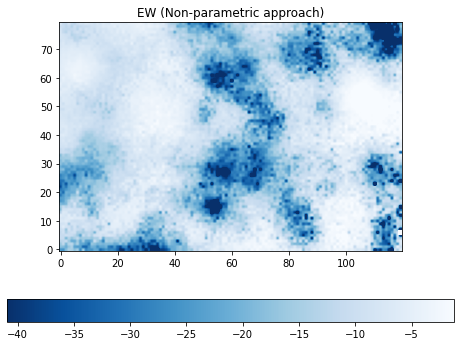

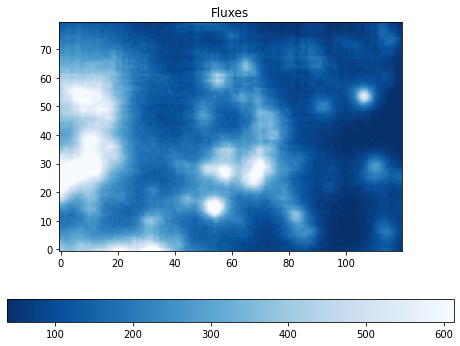

In [67]:

data= np.transpose(map_nonbinned_NP[0])
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (Non-parametric approach)")
plt.show()


###


data=region[index]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

# Velocity maps

In [68]:
rest_wave=wave/(1+z)

In [72]:
spec=region[:,10,10]

# chop data
x_chopped,y_chopped=chop_data(rest_wave,spec,halpha-40,halpha+40)
            
# smooth data
y_smooth=smooth_spectra(y_chopped,3)
            
# fit to continuum
cont=continuum(x_chopped,y_smooth)[0]

In [73]:
velocity(x_chopped,y_chopped,cont,halpha)

192.07420987642814

In [74]:
halpha

6563

In [75]:
map_vel=velocity_map(binned_region,rest_wave,halpha,halpha,kernel_size=3)

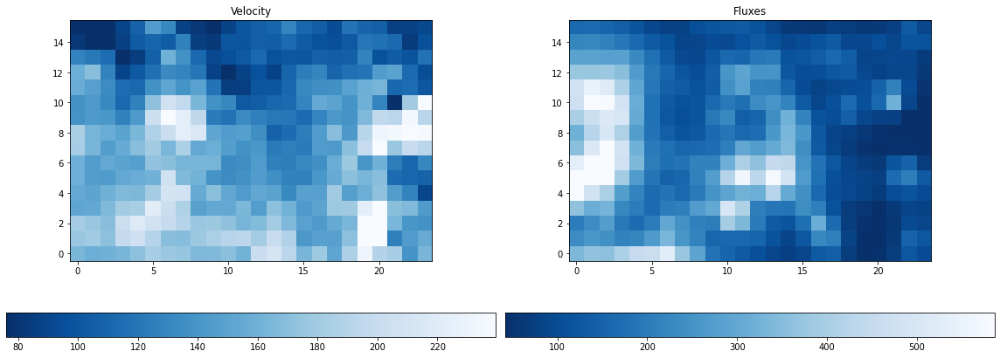

In [76]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

data = np.transpose(map_vel)
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')

im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))  
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("Velocity")

######

data = binned_region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)

im2 = ax[1].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title("Fluxes")

plt.tight_layout()
plt.show()


In [77]:
map_vel=velocity_map(region,rest_wave,halpha,halpha,kernel_size=3)

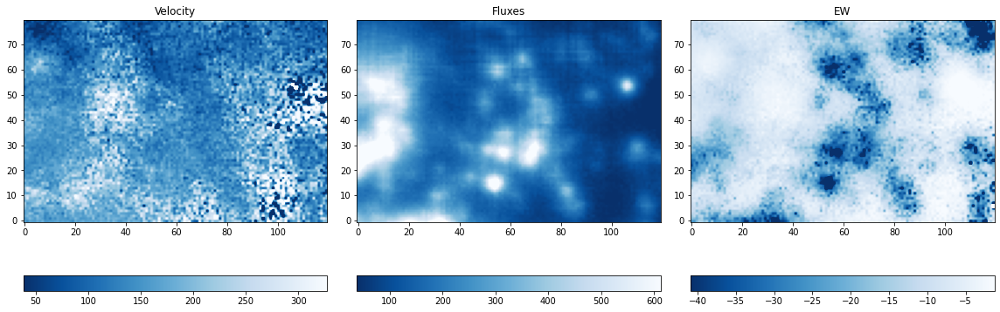

In [78]:

fig, ax = plt.subplots(1, 3, figsize=(16, 6))

data = np.transpose(map_vel)
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')

im1 = ax[0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))  
fig.colorbar(im1, ax=ax[0], orientation="horizontal")
ax[0].set_title("Velocity")

######

data = region[index]
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)

im2 = ax[1].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im2, ax=ax[1], orientation="horizontal")
ax[1].set_title("Fluxes")


######

data = np.transpose(map_nonbinned_NP[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)

im3 = ax[2].imshow(data, cmap='Blues_r', origin='lower', clim=(lo, up))
fig.colorbar(im3, ax=ax[2], orientation="horizontal")
ax[2].set_title("EW")

plt.tight_layout()
plt.show()

# Voronoi binning

goal: reach a chosen constant S/N per bin

2D

In [119]:
flux_map = region[index]
noise_values = region_err[index]
noise_values = noise_values.ravel()

voronoi_bins=voronoi(flux_map,noise_values,plots=False)

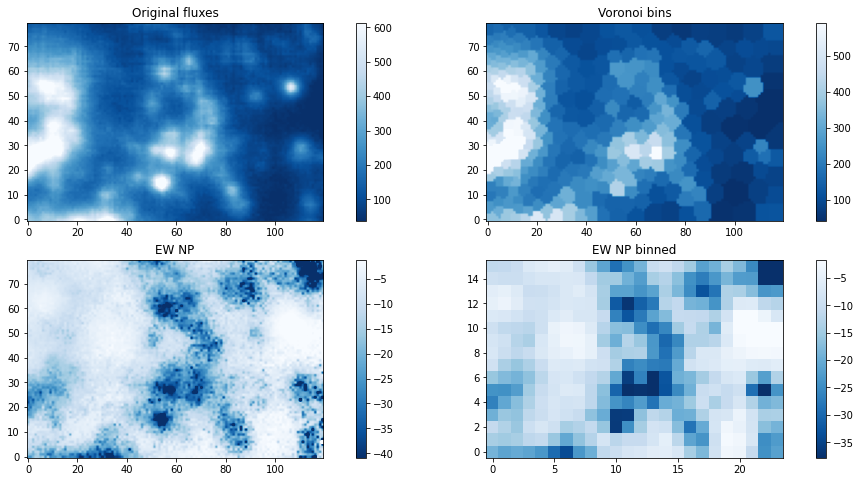

In [118]:
fig, ax = plt.subplots(2, 2, figsize=(20, 8))


####

data = flux_map
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[0,0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0,0])#, orientation="horizontal")
ax[0,0].set_title("Original fluxes")


####

data = np.transpose(voronoi_bins)
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[0,1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[0,1])#, orientation="horizontal")
ax[0,1].set_title("Voronoi bins")


####

data= np.transpose(map_nonbinned_NP[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[1,0].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[1,0])#, orientation="horizontal")
ax[1,0].set_title("EW NP")

####

data= np.transpose(map_NP[0])
lo, up = np.nanpercentile(data, 2), np.nanpercentile(data, 98)
cmap = plt.cm.Blues_r.copy()
im1 = ax[1,1].imshow(data, cmap=cmap, origin='lower', clim=(lo, up))
fig.colorbar(im1, ax=ax[1,1])#, orientation="horizontal")
ax[1,1].set_title("EW NP binned")

plt.subplots_adjust(wspace=-0.3, hspace=0.2)

3d: Voronoi binning each wavelength image

In [271]:
header

XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    3 / number of data axes                            
NAXIS1  =                  604 / length of data axis 1                          
NAXIS2  =                  341 / length of data axis 2                          
NAXIS3  =                 3681 / length of data axis 3                          
PCOUNT  =                    0 / required keyword; must = 0                     
GCOUNT  =                    1 / required keyword; must = 1                     
EXTNAME = 'DATA    '           / This extension contains data values            
HDUCLASS= 'ESO     '           / class name (ESO format)                        
HDUDOC  = 'DICD    '           / document with class description                
HDUVERS = 'DICD version 6'     / version number (according to spec v2.5.1)      
HDUCLAS1= 'IMAGE   '        

In [270]:
flux_map_3d=[]
data=region[index-50:index+50]
err=region_err[index-50:index+50]


for i in range(0,len(data)):
    print("binning wavelength = ",wave[index-50+i])
    flux = data[i]
    noise = err[i]
    noise = noise.ravel()

    flux_map_3d.append(voronoi(flux,noise,target_snr=40,plots=False))
    
    
flux_map_3d=np.array(flux_map_3d)

binning wavelength =  6560.9423828125
binning wavelength =  6562.1923828125
binning wavelength =  6563.4423828125
binning wavelength =  6564.6923828125
binning wavelength =  6565.9423828125
binning wavelength =  6567.1923828125
binning wavelength =  6568.4423828125
binning wavelength =  6569.6923828125
binning wavelength =  6570.9423828125
binning wavelength =  6572.1923828125
binning wavelength =  6573.4423828125
binning wavelength =  6574.6923828125
binning wavelength =  6575.9423828125
binning wavelength =  6577.1923828125
binning wavelength =  6578.4423828125
binning wavelength =  6579.6923828125
binning wavelength =  6580.9423828125
binning wavelength =  6582.1923828125
binning wavelength =  6583.4423828125
binning wavelength =  6584.6923828125
binning wavelength =  6585.9423828125
binning wavelength =  6587.1923828125
binning wavelength =  6588.4423828125
binning wavelength =  6589.6923828125
binning wavelength =  6590.9423828125
binning wavelength =  6592.1923828125
binning wave

In [143]:
wave_window=wave[index-50:index+50]

map_NP_voronoi=EW_map_non_parametric(flux_map_3d,wave_window,halpha_obs,kernel_size=3,plots=False)

TypeError: list indices must be integers or slices, not tuple

## Spectra at Hα

In [240]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

#plot_image(cube[index],wavelen,index,'Blues_r')


data=cube[index]

In [241]:
from astropy.stats import sigma_clipped_stats,gaussian_sigma_to_fwhm

from photutils import DAOStarFinder

mean, median, std = sigma_clipped_stats(data, sigma=5.0,maxiters=5) 
print((mean, median, std))

daofind = DAOStarFinder(fwhm=50, threshold=10.*std)

sources = daofind(data)

print("     Found %i stars in image " %len(sources))

(39.827423, 13.7210865, 63.754784)
     Found 6 stars in image 


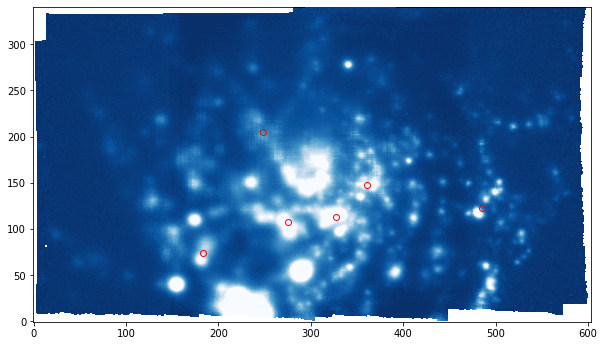

In [242]:

lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(10, 8))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
        
        
plt.plot(sources["xcentroid"],sources["ycentroid"],'or',mfc='none');

In [245]:
#defining (x,y) where we want to observe the spectra

i_brightest=np.argsort(sources['flux'])[0]

x_pos=int(sources[i_brightest][1])
y_pos=int(sources[i_brightest][2])

plotting spectra

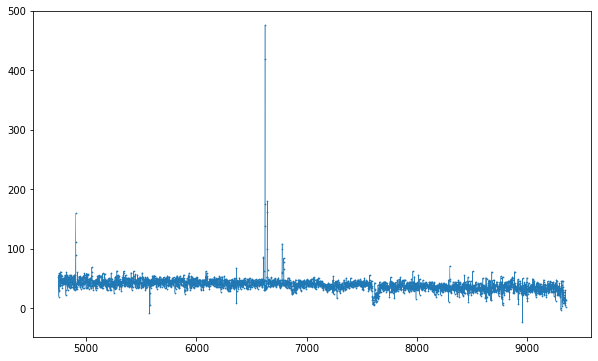

In [246]:
specdata=cube[:,y_pos,x_pos]

plt.figure(figsize=(10,6))

plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

Text(0.5, 1.0, 'Zoom in Halpha emission region')

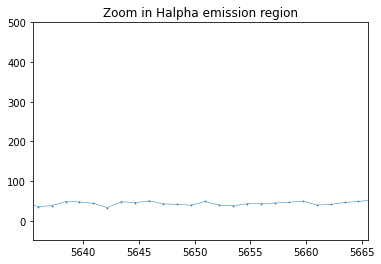

In [253]:
plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

plt.xlim(halpha_obs-15,halpha_obs+15)
#plt.ylim(-20,90)
plt.title("Zoom in Halpha emission region")

fitting a Gaussian

In [64]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6625)[1])

In [66]:
x = wave[bound1:bound2]
y = specdata[bound1:bound2]

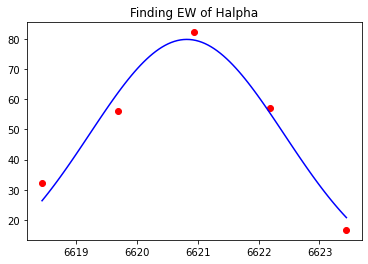

Fitted Amplitude (A): 79.7570857754474
Fitted Mean (mu): 6620.82077366716
Fitted Standard Deviation (sigma): 1.5989482179390269


In [67]:
initial_guess = [max(y), x[np.argmax(y)], 1]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(min(x), max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])

plt.scatter(x, y, label="Data", color="red")
plt.plot(x_fit, y_fit, label="Gaussian Fit", color="blue")

plt.title("Finding EW of Halpha")
plt.show()


# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")

Integral using Simpson's rule: 281.6268


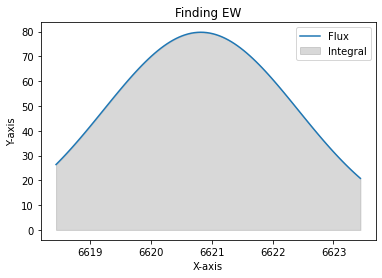

In [77]:

from scipy.integrate import simps

x = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

# Compute the integral using Simpson's rule
integral_simps = simps(y_fit, x)

print(f"Integral using Simpson's rule: {integral_simps:.4f}")

# Plot the curve
plt.plot(x, y_fit, label="Flux")
plt.fill_between(x, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


## Using Specutils

In [79]:
#from astropy.io import fits

from astropy import units as u

from astropy.visualization import quantity_support

quantity_support()  # for getting units on the axes below  

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x7f656aa54e80>

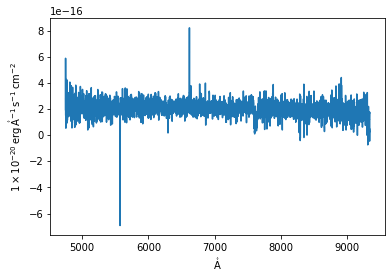

In [80]:
from specutils import Spectrum1D

lamb = wave * u.AA 

flux = specdata * 10**-17 * u.Unit(str(header["BUNIT"])) #taking the units from the header of the cube

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

f, ax = plt.subplots()  

ax.step(spec.spectral_axis, spec.flux) 
#ax.set_xlim(halpha_obs-15,halpha_obs+15)

Calculating SNR of the spectra

In [81]:
from specutils.analysis import snr_derived

snr_derived(spec)

<Quantity 4.432747>

In [82]:
import warnings

from specutils.fitting import fit_generic_continuum

with warnings.catch_warnings():  # Ignore warnings

    warnings.simplefilter('ignore')

    #normalizing by continuum estimate
    cont_norm_spec = spec / fit_generic_continuum(spec)(spec.spectral_axis) 

In [130]:
fit_generic_continuum.param_names

AttributeError: 'function' object has no attribute 'param_names'

ESTE ajuste está onde? fit_generic_continuum

(6598.263076399999, 6648.263076399999)

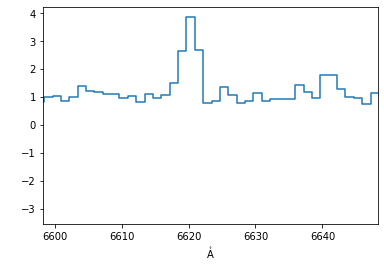

In [83]:
f, ax = plt.subplots()  

ax.step(cont_norm_spec.wavelength, cont_norm_spec.flux)  

ax.set_xlim((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm)  

In [84]:
from specutils import SpectralRegion

from specutils.analysis import equivalent_width

equivalent_width(cont_norm_spec, regions=SpectralRegion((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm))

<Quantity -11.53433117 Angstrom>

### Slicing a spectra into a particular region of interest

In [85]:
from specutils.manipulation import spectral_slab

ss = spectral_slab(cont_norm_spec, 5000.*u.AA, 5003.*u.AA)
ss

<Spectrum1D(flux=<Quantity [1.0896934 , 0.89806395]> (shape=(2,), mean=0.99388); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [5000.94238281 5002.19238281] Angstrom> (length=2))>

### Calculating Moments

In [86]:
from specutils.analysis import moment

m = moment(spec, order=1) 

m.shape  


print(m)

6953.192735554875 Angstrom


## Line Finding

In [87]:
cont_norm_spec; #continuum normalized spectra

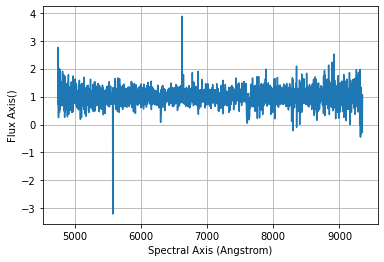

In [88]:
plt.plot(cont_norm_spec.spectral_axis, cont_norm_spec.flux) 

plt.xlabel('Spectral Axis ({})'.format(cont_norm_spec.spectral_axis.unit)) 

plt.ylabel('Flux Axis({})'.format(cont_norm_spec.flux.unit)) 

plt.grid(True)

Estimating uncertainty

In [89]:
ss = spectral_slab(cont_norm_spec, (halpha_obs-10)*u.AA, (halpha_obs+10)*u.AA) 
ss

<Spectrum1D(flux=<Quantity [0.83285743, 1.13031769, 0.9865351 , 1.07730173, 1.52001143,
           2.64860749, 3.87609295, 2.69161481, 0.78927651, 0.85823559,
           1.35906313, 1.08187466, 0.78013955, 0.85364203, 1.13819795,
           0.84613211]> (shape=(16,), mean=1.40437); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [6613.44238281 6614.69238281 6615.94238281 ... 6629.69238281 6630.94238281
 6632.19238281] Angstrom> (length=16))>

In [90]:
from specutils.manipulation import noise_region_uncertainty

noise_region = SpectralRegion(0*u.um, 3*u.um)

cont_norm_spec = noise_region_uncertainty(ss, noise_region)

from specutils.fitting import find_lines_threshold

lines = find_lines_threshold(ss, noise_factor=3)  

lines[lines['line_type'] == 'emission']


If you want to suppress this warning either type 'specutils.conf.do_continuum_function_check = False' or see http://docs.astropy.org/en/stable/config/#adding-new-configuration-items for other ways to configure the warning. [specutils.analysis.flux]


line_center,line_type,line_center_index
Angstrom,,
float64,str8,int64
6620.9423828125,emission,6


### Parameter Estimation

our specdata is in units 10**(-20) erg / (Angstrom s cm2) so we have to convert it to Jy using:

1 Jy = 10**(-23) erg/(cm^2)

In [91]:
(str(header["BUNIT"]))

'10**(-20)*erg/s/cm**2/Angstrom'

In [92]:
"""auxspec=specdata*10**(20) #this is in erg / (Angstrom s cm2)
auxspec=specdata*10**(20)*10**(-10) #this is in erg / ( s cm2)"""
auxspec=specdata*halpha_obs**2/(3.34*10**(-19))

In [93]:
lamb = wave * u.AA 
flux = auxspec * u.Unit(str('Jy')) 

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

In [99]:
from specutils import SpectralRegion

from specutils.fitting import estimate_line_parameters

from specutils.manipulation import extract_region

sub_region = SpectralRegion((halpha_obs-25)/10 *u.um, (halpha_obs+25)/10 *u.um)

sub_spectrum = extract_region(spec, sub_region)

In [100]:
result = estimate_line_parameters(spec, models.Gaussian1D())

print(result.amplitude)

print(result.mean) 

print(result.stddev) 

Parameter('amplitude', value=1.0786672501485288e+28, unit=Jy)
Parameter('mean', value=6953.192977414863, unit=Angstrom)
Parameter('stddev', value=1309.7939786398235, unit=Angstrom, bounds=(1.1754943508222875e-38, None))


In [97]:
from astropy.modeling import models
from specutils.fitting import fit_lines
from astropy import units as u


# Fit the spectrum and calculate the fitted flux values (``y_fit``)
g_init = models.Gaussian1D(amplitude=1.1*u.Jy, mean=halpha_obs*u.um, stddev=13*u.um)
g_fit = fit_lines(spec, g_init)


y_fit = g_fit(x*u.um)

# Plot the original spectrum and the fitted.
plt.plot(spec, , label="Original spectrum")
plt.plot(spec, y_fit, label="Fit result")
plt.title('Single fit peak')
plt.grid(True)
plt.legend()

SyntaxError: invalid syntax (1266487270.py, line 14)